In [7]:
%load_ext autoreload
%autoreload 2

In [8]:
import pickle
import random
from pathlib import Path

import chess
import iceberg as ice
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib.patches import Patch
import torch
from leela_interp import Lc0Model, Lc0sight, LeelaBoard
from leela_interp.core.iceberg_board import palette
from leela_interp.tools import figure_helpers as fh
from leela_interp.tools.piece_movement_heads import (
    bishop_heads,
    knight_heads,
    rook_heads,
)
from scipy.stats import binned_statistic

In [9]:
with open("interesting_puzzles.pkl", "rb") as f:
    puzzles = pickle.load(f)

with open("interesting_puzzles_all.pkl", "rb") as f:
    puzzles_all = pickle.load(f)

with open("interesting_puzzles_no_forcing.pkl", "rb") as f:
    puzzles_no_forcing = pickle.load(f)

len(puzzles), len(puzzles_all), len(puzzles_no_forcing)

(22517, 7612, 393)

The full dataset actually has 4M puzzles, but the scripts only consider the first 1M, and the default filters reduce that to 22k.

In [4]:
# Load lichess_db_puzzle.csv as a pandas DataFrame
puzzles_original = pd.read_csv("lichess_db_puzzle.csv")
puzzles_original.shape

(4062423, 10)

In [10]:
figure_dir = Path("figures")
figure_dir.mkdir(exist_ok=True)
different_targets_dir = figure_dir / "different_targets"
different_targets_dir.mkdir(exist_ok=True)
same_targets_dir = figure_dir / "same_targets"
same_targets_dir.mkdir(exist_ok=True)

In [11]:
boards = [LeelaBoard.from_puzzle(puzzle) for _, puzzle in puzzles.iterrows()]
first_target_squares = [
    puzzle.principal_variation[0][2:4] for _, puzzle in puzzles.iterrows()
]
second_target_squares = [
    puzzle.principal_variation[1][2:4] for _, puzzle in puzzles.iterrows()
]
third_target_squares = [
    puzzle.principal_variation[2][2:4] for _, puzzle in puzzles.iterrows()
]
first_target_indices = np.array(
    [board.sq2idx(square) for board, square in zip(boards, first_target_squares)]
)
second_target_indices = np.array(
    [board.sq2idx(square) for board, square in zip(boards, second_target_squares)]
)
third_target_indices = np.array(
    [board.sq2idx(square) for board, square in zip(boards, third_target_squares)]
)

In [12]:
#device = "cuda" if torch.cuda.is_available() else "cpu"
device = torch.device("cpu")
model = Lc0sight("lc0.onnx", device=device)

Using device: cpu


In [13]:
different_targets_mask = puzzles["different_targets"].to_numpy().astype(bool)
same_targets_mask = ~different_targets_mask
print(f"Same targets: {same_targets_mask.sum()} ({same_targets_mask.mean():.2%})")
print(
    f"Different targets: {different_targets_mask.sum()} ({different_targets_mask.mean():.2%})"
)

Same targets: 18702 (83.06%)
Different targets: 3815 (16.94%)


In [14]:
def prob_to_logodds(prob):
    return np.log(prob / (1 - prob))


def logodds_to_prob(logodds):
    return 1 / (1 + np.exp(-logodds))

# Global activation patching

## Residual stream

In [15]:
all_effects = -torch.load(
    "results/global_patching/interesting_puzzles_residual_stream_results.pt", map_location=device
)
all_effects_all = -torch.load(
    "results/global_patching/interesting_puzzles_all_residual_stream_results.pt", map_location=device
)
all_effects_no_forcing = -torch.load(
    "results/global_patching/interesting_puzzles_no_forcing_residual_stream_results.pt", map_location=device
)

/tmp/ipykernel_4129624/45796737.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  all_effects = -torch.load(
/tmp/ipykernel_4129624/45796737.py:4: FutureWarning: You are u

## Mate in 3 examples

In [35]:
def plot_examples(mask=None, n=5):
    if mask is None:
        mask = np.ones(len(puzzles), dtype=bool)

    effects = all_effects[mask]

    plots = []

    # Don't plot all the layers, it's too much
    layers = [0, 6, 8, 10, 12, 14]

    for i in range(n):
        puzzle = puzzles[mask].iloc[i]
        if "mateIn3" not in puzzle["Themes"]:
            continue
        else:
            print(i, puzzle.principal_variation)
        board = LeelaBoard.from_puzzle(puzzle)
        colormap_values, mappable = palette(
            effects[i][layers].cpu().numpy().ravel(),
            cmap="bwr",
            zero_center=True,
        )
        colormap_values = [
            colormap_values[j : j + 64] for j in range(0, 64 * len(layers), 64)
        ]
        new_plots = []
        for j, layer in enumerate(layers):
            max_effect_idx = effects[i, layer].abs().argmax()
            max_effect = effects[i, layer, max_effect_idx].item()
            new_plots.append(
                board.plot(
                    heatmap=colormap_values[j],
                    caption=f"L{layer}, max log odds reduction: {max_effect:.2f}",
                )
            )

        plots.append(ice.Arrange(new_plots, gap=10))

    return ice.Arrange(plots, gap=10, arrange_direction=ice.Arrange.Direction.VERTICAL)

11 ['c7c1', 'a1c1', 'c8c1', 'e3c1', 'e8e1']
51 ['h4h8', 'g8h8', 'f4h6', 'h8g8', 'h6g7']
68 ['d3b1', 'd2b1', 'd8d1', 'f3e1', 'd1e1']
73 ['c7d6', 'e7d8', 'c1c8', 'd8c8', 'd6c7']
89 ['f5g3', 'h2g3', 'h4g3', 'a4h4', 'h8h4']


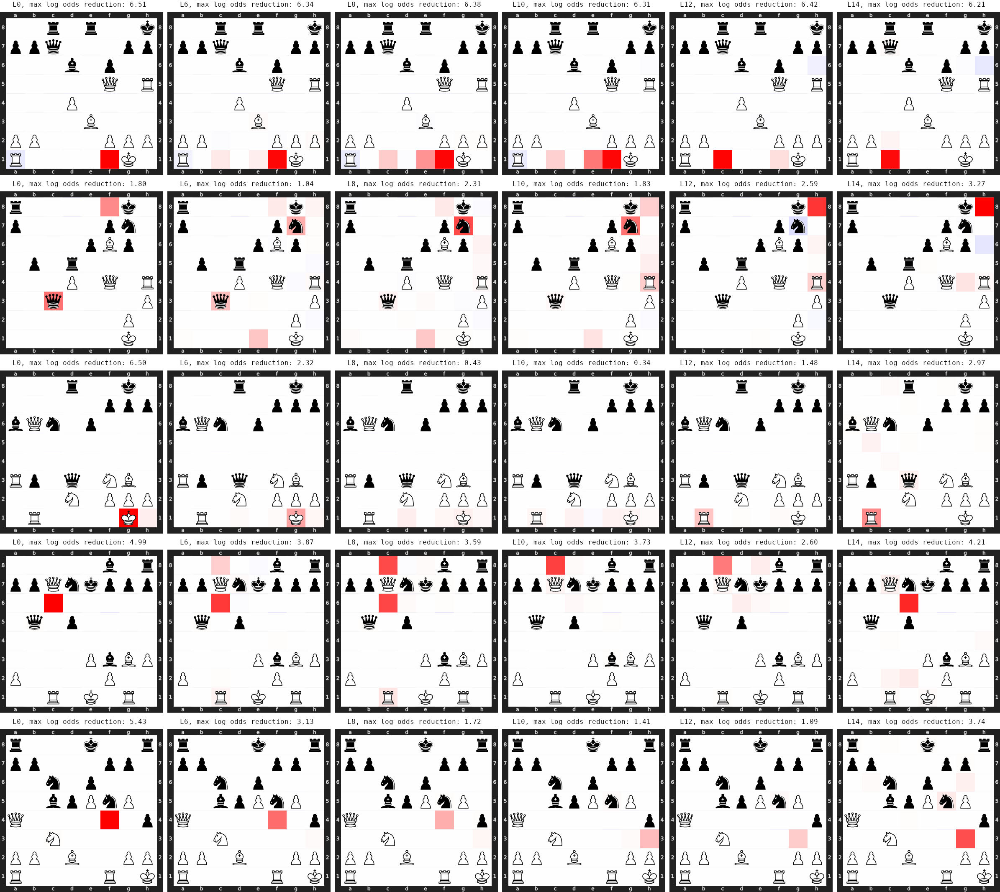

In [191]:
plot_examples(n=100)

## Ratings

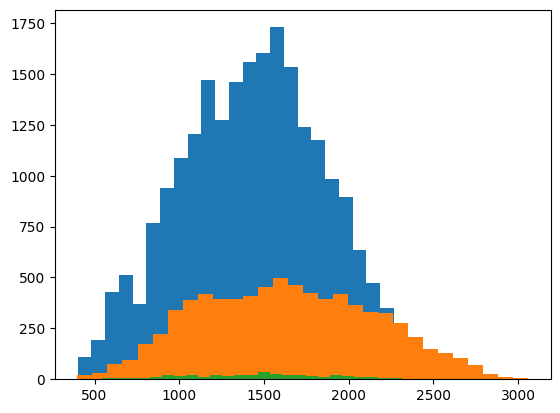

In [16]:
# Store puzzle ratings in a numpy array
puzzle_ratings = puzzles["Rating"].to_numpy()
puzzle_ratings_all = puzzles_all["Rating"].to_numpy()
puzzle_ratings_no_forcing = puzzles_no_forcing["Rating"].to_numpy()

# Plot histogram of puzzle ratings
plt.hist(puzzle_ratings, bins=30, label="Interesting")
plt.hist(puzzle_ratings_all, bins=30, label="All")
plt.hist(puzzle_ratings_no_forcing, bins=30, label="No forcing")
plt.show()

In [17]:
def map_to_possibility(moves):
    mapping = {}
    result = []
    counter = 1
    
    for move in moves:
        if move not in mapping:
            mapping[move] = str(counter)
            counter += 1
        result.append(mapping[move])
    
    return result

def get_possibility_indices(puzzles, include_starting=False):
    possibilities = []
    indices = {}

    for i, (_, puzzle) in enumerate(puzzles.iterrows()):
        pv = puzzle.principal_variation
        moves = []
        for j in range(len(pv)):
            if include_starting:
                moves += [pv[j][0:2]]
            moves.append(pv[j][2:4])
        possibility = ''.join(map_to_possibility(moves))
        if possibility not in indices:
            indices[possibility] = []
        indices[possibility].append(i)
        possibilities.append(possibility)
    
    return indices

result = get_possibility_indices(puzzles, include_starting=False)
result_all = get_possibility_indices(puzzles_all, include_starting=False)
result_no_forcing = get_possibility_indices(puzzles_no_forcing, include_starting=False)
result_starting = get_possibility_indices(puzzles, include_starting=True)
result_all_starting = get_possibility_indices(puzzles_all, include_starting=True)
result_no_forcing_starting = get_possibility_indices(puzzles_no_forcing, include_starting=True)

# Only consider cases with more than N examples
n_examples = 10
good_results = {k: v for k, v in result.items() if len(v) > n_examples}
good_results_all = {k: v for k, v in result_all.items() if len(v) > n_examples}
good_results_no_forcing = {k: v for k, v in result_no_forcing.items() if len(v) > n_examples}
good_results_starting = {k: v for k, v in result_starting.items() if len(v) > n_examples}
good_results_all_starting = {k: v for k, v in result_all_starting.items() if len(v) > n_examples}
good_results_no_forcing_starting = {k: v for k, v in result_no_forcing_starting.items() if len(v) > n_examples}

# Order by number of elements
good_results = {k: v for k, v in sorted(good_results.items(), key=lambda item: len(item[1]), reverse=True)}
good_results_all = {k: v for k, v in sorted(good_results_all.items(), key=lambda item: len(item[1]), reverse=True)}
good_results_no_forcing = {k: v for k, v in sorted(good_results_no_forcing.items(), key=lambda item: len(item[1]), reverse=True)}
good_results_starting = {k: v for k, v in sorted(good_results_starting.items(), key=lambda item: len(item[1]), reverse=True)}
good_results_all_starting = {k: v for k, v in sorted(good_results_all_starting.items(), key=lambda item: len(item[1]), reverse=True)}
good_results_no_forcing_starting = {k: v for k, v in sorted(good_results_no_forcing_starting.items(), key=lambda item: len(item[1]), reverse=True)}

len(good_results), len(good_results_all), len(good_results_no_forcing), len(good_results_starting), len(good_results_all_starting), len(good_results_no_forcing_starting)

(42, 37, 6, 87, 72, 8)

In [18]:
# Create mask to apply to puzzles, given in indices in good_results
good_mask = np.zeros((len(good_results), len(puzzles)), dtype=bool)
good_mask_all = np.zeros((len(good_results_all), len(puzzles_all)), dtype=bool)
good_mask_no_forcing = np.zeros((len(good_results_no_forcing), len(puzzles_no_forcing)), dtype=bool)
good_mask_starting = np.zeros((len(good_results_starting), len(puzzles)), dtype=bool)
good_mask_all_starting = np.zeros((len(good_results_all_starting), len(puzzles_all)), dtype=bool)
good_mask_no_forcing_starting = np.zeros((len(good_results_no_forcing_starting), len(puzzles_no_forcing)), dtype=bool)
for i, (_, idx_list) in enumerate(good_results.items()):
    good_mask[i, idx_list] = True
for i, (_, idx_list) in enumerate(good_results_all.items()):
    good_mask_all[i, idx_list] = True
for i, (_, idx_list) in enumerate(good_results_no_forcing.items()):
    good_mask_no_forcing[i, idx_list] = True
for i, (_, idx_list) in enumerate(good_results_starting.items()):
    good_mask_starting[i, idx_list] = True
for i, (_, idx_list) in enumerate(good_results_all_starting.items()):
    good_mask_all_starting[i, idx_list] = True
for i, (_, idx_list) in enumerate(good_results_no_forcing_starting.items()):
    good_mask_no_forcing_starting[i, idx_list] = True

### Exporting interesting puzzles

In [18]:
len(good_results['11231'])

1360

In [119]:
# Save 11231 puzzles in interesting_puzzles_11231.pkl
with open("interesting_puzzles_11234.pkl", "wb") as f:
    pickle.dump(puzzles.iloc[good_results['11234']], f)

# Effects

In [38]:
def check_no_common_elements(list_of_sublists, ignore_even=False):
    # Convert each sublist to a set
    set_list = [set(list_of_sublists[0]), set(list_of_sublists[1])] + [set(sublist) for i, sublist in enumerate(list_of_sublists[2:]) if i % 2 != 0 or not ignore_even]
    
    # Check each pair of sets for intersection
    for i in range(len(set_list)):
        for j in range(i + 1, len(set_list)):
            if set_list[i].intersection(set_list[j]):
                return False  # Found common element(s)
    
    return True  # No common elements found

def get_effects_data(all_effects=all_effects, mask=None, allowed_lengths=list(range(3, 17)), include_starting=False, apply_mask=True, rating_range=(0, 5000), verbose=False):
    if mask is None:
        mask = np.ones(len(puzzles), dtype=bool)

    effects = all_effects[mask]

    candidate_effects = []
    follow_up_effects = {}
    max_length = max(allowed_lengths)
    for j in range(2, max_length + 1):
        follow_up_effects[j] = []
    if include_starting:
        starting_effects = {}
        for j in range(1, max_length + 1):
            starting_effects[j] = []
    intersection_skips = 0
    patching_square_effects = []
    other_effects = []
    skipped = []
    non_skipped = []

    for i, (idx, puzzle) in enumerate(puzzles[mask].iterrows()):
        # Should never happen on hard puzzles
        pv = puzzle.principal_variation
        if len(pv) not in allowed_lengths:# or "mateIn3" not in puzzle["Themes"]:
            skipped.append(idx)
            continue
        if not (rating_range[0] <= puzzle["Rating"] <= rating_range[1]):
            skipped.append(idx)
            continue
        # if puzzle.sparring_full_pv_probs[1] < 0.5:
        #     skipped.append(idx)
        #     continue
        board = LeelaBoard.from_puzzle(puzzle)
        corrupted_board = LeelaBoard.from_fen(puzzle.corrupted_fen)

        # Figure out which square(s) differ in the corrupted position
        patching_squares = []
        for square in chess.SQUARES:
            if board.pc_board.piece_at(square) != corrupted_board.pc_board.piece_at(
                square
            ):
                patching_squares.append(chess.SQUARE_NAMES[square])

        movs = [pv[j][2:4] for j in range(len(pv))]
        if include_starting:
            starts = [pv[j][0:2] for j in range(len(pv))]
        if not apply_mask:
            if movs[0] == movs[2]:
                skipped.append(idx)
                continue

        candidate_squares = [movs[0]]
        follow_up_squares = {}
        for j in range(2, max_length + 1):
            follow_up_squares[j] = [movs[j-1]] if len(movs) >= j and ((movs[j-1] not in movs[:j-1]) or apply_mask) else []
            #follow_up_squares[j] = [movs[j-1]] if len(movs) >= j and movs[j-1] not in (movs[:j-1]+movs[j:]) else []

        if include_starting:
            starting_squares = {}
            for j in range(1, max_length + 1):
                starting_squares[j] = [starts[j-1]] if len(starts) >= j and ((starts[j-1] not in starts[:j-1] + movs) or apply_mask) else []

        if set(patching_squares).intersection(set(movs + (starts if include_starting else []))):
            skipped.append(idx)
            intersection_skips += 1
            continue

        non_skipped.append(idx)
        candidate_effects.append(
            effects[i, :, [board.sq2idx(square) for square in candidate_squares]]
            .amax(-1)
            .cpu()
            .numpy()
        )
        for j in range(2, max_length + 1):
            if len(follow_up_squares[j]) > 0:
                follow_up_effects[j].append(
                    effects[i, :, [board.sq2idx(square) for square in follow_up_squares[j]]]
                    .amax(-1)
                    .cpu()
                    .numpy()
                )
        if include_starting:
            for j in range(1, max_length + 1):
                if len(starting_squares[j]) > 0:
                    starting_effects[j].append(
                            effects[i, :, [board.sq2idx(square) for square in starting_squares[j]]]
                            .amax(-1)
                            .cpu()
                            .numpy()
                        )
        patching_square_effects.append(
            effects[i, :, [board.sq2idx(square) for square in patching_squares]]
            .amax(-1)
            .cpu()
            .numpy()
        )
        if include_starting:
            covered_squares = set(candidate_squares + patching_squares + 
                                sum([starting_squares[j] for j in range(1, max_length + 1)], []) +
                                sum([follow_up_squares[j] for j in range(2, max_length + 1)], []))
        else:
            covered_squares = set(candidate_squares + patching_squares + sum([follow_up_squares[j] for j in range(2, max_length + 1)], []))
        other_effects.append(
            effects[
                i,
                :,
                [idx for idx in range(64) if board.idx2sq(idx) not in covered_squares],
            ]
            .amax(-1)
            .cpu()
            .numpy()
        )

    if verbose:
        print(
            f"Skipped {len(skipped)} out of {mask.sum()} puzzles ({len(skipped)/mask.sum():.2%})"
        )
        print(f"Intersection skips: {intersection_skips} out of {mask.sum()} puzzles ({intersection_skips/mask.sum():.2%})")

    candidate_effects = np.stack(candidate_effects)
    for j in range(2, max_length + 1):
        if len(follow_up_effects[j]) > 0:
            follow_up_effects[j] = np.stack(follow_up_effects[j])
    if include_starting:
        for j in range(1, max_length + 1):
            if len(starting_effects[j]) > 0:
                starting_effects[j] = np.stack(starting_effects[j])
    patching_square_effects = np.stack(patching_square_effects)
    other_effects = np.stack(other_effects)
    if verbose:
        print(f"Patching: {len(patching_square_effects)}, Other: {len(other_effects)}")

    def print_effects(effects_dict, prefix):
        print(f"{prefix}::", end=" ")
        for i in range(1, max_length + 1):
            if i in effects_dict:
                suffix = "st" if i == 1 else "nd" if i == 2 else "rd" if i == 3 else "th"
                print(f"{i}{suffix}: {len(effects_dict[i])}", end=", ")
        print()

    if verbose:
        print_effects({1: candidate_effects, **{i: follow_up_effects[i] for i in range(2, max_length + 1)}}, "End square")
        if include_starting:
            print_effects(starting_effects, "Start square")

    # Define lists for effects and their configurations
    effects_data = [
        {"effects": patching_square_effects, "name": "Patched"},
        {"effects": other_effects, "name": "Other"},
        {"effects": candidate_effects, "name": "1"},
    ]
    for j in range(2, max_length + 1):
        effects_data.append({"effects": follow_up_effects[j], "name": f"{j}"})
    if include_starting:
        for j in range(1, max_length + 1):
            effects_data.append({"effects": starting_effects[j], "name": f"{j}"})
    return effects_data, non_skipped

In [25]:
def plot_residual_effects(all_effects=all_effects, mask=None, save_path=None, allowed_lengths=[3, 4, 5, 6, 7], include_starting=False, apply_mask=True, rating_range=(0, 3000), plot_ci=True):
    if mask is None:
        mask = np.ones(len(puzzles), dtype=bool)

    effects_data, _ = get_effects_data(all_effects, mask, allowed_lengths, include_starting, apply_mask, rating_range)

    fh.set()

    colors = plt.cm.tab20(np.linspace(0, 1, 20)).tolist()
    layers = list(range(15))

    # Create plots using matplotlib
    fig, ax = plt.subplots()
    fig.set_figwidth(10)
    fig.set_figheight(5)

    line_styles = ["-"] * 2 + ["-", "--"] * ((allowed_lengths[-1] - 1) // 2) + ["-"]
    line_styles += ["-.", ":"] * ((allowed_lengths[-1] - 1) // 2)

    for i, effect_data in enumerate(effects_data):
        effects = effect_data["effects"]
        if len(effects) == 0:
            continue
        
        mean_effects = np.mean(effects, axis=0)
        
        # Calculate confidence intervals
        if plot_ci:
            ci_50 = np.quantile(effects, [0.25, 0.75], axis=0)
            ci_70 = np.quantile(effects, [0.15, 0.85], axis=0)
            ci_90 = np.quantile(effects, [0.05, 0.95], axis=0)
            ci_100 = np.quantile(effects, [0, 1], axis=0)

        ax.plot(
            layers,
            mean_effects,
            label=effect_data["name"],
            color=colors[i],
            linestyle=line_styles[i],
            linewidth= 3 * fh.LINE_WIDTH,
        )
        if plot_ci:
            ax.fill_between(
                layers,
                ci_90[0],
                ci_90[1],
                color=colors[i],
                alpha=0.1,
            )
            ax.fill_between(
                layers,
                ci_50[0],
                ci_50[1],
                color=colors[i],
                alpha=0.3,
            )

    # ax.set_title("Patching effects on different squares by layer")
    ax.set_xlabel("Layer")
    ax.set_ylabel("Log odds reduction of correct move")
    _, y_max = ax.get_ylim()
    ax.set_ylim(1e-2, 8)
    #ax.set_yscale("log")
    ax.legend()
    ax.spines[["right", "top", "left"]].set_visible(False)
    ax.set_facecolor(fh.PLOT_FACE_COLOR)

    if save_path is not None:
        fh.save(save_path, fig)

    plt.show()

def plot_rating(all_effects=all_effects, mask=None, save_path=None, allowed_lengths=[3, 4, 5, 6, 7], include_starting=False, apply_mask=True):
    if mask is None:
        mask = np.ones(len(puzzles), dtype=bool)

    effects_data, non_skipped = get_effects_data(mask, allowed_lengths, include_starting, apply_mask)
    relevant_ratings = puzzles.loc[non_skipped, "Rating"]

    fh.set()

    colors = plt.cm.tab20(np.linspace(0, 1, 20)).tolist()
    layers = list(range(15))

    # Create plots using matplotlib
    fig, ax = plt.subplots()
    fig.set_figwidth(10)
    fig.set_figheight(5)

    line_styles = ["-"] * 2 + ["-", "--"] * ((allowed_lengths[-1] - 1) // 2) + ["-"]
    line_styles += ["-.", ":"] * ((allowed_lengths[-1] - 1) // 2)

    for i, effect_data in enumerate(effects_data):
        effects = effect_data["effects"]
        if len(effects) == 0:
            continue

        # Group the ratings into bins and calculate the average and std per bin
        bin_means, bin_edges, binnumber = binned_statistic(
            relevant_ratings, np.max(effects, axis=1), statistic='mean', bins=10
        )
        bin_std, _, _ = binned_statistic(
            relevant_ratings, np.max(effects, axis=1), statistic='std', bins=10
        )
        
        bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])
        
        ax.errorbar(
            bin_centers,
            bin_means,
            yerr=bin_std,
            label=effect_data["name"],
            fmt='o-',
            color=colors[i]
        )

    # ax.set_title("Patching effects on different squares by layer")
    ax.set_xlabel("Rating")
    ax.set_ylabel("Log odds reduction of correct move")
    _, y_max = ax.get_ylim()
    #ax.set_ylim(1e-2, 8)
    #ax.set_yscale("log")
    ax.legend()
    ax.spines[["right", "top", "left"]].set_visible(False)
    ax.set_facecolor(fh.PLOT_FACE_COLOR)

    if save_path is not None:
        fh.save(save_path, fig)

    plt.show()

def plot_rating_layer(all_effects=all_effects, mask=None, save_path=None, allowed_lengths=[3, 4, 5, 6, 7], include_starting=False, apply_mask=True):
    if mask is None:
        mask = np.ones(len(puzzles), dtype=bool)

    effects_data, non_skipped = get_effects_data(mask, allowed_lengths, include_starting, apply_mask)
    relevant_ratings = puzzles.loc[non_skipped, "Rating"]

    fh.set()

    colors = plt.cm.tab20(np.linspace(0, 1, 20)).tolist()
    layers = list(range(15))

    fig, ax = plt.subplots()
    fig.set_figwidth(10)
    fig.set_figheight(5)

    line_styles = ["-"] * 2 + ["-", "--"] * ((allowed_lengths[-1] - 1) // 2) + ["-"]
    line_styles += ["-.", ":"] * ((allowed_lengths[-1] - 1) // 2)

    for i, effect_data in enumerate(effects_data):
        effects = effect_data["effects"]
        if len(effects) == 0:
            continue
        
        #mean_effects = np.mean(effects, axis=0)
        #print(effects.shape, relevant_ratings.shape)

        # Group the ratings into bins and calculate the average and std per bin
        bin_means, bin_edges, binnumber = binned_statistic(
            relevant_ratings, np.argmax(effects, axis=1), statistic='mean', bins=10
        )
        bin_std, _, _ = binned_statistic(
            relevant_ratings, np.argmax(effects, axis=1), statistic='std', bins=10
        )
        
        bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])
        
        ax.errorbar(
            bin_centers,
            bin_means,
            yerr=bin_std,
            label=effect_data["name"],
            fmt='o-',
            color=colors[i]
        )

    # ax.set_title("Patching effects on different squares by layer")
    ax.set_xlabel("Rating")
    ax.set_ylabel("Layer")
    _, y_max = ax.get_ylim()
    #ax.set_ylim(1e-2, 8)
    #ax.set_yscale("log")
    ax.legend()
    ax.spines[["right", "top", "left"]].set_visible(False)
    ax.set_facecolor(fh.PLOT_FACE_COLOR)

    if save_path is not None:
        fh.save(save_path, fig)

    plt.show()

112
Skipped 787 out of 7394 puzzles (10.64%)
Intersection skips: 787 out of 7394 puzzles (10.64%)
Patching: 6607, Other: 6607
End square:: 1st: 6607, 2nd: 6607, 3rd: 6607, 4th: 0, 5th: 0, 6th: 0, 7th: 0, 


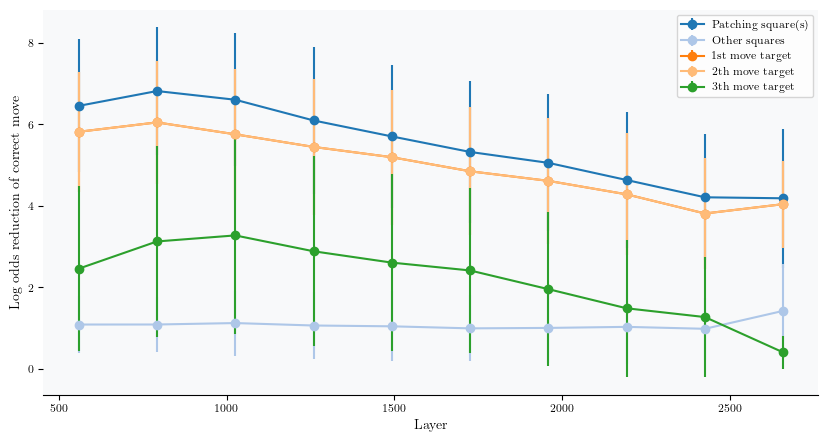

Skipped 787 out of 7394 puzzles (10.64%)
Intersection skips: 787 out of 7394 puzzles (10.64%)
Patching: 6607, Other: 6607
End square:: 1st: 6607, 2nd: 6607, 3rd: 6607, 4th: 0, 5th: 0, 6th: 0, 7th: 0, 


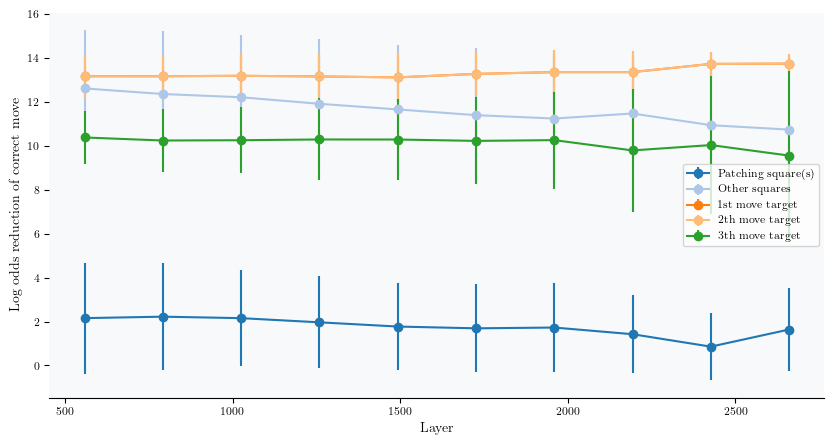

111
Skipped 84 out of 3853 puzzles (2.18%)
Intersection skips: 84 out of 3853 puzzles (2.18%)
Patching: 3769, Other: 3769
End square:: 1st: 3769, 2nd: 3769, 3rd: 3769, 4th: 0, 5th: 0, 6th: 0, 7th: 0, 


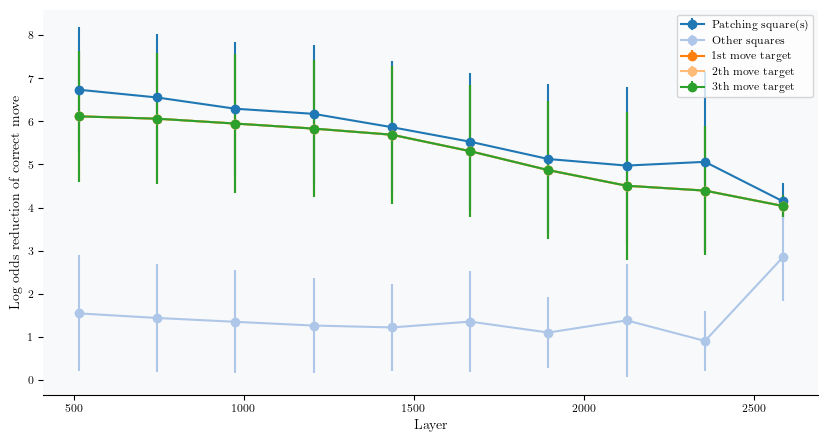

Skipped 84 out of 3853 puzzles (2.18%)
Intersection skips: 84 out of 3853 puzzles (2.18%)
Patching: 3769, Other: 3769
End square:: 1st: 3769, 2nd: 3769, 3rd: 3769, 4th: 0, 5th: 0, 6th: 0, 7th: 0, 


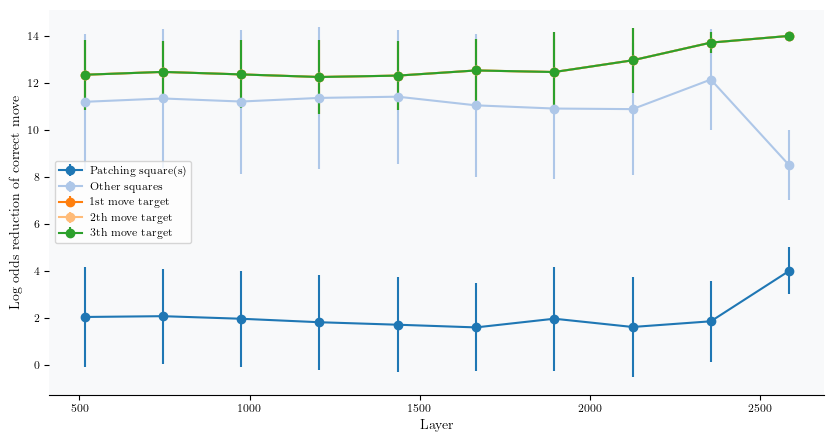

11234
Skipped 1112 out of 3126 puzzles (35.57%)
Intersection skips: 1112 out of 3126 puzzles (35.57%)
Patching: 2014, Other: 2014
End square:: 1st: 2014, 2nd: 2014, 3rd: 2014, 4th: 2014, 5th: 2014, 6th: 0, 7th: 0, 


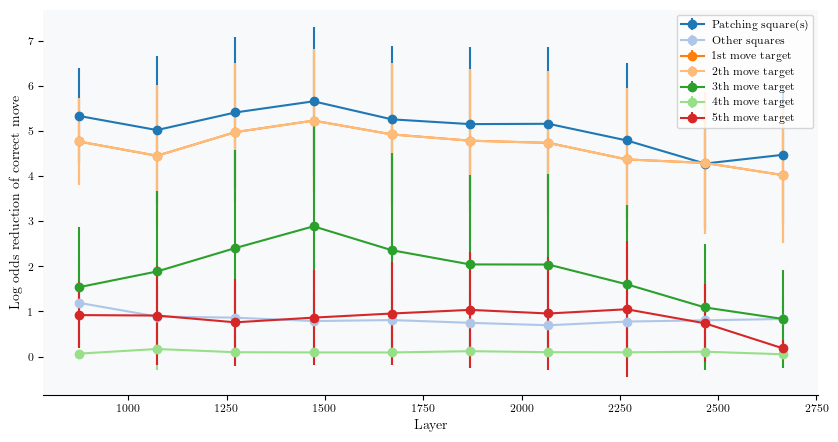

Skipped 1112 out of 3126 puzzles (35.57%)
Intersection skips: 1112 out of 3126 puzzles (35.57%)
Patching: 2014, Other: 2014
End square:: 1st: 2014, 2nd: 2014, 3rd: 2014, 4th: 2014, 5th: 2014, 6th: 0, 7th: 0, 


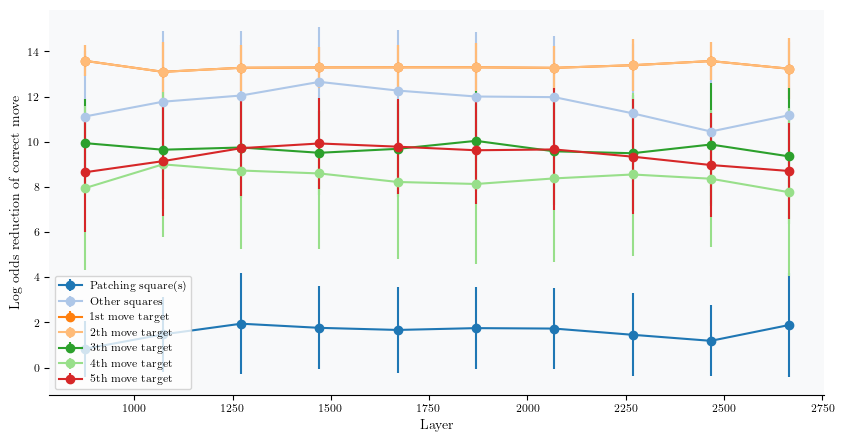

123
Skipped 479 out of 2455 puzzles (19.51%)
Intersection skips: 479 out of 2455 puzzles (19.51%)
Patching: 1976, Other: 1976
End square:: 1st: 1976, 2nd: 1976, 3rd: 1976, 4th: 0, 5th: 0, 6th: 0, 7th: 0, 


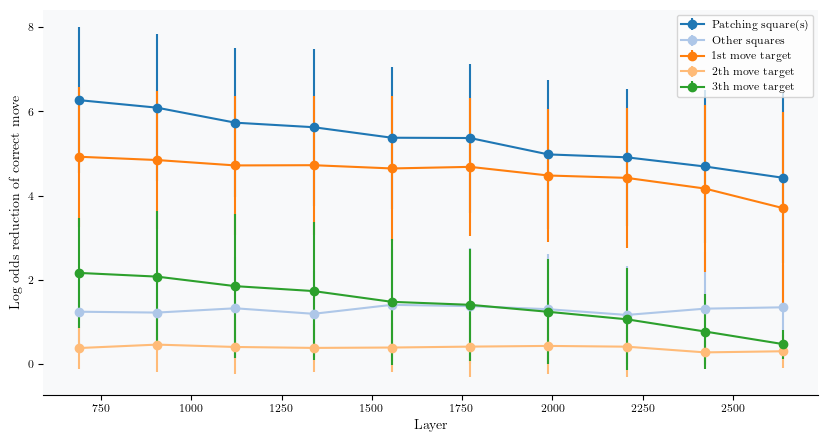

Skipped 479 out of 2455 puzzles (19.51%)
Intersection skips: 479 out of 2455 puzzles (19.51%)
Patching: 1976, Other: 1976
End square:: 1st: 1976, 2nd: 1976, 3rd: 1976, 4th: 0, 5th: 0, 6th: 0, 7th: 0, 


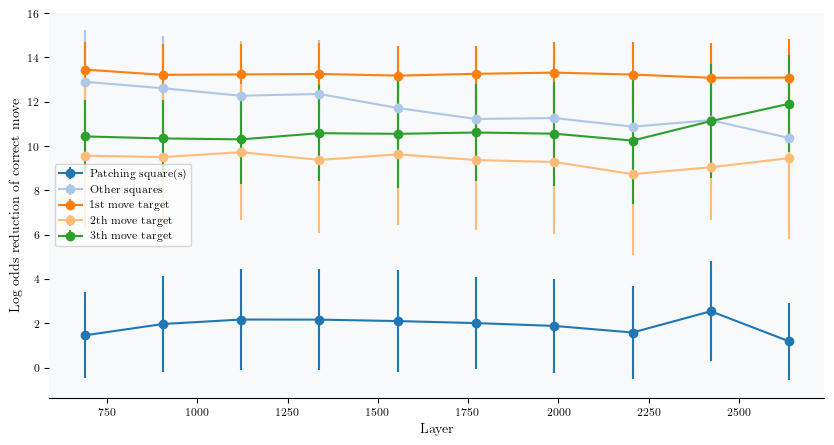

11231
Skipped 246 out of 1360 puzzles (18.09%)
Intersection skips: 246 out of 1360 puzzles (18.09%)
Patching: 1114, Other: 1114
End square:: 1st: 1114, 2nd: 1114, 3rd: 1114, 4th: 1114, 5th: 1114, 6th: 0, 7th: 0, 


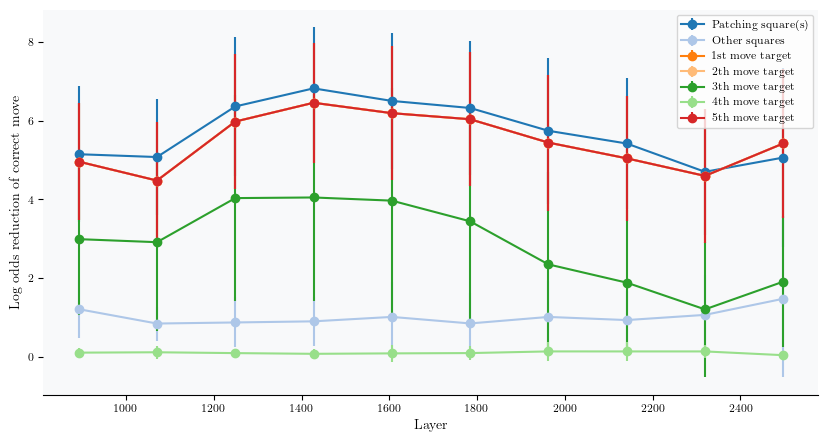

Skipped 246 out of 1360 puzzles (18.09%)
Intersection skips: 246 out of 1360 puzzles (18.09%)
Patching: 1114, Other: 1114
End square:: 1st: 1114, 2nd: 1114, 3rd: 1114, 4th: 1114, 5th: 1114, 6th: 0, 7th: 0, 


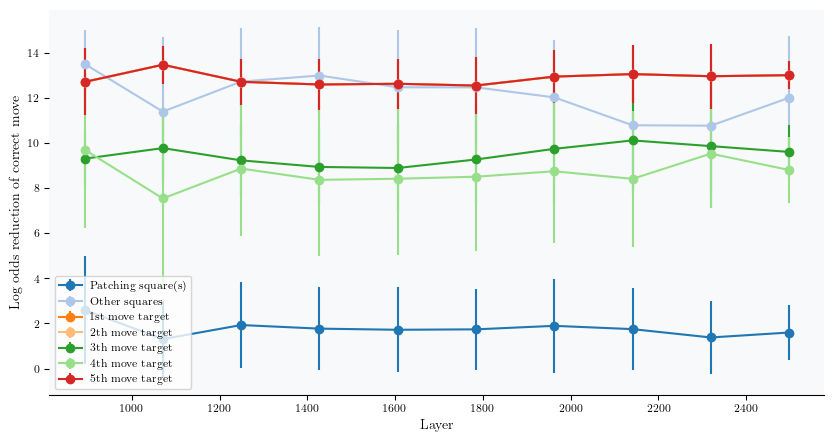

11233
Skipped 66 out of 676 puzzles (9.76%)
Intersection skips: 66 out of 676 puzzles (9.76%)
Patching: 610, Other: 610
End square:: 1st: 610, 2nd: 610, 3rd: 610, 4th: 610, 5th: 610, 6th: 0, 7th: 0, 


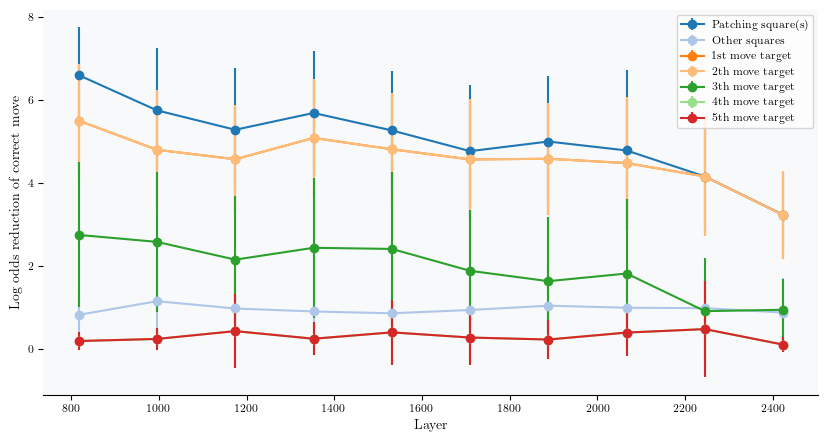

Skipped 66 out of 676 puzzles (9.76%)
Intersection skips: 66 out of 676 puzzles (9.76%)
Patching: 610, Other: 610
End square:: 1st: 610, 2nd: 610, 3rd: 610, 4th: 610, 5th: 610, 6th: 0, 7th: 0, 


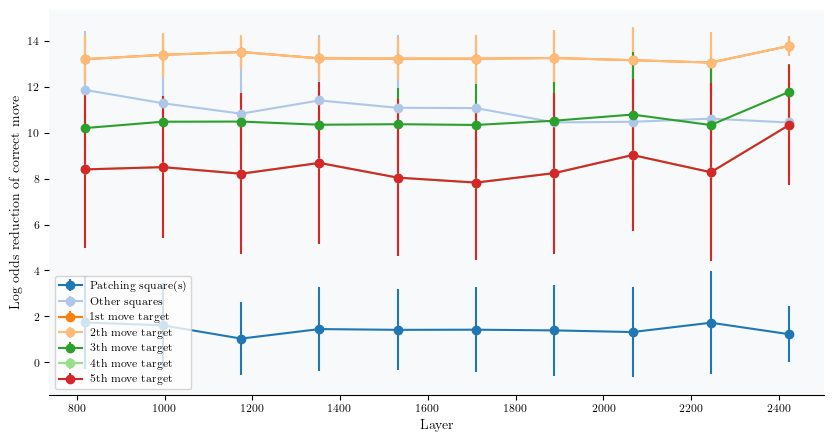

12345
Skipped 134 out of 430 puzzles (31.16%)
Intersection skips: 134 out of 430 puzzles (31.16%)
Patching: 296, Other: 296
End square:: 1st: 296, 2nd: 296, 3rd: 296, 4th: 296, 5th: 296, 6th: 0, 7th: 0, 


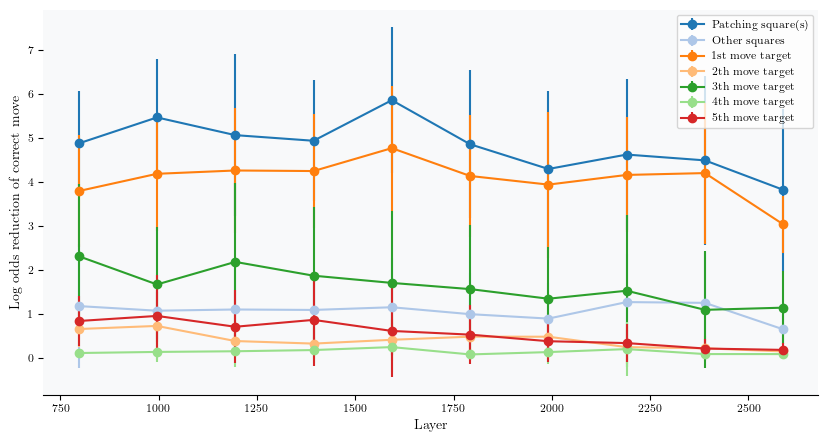

Skipped 134 out of 430 puzzles (31.16%)
Intersection skips: 134 out of 430 puzzles (31.16%)
Patching: 296, Other: 296
End square:: 1st: 296, 2nd: 296, 3rd: 296, 4th: 296, 5th: 296, 6th: 0, 7th: 0, 


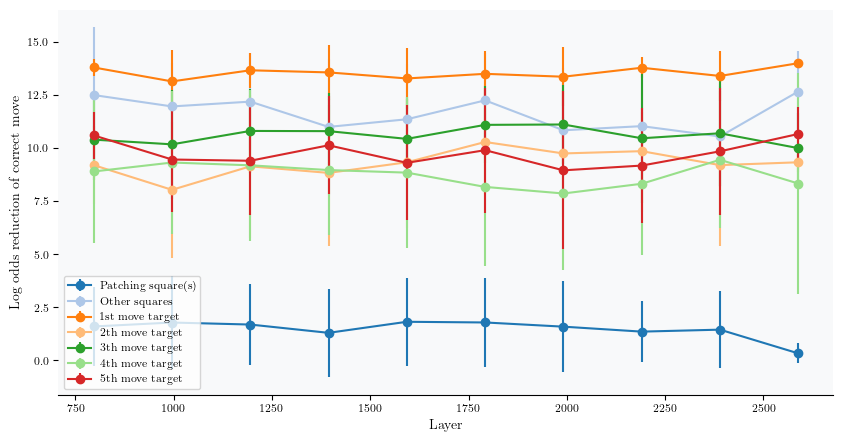

11222
Skipped 30 out of 305 puzzles (9.84%)
Intersection skips: 30 out of 305 puzzles (9.84%)
Patching: 275, Other: 275
End square:: 1st: 275, 2nd: 275, 3rd: 275, 4th: 275, 5th: 275, 6th: 0, 7th: 0, 


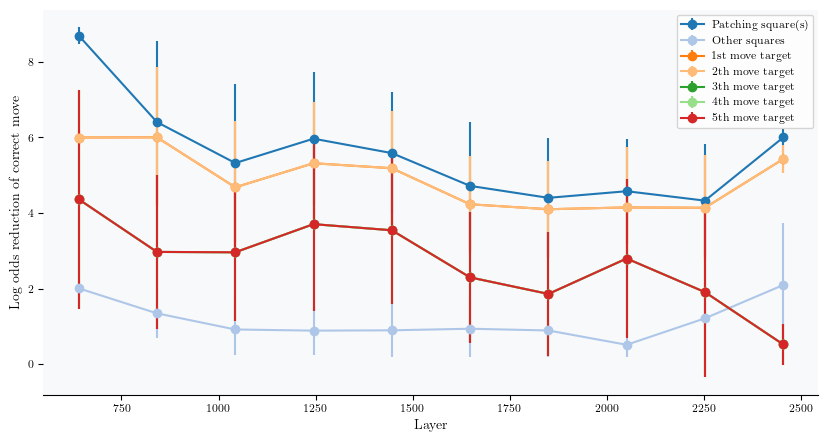

Skipped 30 out of 305 puzzles (9.84%)
Intersection skips: 30 out of 305 puzzles (9.84%)
Patching: 275, Other: 275
End square:: 1st: 275, 2nd: 275, 3rd: 275, 4th: 275, 5th: 275, 6th: 0, 7th: 0, 


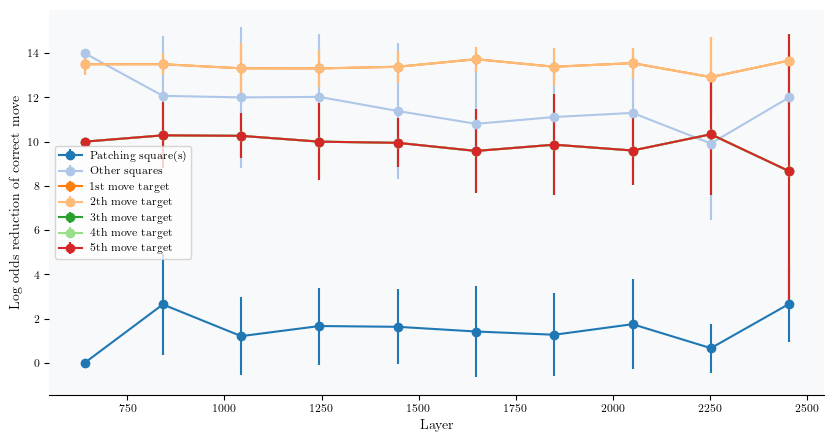

12334
Skipped 89 out of 237 puzzles (37.55%)
Intersection skips: 89 out of 237 puzzles (37.55%)
Patching: 148, Other: 148
End square:: 1st: 148, 2nd: 148, 3rd: 148, 4th: 148, 5th: 148, 6th: 0, 7th: 0, 


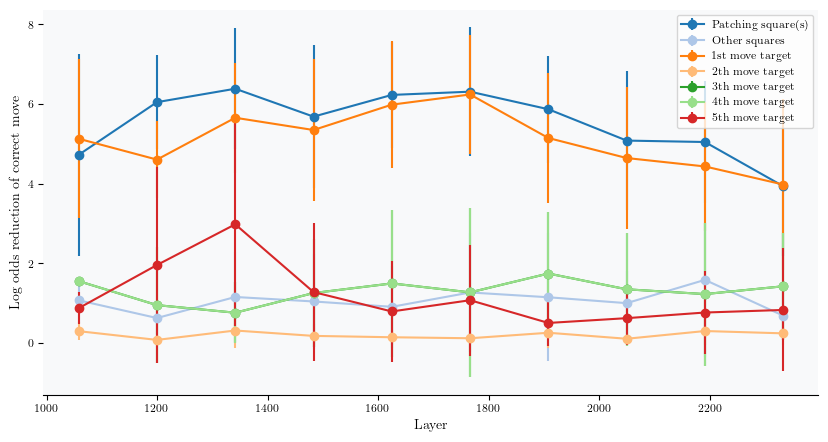

Skipped 89 out of 237 puzzles (37.55%)
Intersection skips: 89 out of 237 puzzles (37.55%)
Patching: 148, Other: 148
End square:: 1st: 148, 2nd: 148, 3rd: 148, 4th: 148, 5th: 148, 6th: 0, 7th: 0, 


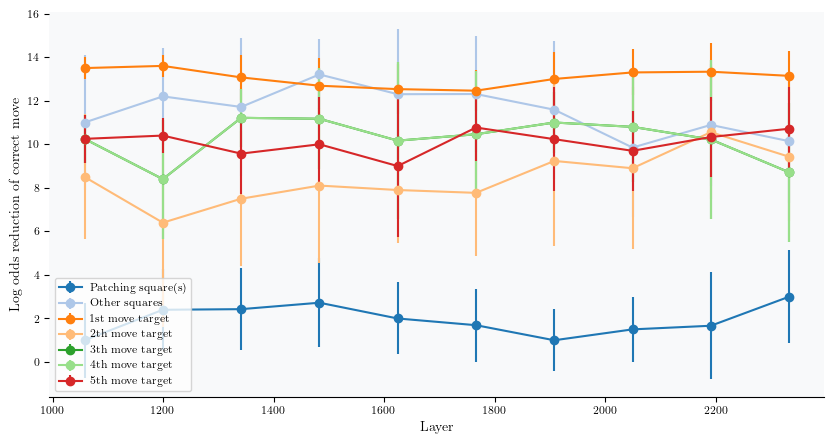

11112
Skipped 22 out of 227 puzzles (9.69%)
Intersection skips: 22 out of 227 puzzles (9.69%)
Patching: 205, Other: 205
End square:: 1st: 205, 2nd: 205, 3rd: 205, 4th: 205, 5th: 205, 6th: 0, 7th: 0, 


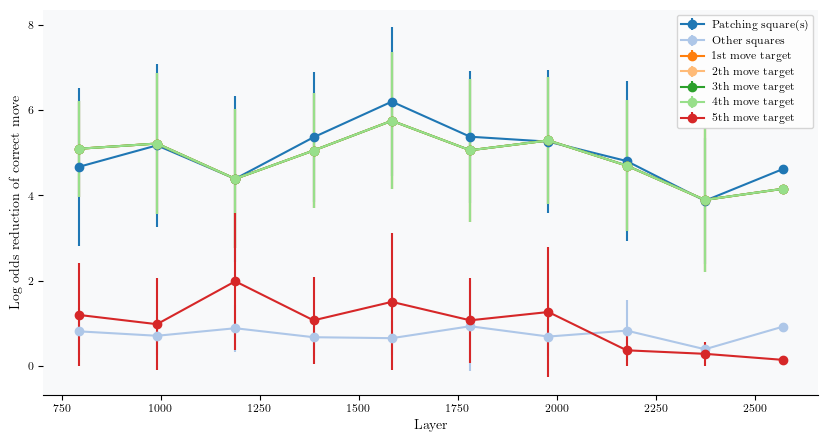

Skipped 22 out of 227 puzzles (9.69%)
Intersection skips: 22 out of 227 puzzles (9.69%)
Patching: 205, Other: 205
End square:: 1st: 205, 2nd: 205, 3rd: 205, 4th: 205, 5th: 205, 6th: 0, 7th: 0, 


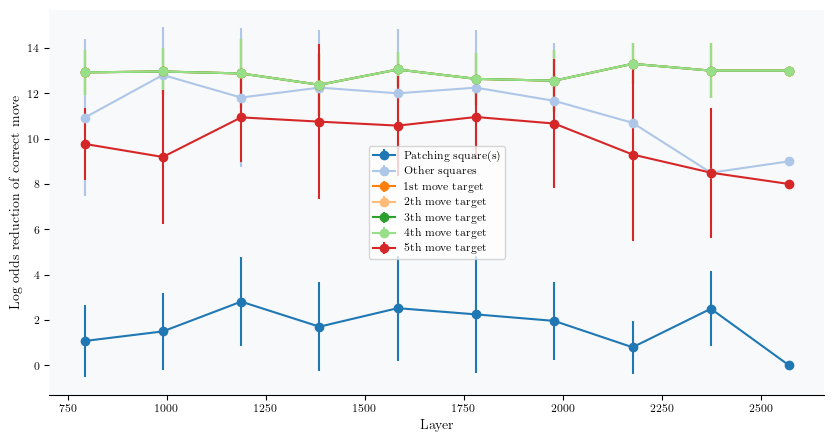

11123
Skipped 64 out of 222 puzzles (28.83%)
Intersection skips: 64 out of 222 puzzles (28.83%)
Patching: 158, Other: 158
End square:: 1st: 158, 2nd: 158, 3rd: 158, 4th: 158, 5th: 158, 6th: 0, 7th: 0, 


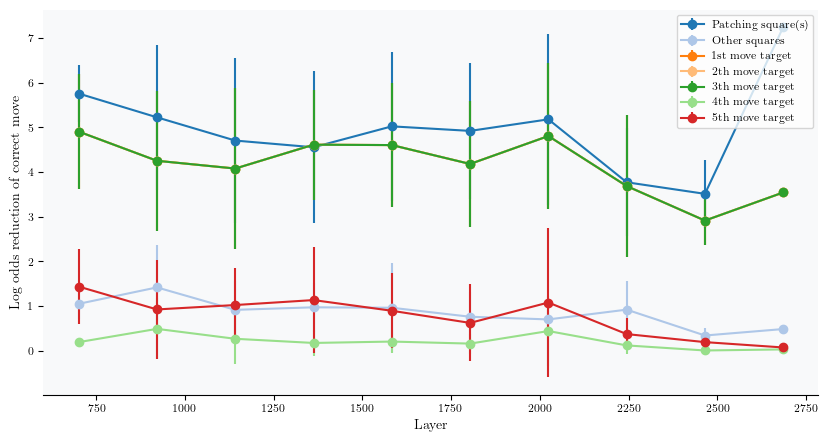

Skipped 64 out of 222 puzzles (28.83%)
Intersection skips: 64 out of 222 puzzles (28.83%)
Patching: 158, Other: 158
End square:: 1st: 158, 2nd: 158, 3rd: 158, 4th: 158, 5th: 158, 6th: 0, 7th: 0, 


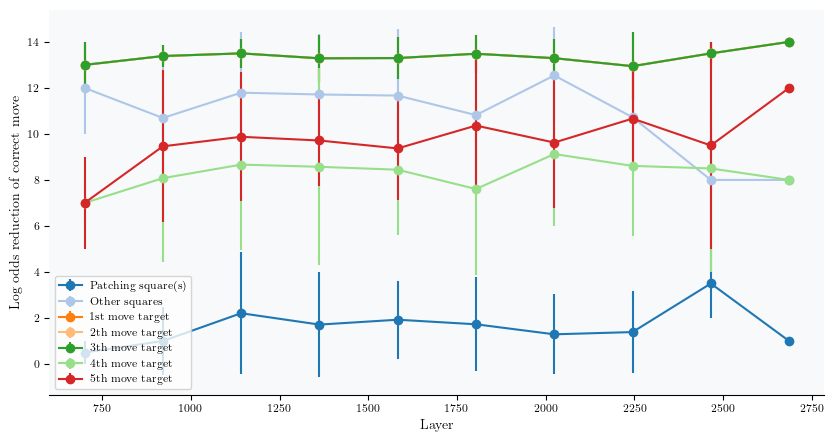

12333
Skipped 23 out of 218 puzzles (10.55%)
Intersection skips: 23 out of 218 puzzles (10.55%)
Patching: 195, Other: 195
End square:: 1st: 195, 2nd: 195, 3rd: 195, 4th: 195, 5th: 195, 6th: 0, 7th: 0, 


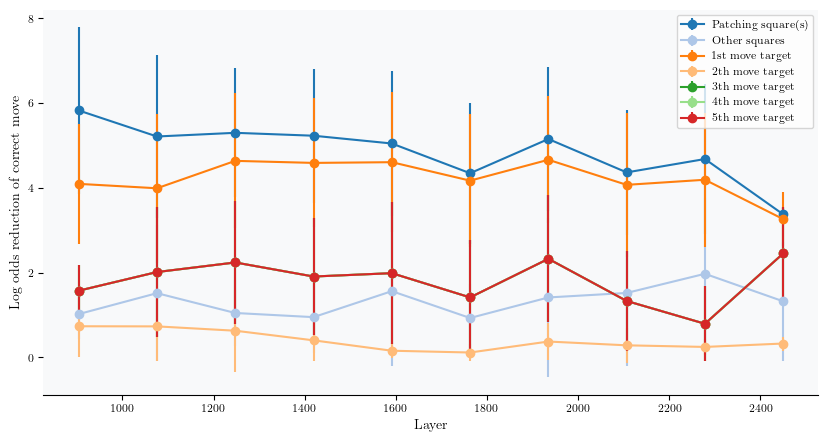

Skipped 23 out of 218 puzzles (10.55%)
Intersection skips: 23 out of 218 puzzles (10.55%)
Patching: 195, Other: 195
End square:: 1st: 195, 2nd: 195, 3rd: 195, 4th: 195, 5th: 195, 6th: 0, 7th: 0, 


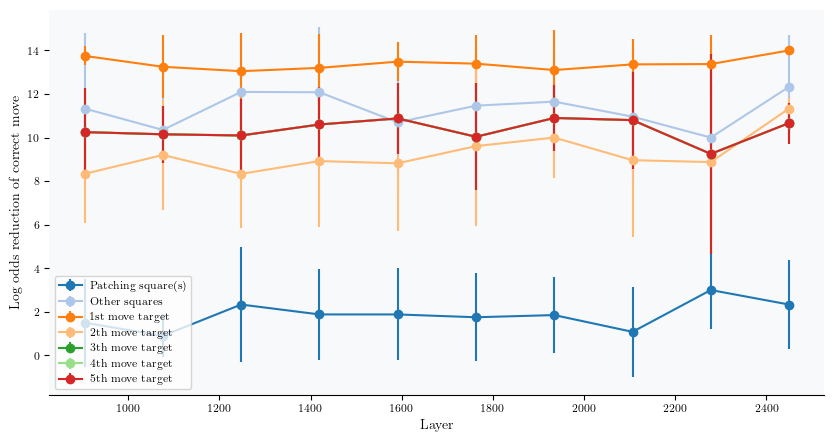

11122
Skipped 28 out of 204 puzzles (13.73%)
Intersection skips: 28 out of 204 puzzles (13.73%)
Patching: 176, Other: 176
End square:: 1st: 176, 2nd: 176, 3rd: 176, 4th: 176, 5th: 176, 6th: 0, 7th: 0, 


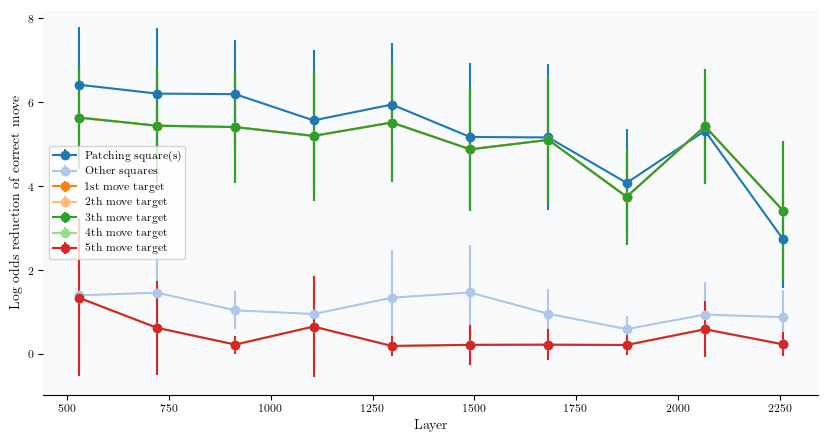

Skipped 28 out of 204 puzzles (13.73%)
Intersection skips: 28 out of 204 puzzles (13.73%)
Patching: 176, Other: 176
End square:: 1st: 176, 2nd: 176, 3rd: 176, 4th: 176, 5th: 176, 6th: 0, 7th: 0, 


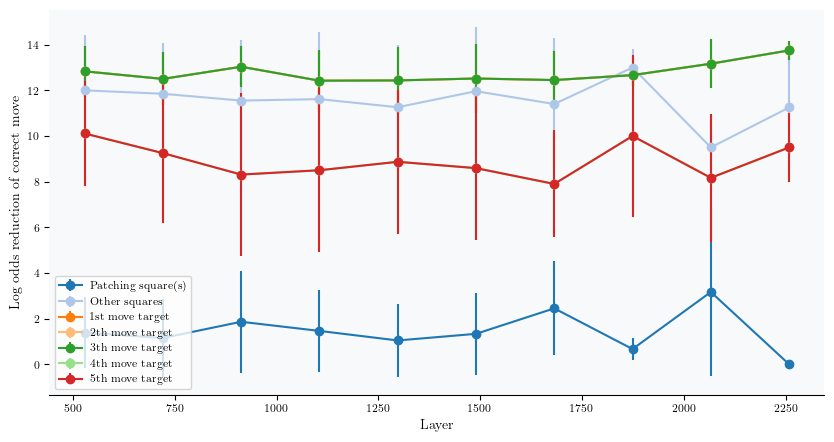

122
Skipped 11 out of 202 puzzles (5.45%)
Intersection skips: 11 out of 202 puzzles (5.45%)
Patching: 191, Other: 191
End square:: 1st: 191, 2nd: 191, 3rd: 191, 4th: 0, 5th: 0, 6th: 0, 7th: 0, 


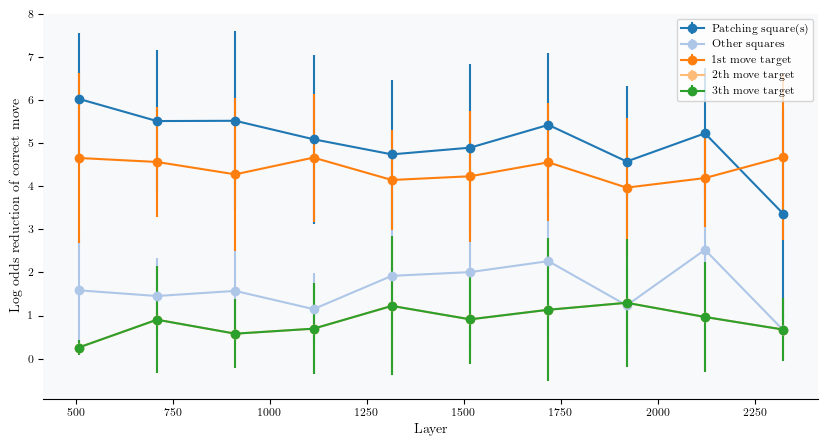

Skipped 11 out of 202 puzzles (5.45%)
Intersection skips: 11 out of 202 puzzles (5.45%)
Patching: 191, Other: 191
End square:: 1st: 191, 2nd: 191, 3rd: 191, 4th: 0, 5th: 0, 6th: 0, 7th: 0, 


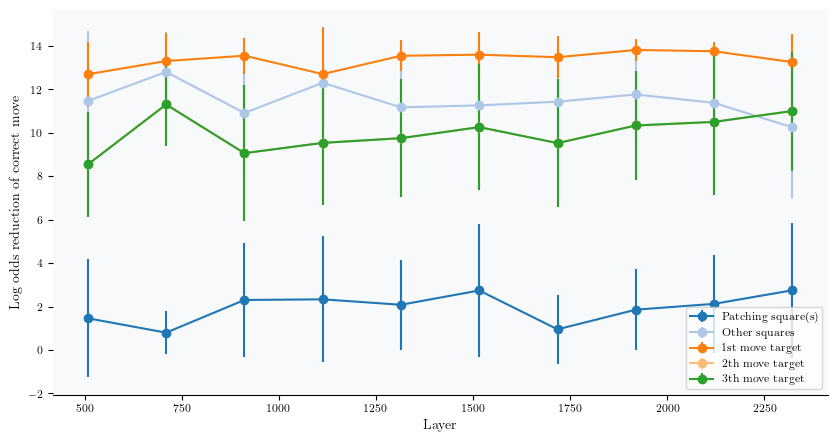

11223
Skipped 31 out of 185 puzzles (16.76%)
Intersection skips: 31 out of 185 puzzles (16.76%)
Patching: 154, Other: 154
End square:: 1st: 154, 2nd: 154, 3rd: 154, 4th: 154, 5th: 154, 6th: 0, 7th: 0, 


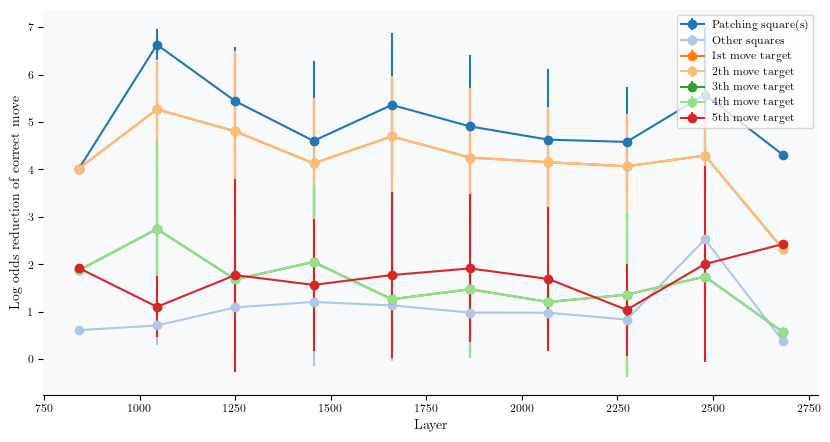

Skipped 31 out of 185 puzzles (16.76%)
Intersection skips: 31 out of 185 puzzles (16.76%)
Patching: 154, Other: 154
End square:: 1st: 154, 2nd: 154, 3rd: 154, 4th: 154, 5th: 154, 6th: 0, 7th: 0, 


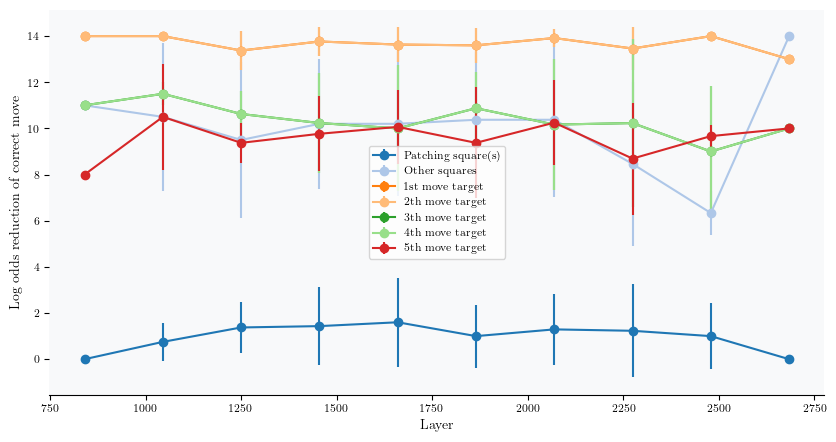

12344
Skipped 34 out of 160 puzzles (21.25%)
Intersection skips: 34 out of 160 puzzles (21.25%)
Patching: 126, Other: 126
End square:: 1st: 126, 2nd: 126, 3rd: 126, 4th: 126, 5th: 126, 6th: 0, 7th: 0, 


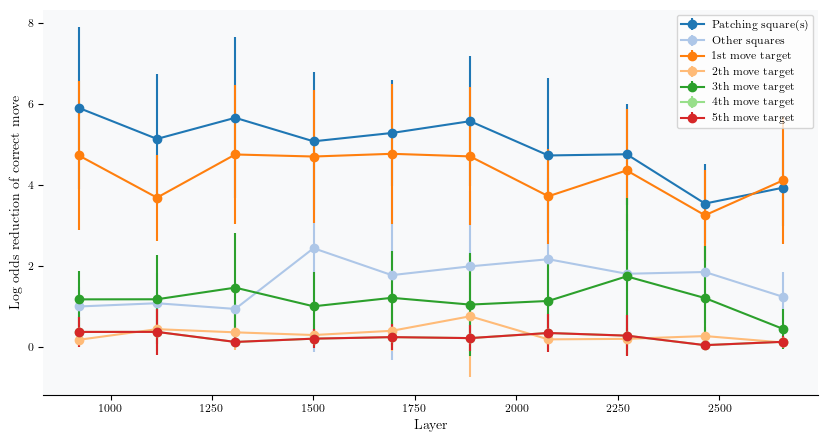

Skipped 34 out of 160 puzzles (21.25%)
Intersection skips: 34 out of 160 puzzles (21.25%)
Patching: 126, Other: 126
End square:: 1st: 126, 2nd: 126, 3rd: 126, 4th: 126, 5th: 126, 6th: 0, 7th: 0, 


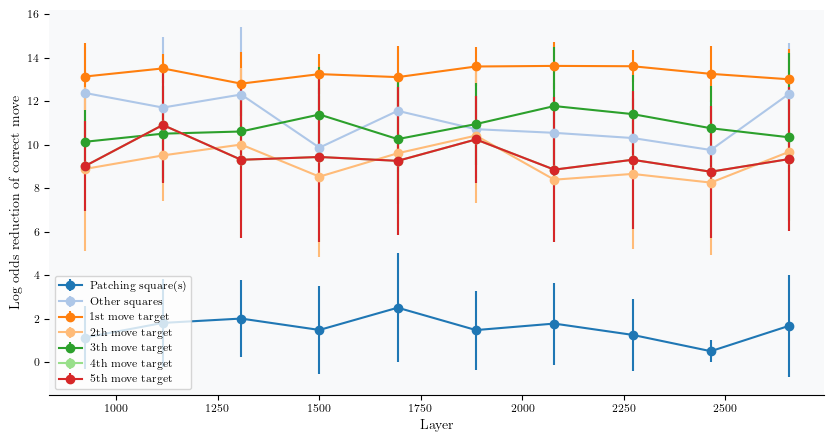

1123456
Skipped 51 out of 130 puzzles (39.23%)
Intersection skips: 51 out of 130 puzzles (39.23%)
Patching: 79, Other: 79
End square:: 1st: 79, 2nd: 79, 3rd: 79, 4th: 79, 5th: 79, 6th: 79, 7th: 79, 


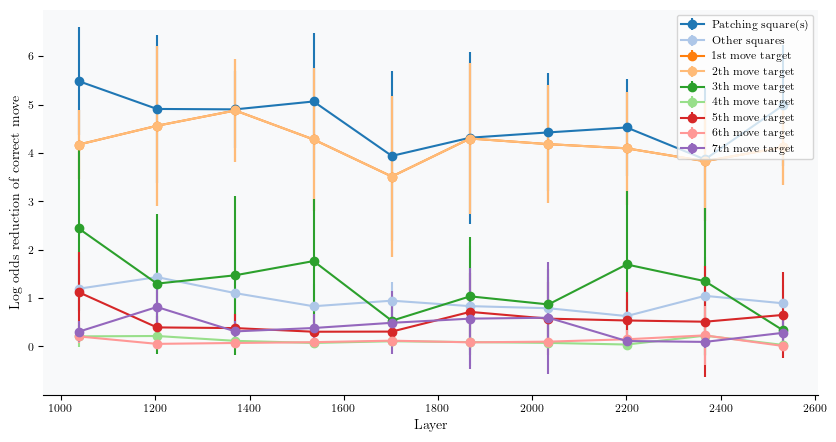

Skipped 51 out of 130 puzzles (39.23%)
Intersection skips: 51 out of 130 puzzles (39.23%)
Patching: 79, Other: 79
End square:: 1st: 79, 2nd: 79, 3rd: 79, 4th: 79, 5th: 79, 6th: 79, 7th: 79, 


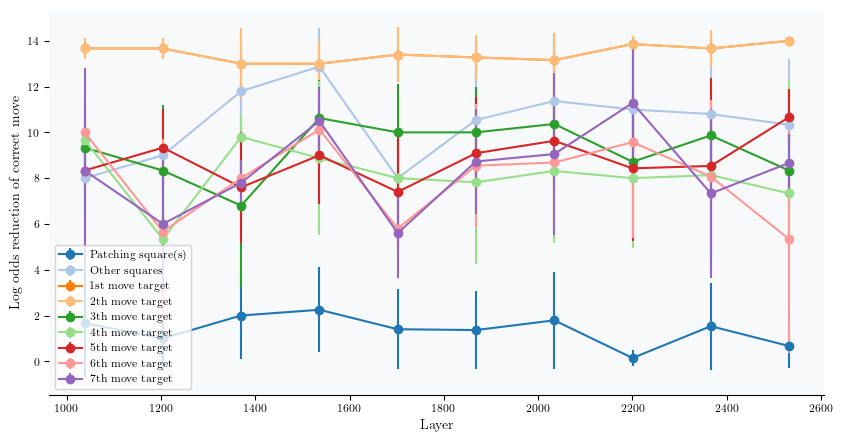

11221
Skipped 17 out of 98 puzzles (17.35%)
Intersection skips: 17 out of 98 puzzles (17.35%)
Patching: 81, Other: 81
End square:: 1st: 81, 2nd: 81, 3rd: 81, 4th: 81, 5th: 81, 6th: 0, 7th: 0, 


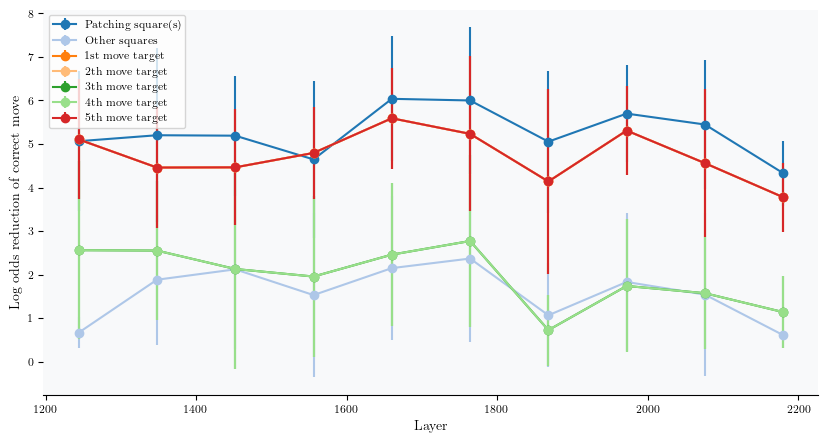

Skipped 17 out of 98 puzzles (17.35%)
Intersection skips: 17 out of 98 puzzles (17.35%)
Patching: 81, Other: 81
End square:: 1st: 81, 2nd: 81, 3rd: 81, 4th: 81, 5th: 81, 6th: 0, 7th: 0, 


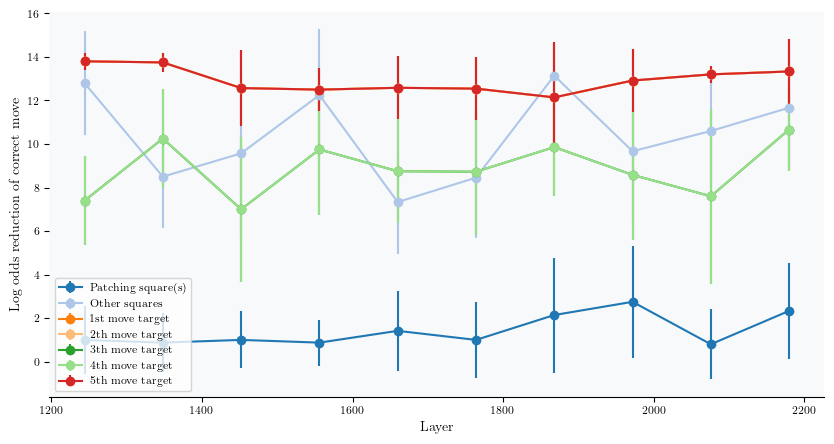

12342
Skipped 10 out of 65 puzzles (15.38%)
Intersection skips: 10 out of 65 puzzles (15.38%)
Patching: 55, Other: 55
End square:: 1st: 55, 2nd: 55, 3rd: 55, 4th: 55, 5th: 55, 6th: 0, 7th: 0, 


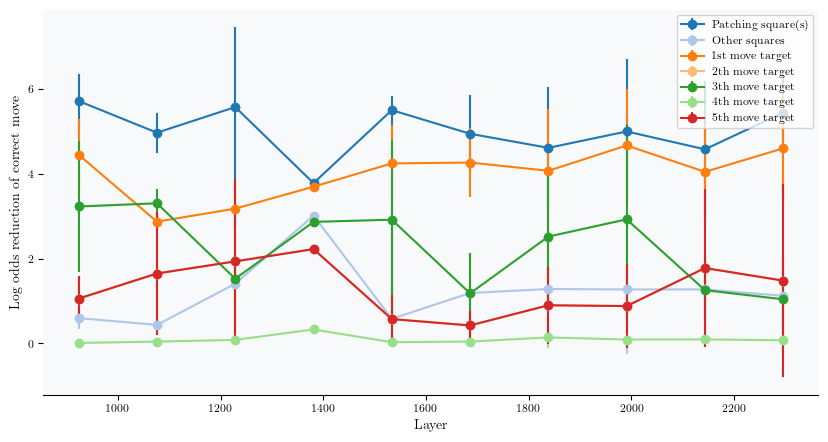

Skipped 10 out of 65 puzzles (15.38%)
Intersection skips: 10 out of 65 puzzles (15.38%)
Patching: 55, Other: 55
End square:: 1st: 55, 2nd: 55, 3rd: 55, 4th: 55, 5th: 55, 6th: 0, 7th: 0, 


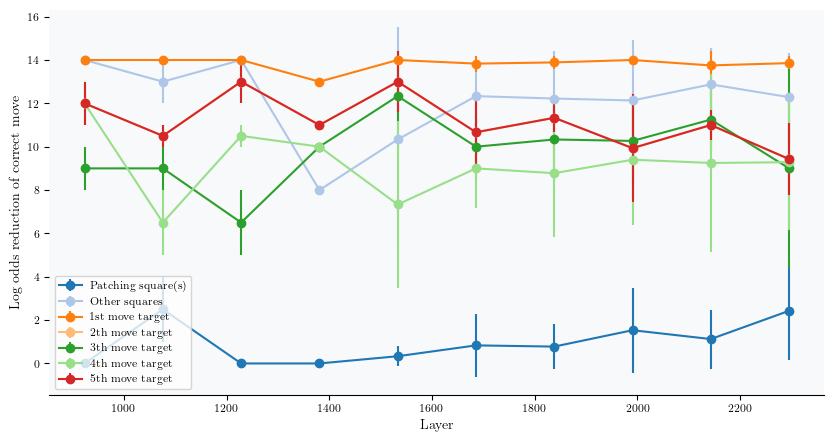

11111
Skipped 0 out of 61 puzzles (0.00%)
Intersection skips: 0 out of 61 puzzles (0.00%)
Patching: 61, Other: 61
End square:: 1st: 61, 2nd: 61, 3rd: 61, 4th: 61, 5th: 61, 6th: 0, 7th: 0, 


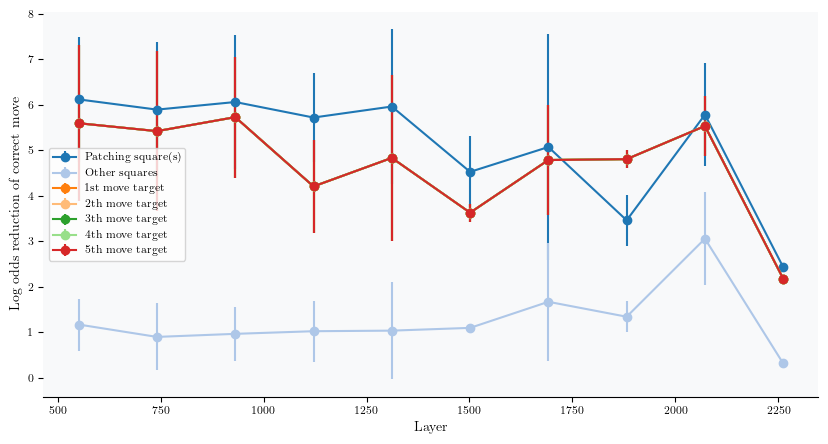

Skipped 0 out of 61 puzzles (0.00%)
Intersection skips: 0 out of 61 puzzles (0.00%)
Patching: 61, Other: 61
End square:: 1st: 61, 2nd: 61, 3rd: 61, 4th: 61, 5th: 61, 6th: 0, 7th: 0, 


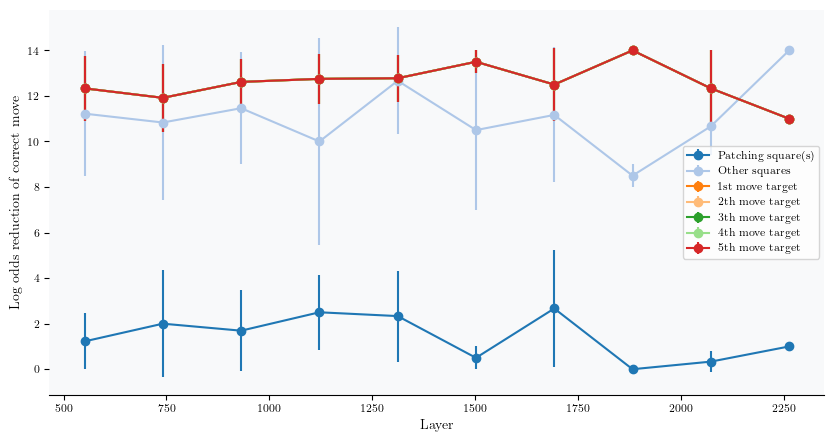

1123344
Skipped 3 out of 57 puzzles (5.26%)
Intersection skips: 3 out of 57 puzzles (5.26%)
Patching: 54, Other: 54
End square:: 1st: 54, 2nd: 54, 3rd: 54, 4th: 54, 5th: 54, 6th: 54, 7th: 54, 


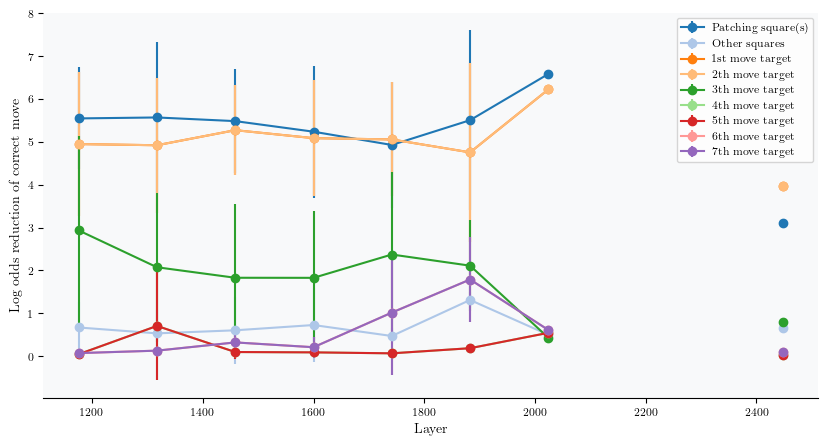

Skipped 3 out of 57 puzzles (5.26%)
Intersection skips: 3 out of 57 puzzles (5.26%)
Patching: 54, Other: 54
End square:: 1st: 54, 2nd: 54, 3rd: 54, 4th: 54, 5th: 54, 6th: 54, 7th: 54, 


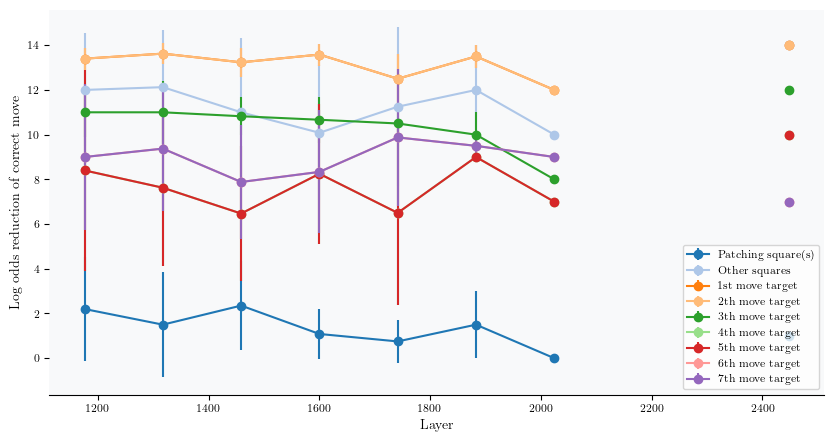

12223
Skipped 13 out of 56 puzzles (23.21%)
Intersection skips: 13 out of 56 puzzles (23.21%)
Patching: 43, Other: 43
End square:: 1st: 43, 2nd: 43, 3rd: 43, 4th: 43, 5th: 43, 6th: 0, 7th: 0, 


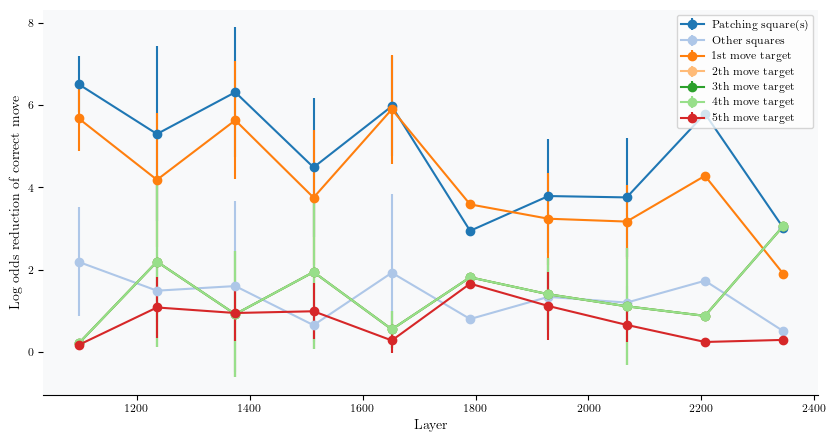

Skipped 13 out of 56 puzzles (23.21%)
Intersection skips: 13 out of 56 puzzles (23.21%)
Patching: 43, Other: 43
End square:: 1st: 43, 2nd: 43, 3rd: 43, 4th: 43, 5th: 43, 6th: 0, 7th: 0, 


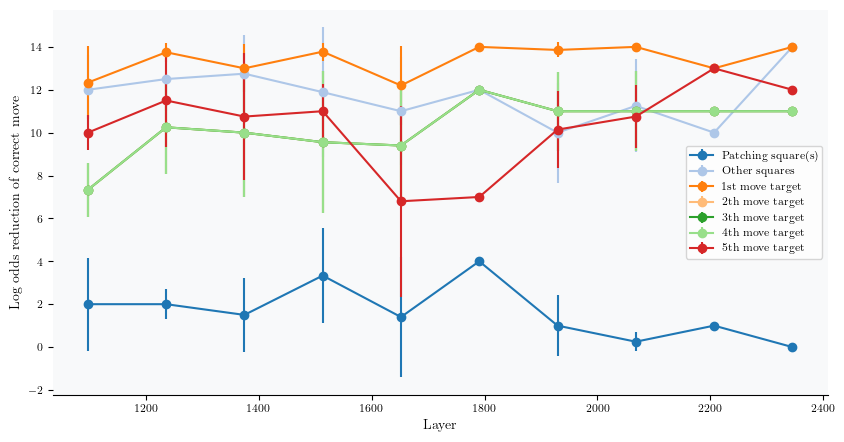

1123455
Skipped 15 out of 49 puzzles (30.61%)
Intersection skips: 15 out of 49 puzzles (30.61%)
Patching: 34, Other: 34
End square:: 1st: 34, 2nd: 34, 3rd: 34, 4th: 34, 5th: 34, 6th: 34, 7th: 34, 


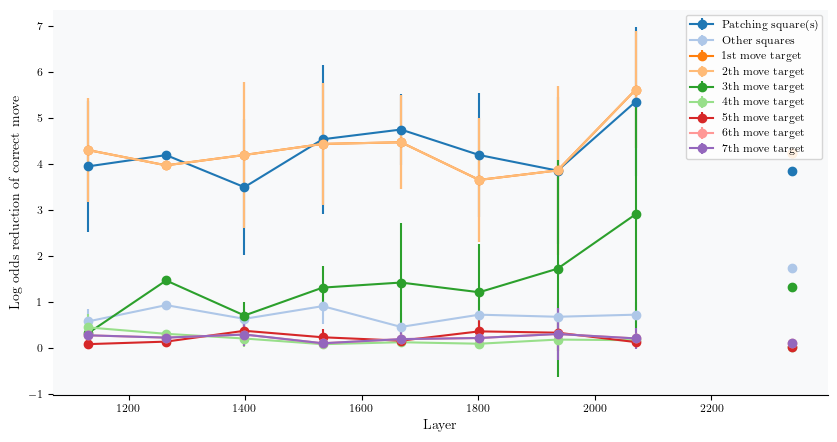

Skipped 15 out of 49 puzzles (30.61%)
Intersection skips: 15 out of 49 puzzles (30.61%)
Patching: 34, Other: 34
End square:: 1st: 34, 2nd: 34, 3rd: 34, 4th: 34, 5th: 34, 6th: 34, 7th: 34, 


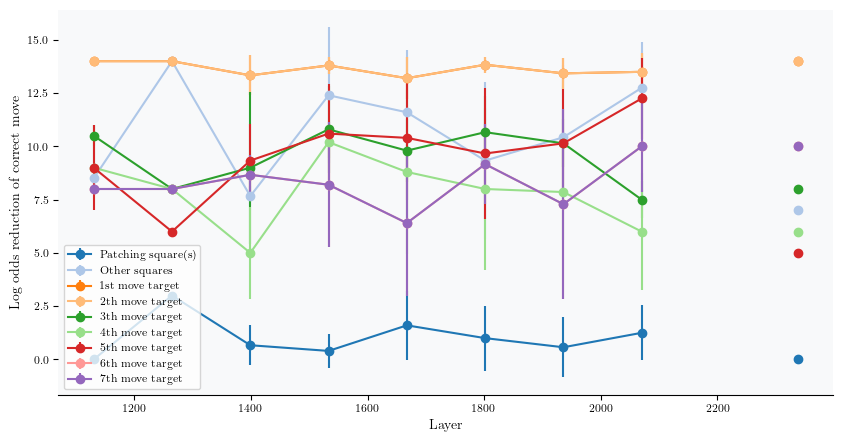

12332
Skipped 13 out of 45 puzzles (28.89%)
Intersection skips: 13 out of 45 puzzles (28.89%)
Patching: 32, Other: 32
End square:: 1st: 32, 2nd: 32, 3rd: 32, 4th: 32, 5th: 32, 6th: 0, 7th: 0, 


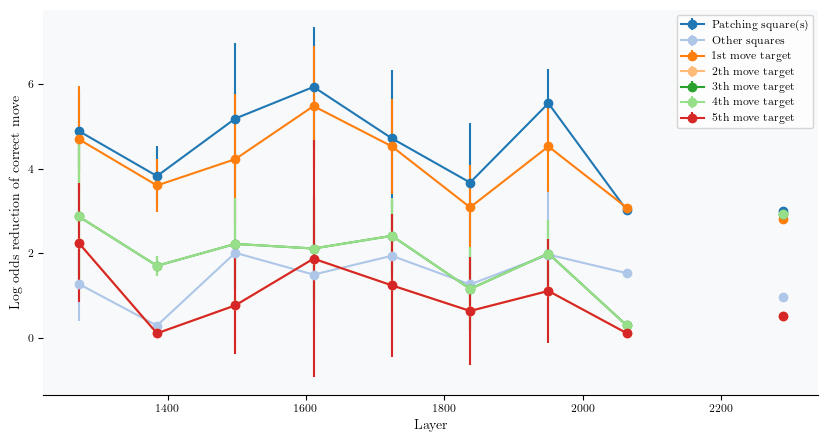

Skipped 13 out of 45 puzzles (28.89%)
Intersection skips: 13 out of 45 puzzles (28.89%)
Patching: 32, Other: 32
End square:: 1st: 32, 2nd: 32, 3rd: 32, 4th: 32, 5th: 32, 6th: 0, 7th: 0, 


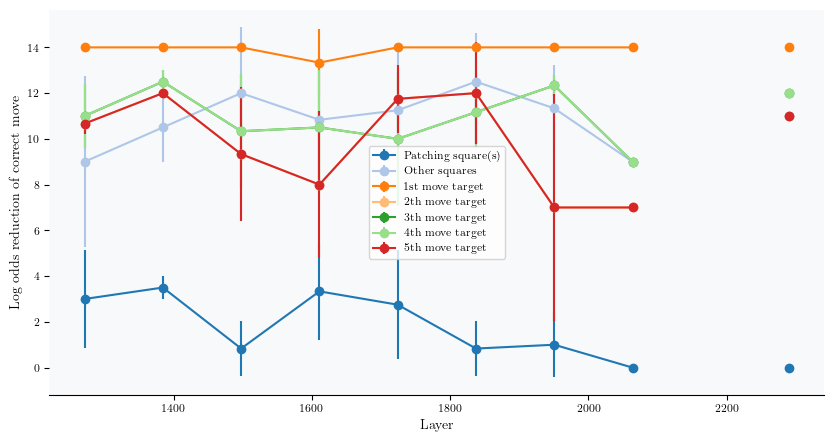

1111234
Skipped 14 out of 35 puzzles (40.00%)
Intersection skips: 14 out of 35 puzzles (40.00%)
Patching: 21, Other: 21
End square:: 1st: 21, 2nd: 21, 3rd: 21, 4th: 21, 5th: 21, 6th: 21, 7th: 21, 


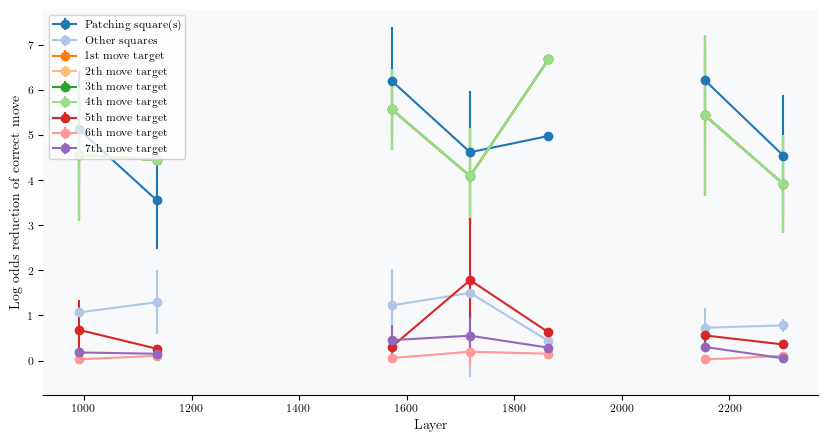

Skipped 14 out of 35 puzzles (40.00%)
Intersection skips: 14 out of 35 puzzles (40.00%)
Patching: 21, Other: 21
End square:: 1st: 21, 2nd: 21, 3rd: 21, 4th: 21, 5th: 21, 6th: 21, 7th: 21, 


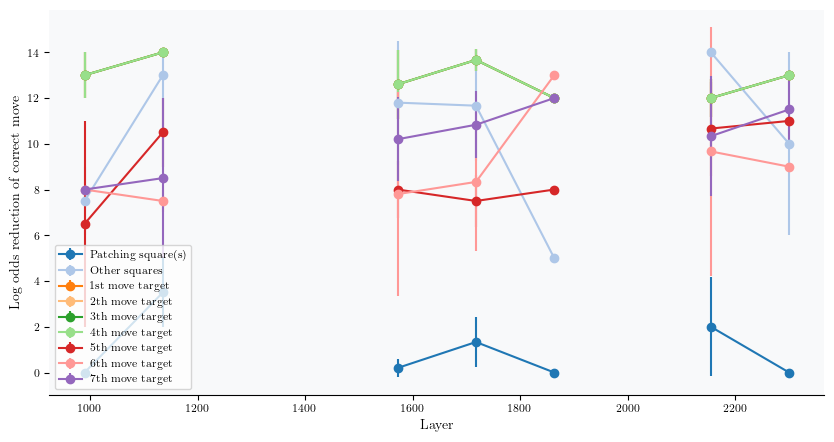

1123444
Skipped 5 out of 32 puzzles (15.62%)
Intersection skips: 5 out of 32 puzzles (15.62%)
Patching: 27, Other: 27
End square:: 1st: 27, 2nd: 27, 3rd: 27, 4th: 27, 5th: 27, 6th: 27, 7th: 27, 


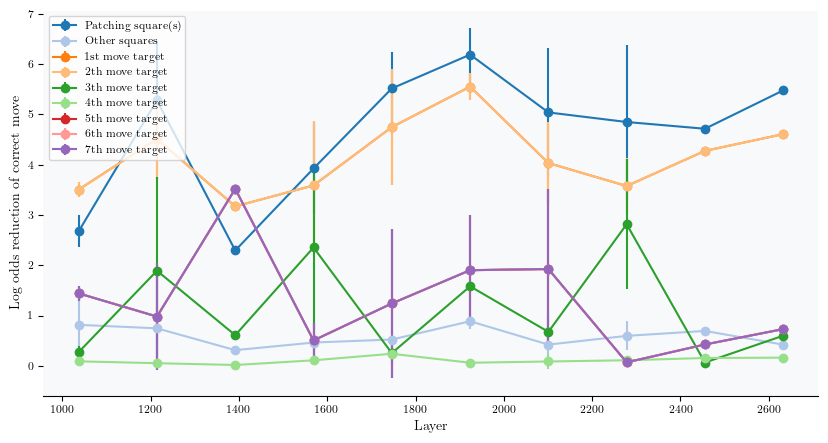

Skipped 5 out of 32 puzzles (15.62%)
Intersection skips: 5 out of 32 puzzles (15.62%)
Patching: 27, Other: 27
End square:: 1st: 27, 2nd: 27, 3rd: 27, 4th: 27, 5th: 27, 6th: 27, 7th: 27, 


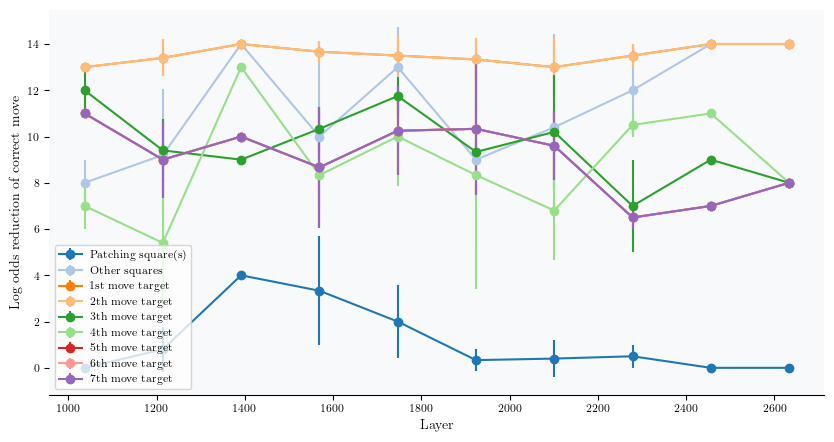

1112345
Skipped 7 out of 28 puzzles (25.00%)
Intersection skips: 7 out of 28 puzzles (25.00%)
Patching: 21, Other: 21
End square:: 1st: 21, 2nd: 21, 3rd: 21, 4th: 21, 5th: 21, 6th: 21, 7th: 21, 


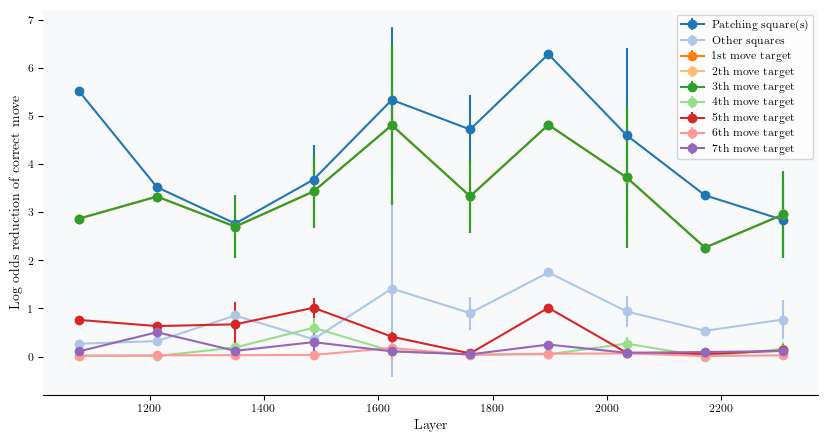

Skipped 7 out of 28 puzzles (25.00%)
Intersection skips: 7 out of 28 puzzles (25.00%)
Patching: 21, Other: 21
End square:: 1st: 21, 2nd: 21, 3rd: 21, 4th: 21, 5th: 21, 6th: 21, 7th: 21, 


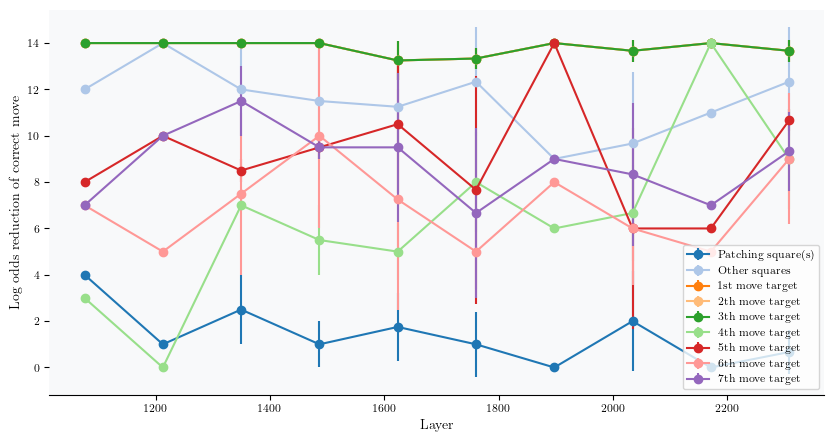

1123451
Skipped 8 out of 23 puzzles (34.78%)
Intersection skips: 8 out of 23 puzzles (34.78%)
Patching: 15, Other: 15
End square:: 1st: 15, 2nd: 15, 3rd: 15, 4th: 15, 5th: 15, 6th: 15, 7th: 15, 


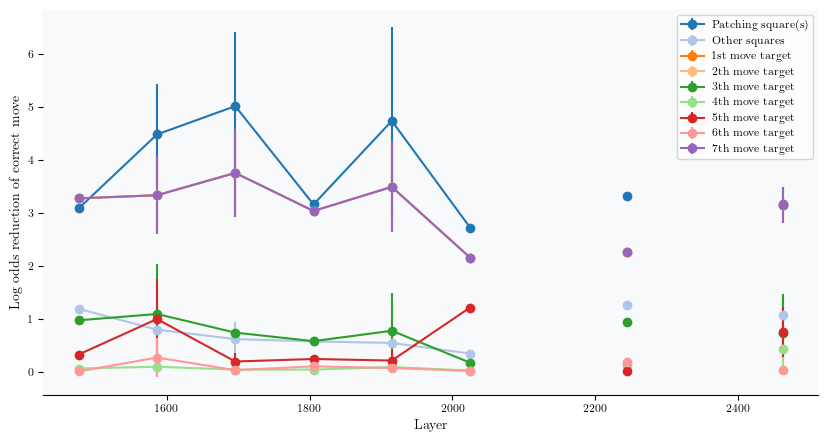

Skipped 8 out of 23 puzzles (34.78%)
Intersection skips: 8 out of 23 puzzles (34.78%)
Patching: 15, Other: 15
End square:: 1st: 15, 2nd: 15, 3rd: 15, 4th: 15, 5th: 15, 6th: 15, 7th: 15, 


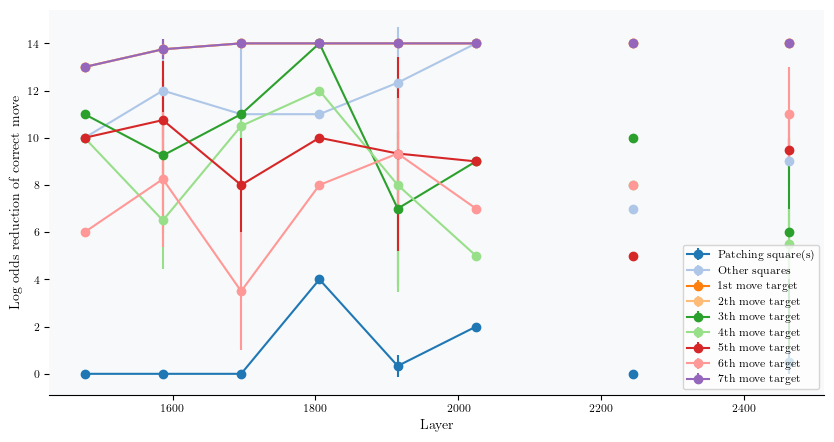

12234
Skipped 5 out of 21 puzzles (23.81%)
Intersection skips: 5 out of 21 puzzles (23.81%)
Patching: 16, Other: 16
End square:: 1st: 16, 2nd: 16, 3rd: 16, 4th: 16, 5th: 16, 6th: 0, 7th: 0, 


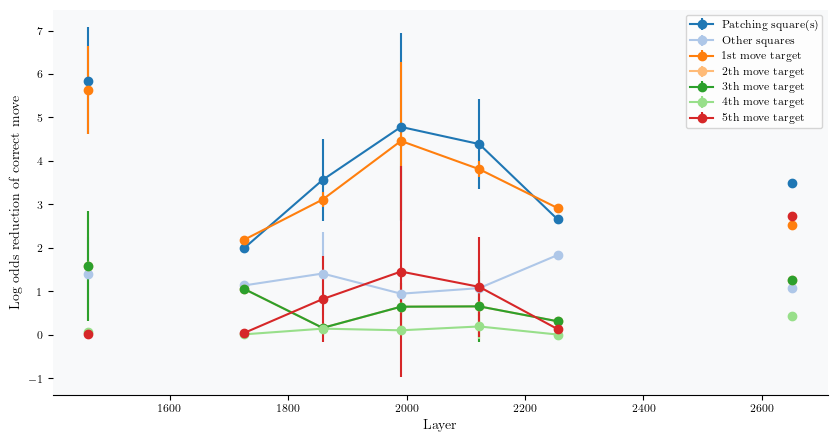

Skipped 5 out of 21 puzzles (23.81%)
Intersection skips: 5 out of 21 puzzles (23.81%)
Patching: 16, Other: 16
End square:: 1st: 16, 2nd: 16, 3rd: 16, 4th: 16, 5th: 16, 6th: 0, 7th: 0, 


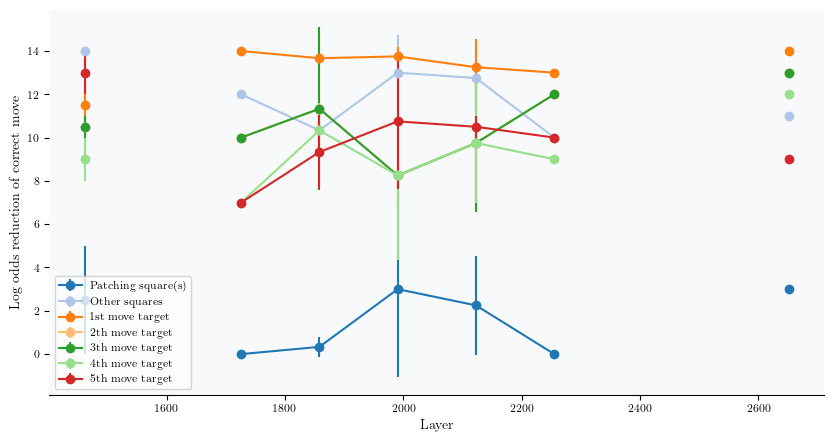

12311
Skipped 2 out of 21 puzzles (9.52%)
Intersection skips: 2 out of 21 puzzles (9.52%)
Patching: 19, Other: 19
End square:: 1st: 19, 2nd: 19, 3rd: 19, 4th: 19, 5th: 19, 6th: 0, 7th: 0, 


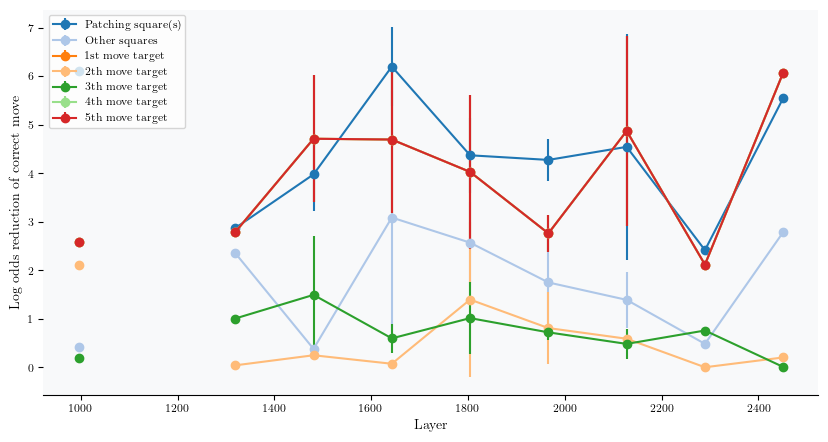

Skipped 2 out of 21 puzzles (9.52%)
Intersection skips: 2 out of 21 puzzles (9.52%)
Patching: 19, Other: 19
End square:: 1st: 19, 2nd: 19, 3rd: 19, 4th: 19, 5th: 19, 6th: 0, 7th: 0, 


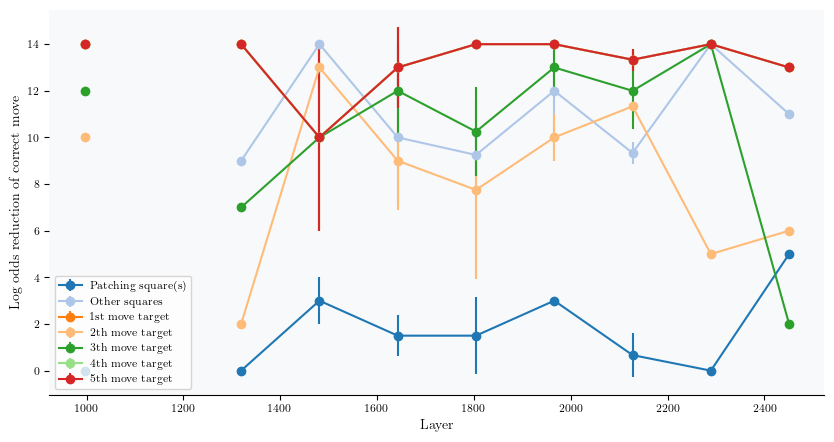

1234567
Skipped 7 out of 21 puzzles (33.33%)
Intersection skips: 7 out of 21 puzzles (33.33%)
Patching: 14, Other: 14
End square:: 1st: 14, 2nd: 14, 3rd: 14, 4th: 14, 5th: 14, 6th: 14, 7th: 14, 


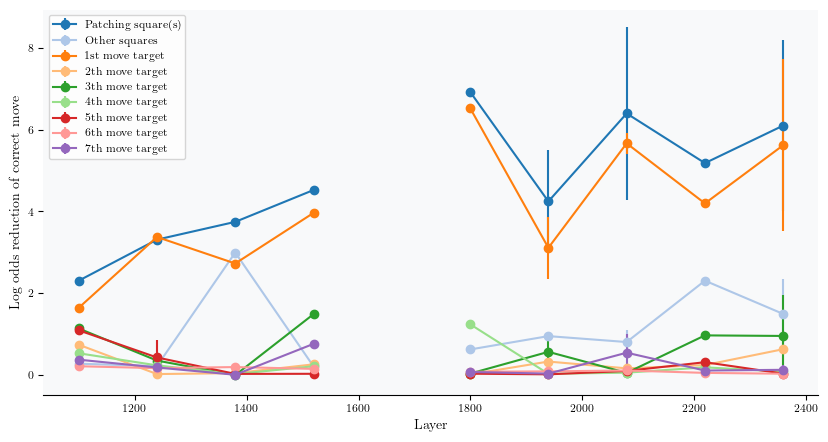

Skipped 7 out of 21 puzzles (33.33%)
Intersection skips: 7 out of 21 puzzles (33.33%)
Patching: 14, Other: 14
End square:: 1st: 14, 2nd: 14, 3rd: 14, 4th: 14, 5th: 14, 6th: 14, 7th: 14, 


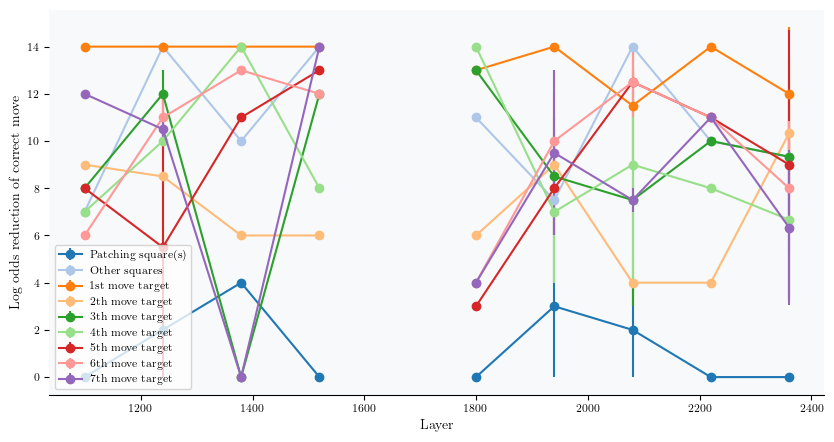

12314
Skipped 9 out of 18 puzzles (50.00%)
Intersection skips: 9 out of 18 puzzles (50.00%)
Patching: 9, Other: 9
End square:: 1st: 9, 2nd: 9, 3rd: 9, 4th: 9, 5th: 9, 6th: 0, 7th: 0, 


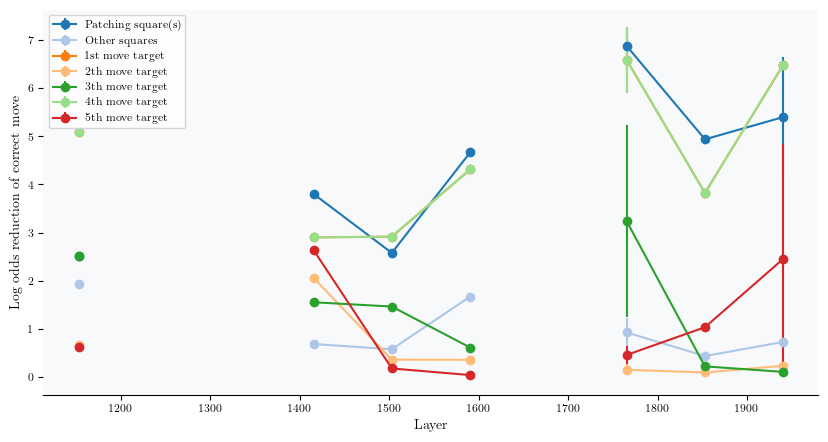

Skipped 9 out of 18 puzzles (50.00%)
Intersection skips: 9 out of 18 puzzles (50.00%)
Patching: 9, Other: 9
End square:: 1st: 9, 2nd: 9, 3rd: 9, 4th: 9, 5th: 9, 6th: 0, 7th: 0, 


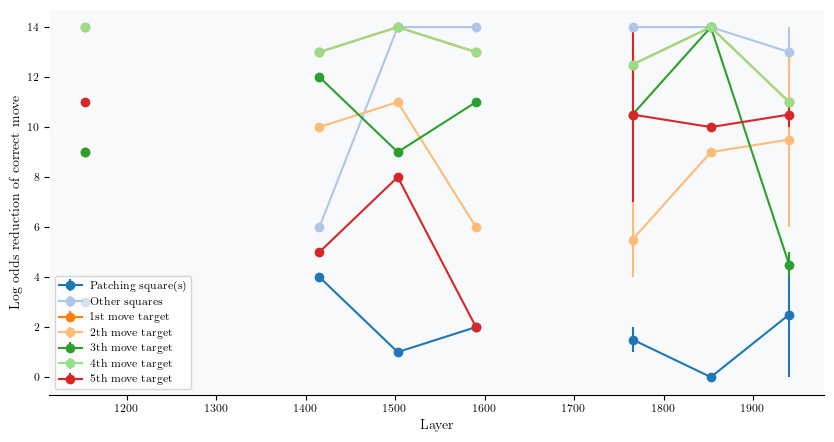

1123345
Skipped 3 out of 17 puzzles (17.65%)
Intersection skips: 3 out of 17 puzzles (17.65%)
Patching: 14, Other: 14
End square:: 1st: 14, 2nd: 14, 3rd: 14, 4th: 14, 5th: 14, 6th: 14, 7th: 14, 


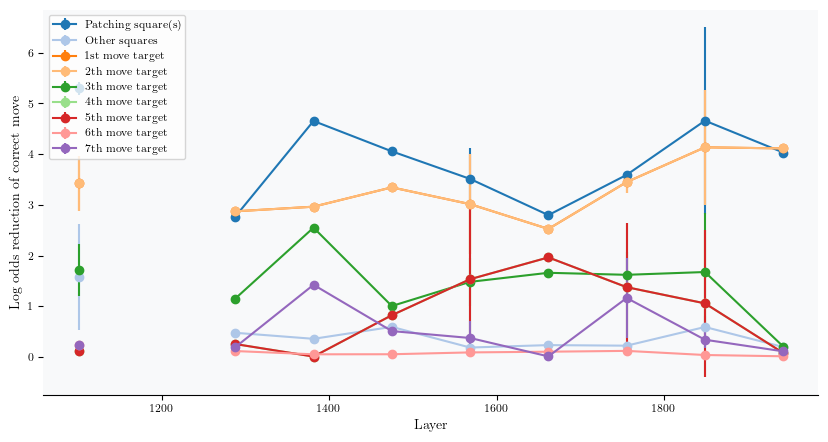

Skipped 3 out of 17 puzzles (17.65%)
Intersection skips: 3 out of 17 puzzles (17.65%)
Patching: 14, Other: 14
End square:: 1st: 14, 2nd: 14, 3rd: 14, 4th: 14, 5th: 14, 6th: 14, 7th: 14, 


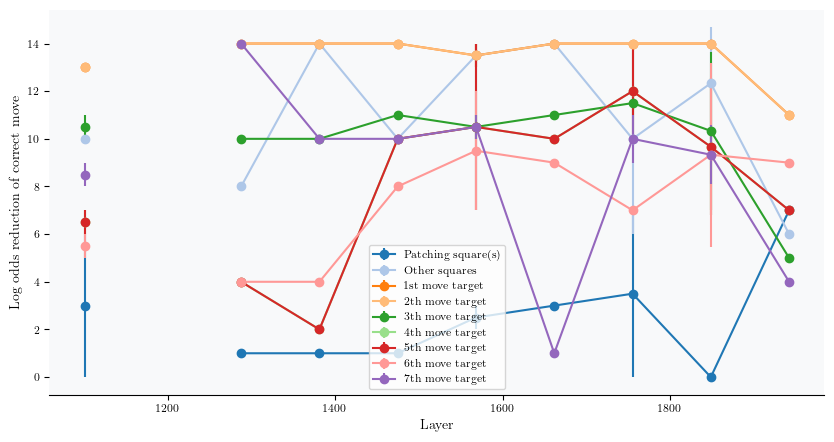

12233
Skipped 1 out of 15 puzzles (6.67%)
Intersection skips: 1 out of 15 puzzles (6.67%)
Patching: 14, Other: 14
End square:: 1st: 14, 2nd: 14, 3rd: 14, 4th: 14, 5th: 14, 6th: 0, 7th: 0, 


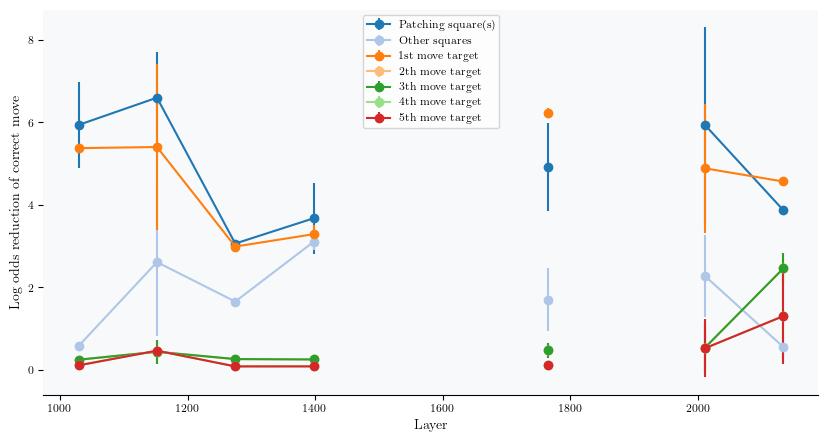

Skipped 1 out of 15 puzzles (6.67%)
Intersection skips: 1 out of 15 puzzles (6.67%)
Patching: 14, Other: 14
End square:: 1st: 14, 2nd: 14, 3rd: 14, 4th: 14, 5th: 14, 6th: 0, 7th: 0, 


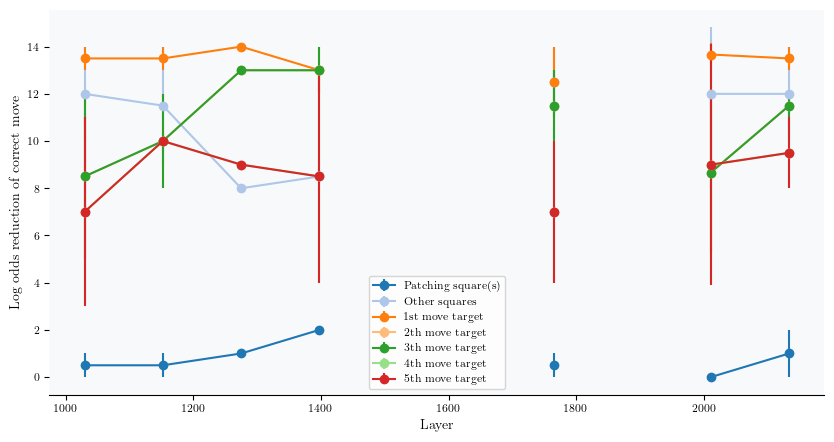

112345678
Skipped 14 out of 14 puzzles (100.00%)
Intersection skips: 0 out of 14 puzzles (0.00%)
1123445
Skipped 8 out of 14 puzzles (57.14%)
Intersection skips: 8 out of 14 puzzles (57.14%)
Patching: 6, Other: 6
End square:: 1st: 6, 2nd: 6, 3rd: 6, 4th: 6, 5th: 6, 6th: 6, 7th: 6, 


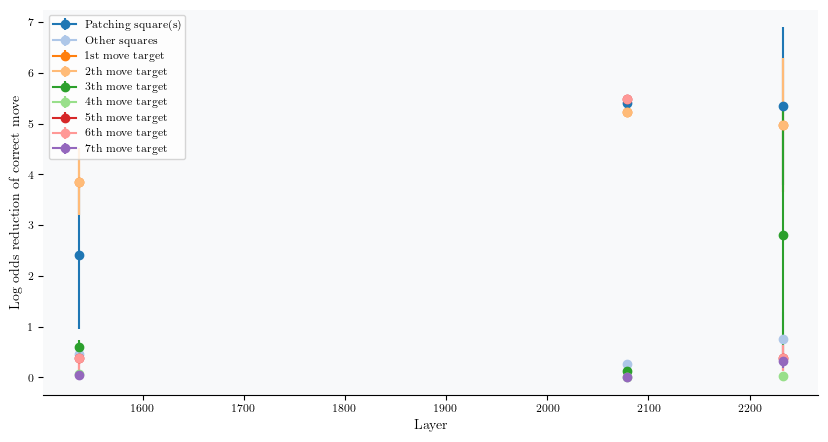

Skipped 8 out of 14 puzzles (57.14%)
Intersection skips: 8 out of 14 puzzles (57.14%)
Patching: 6, Other: 6
End square:: 1st: 6, 2nd: 6, 3rd: 6, 4th: 6, 5th: 6, 6th: 6, 7th: 6, 


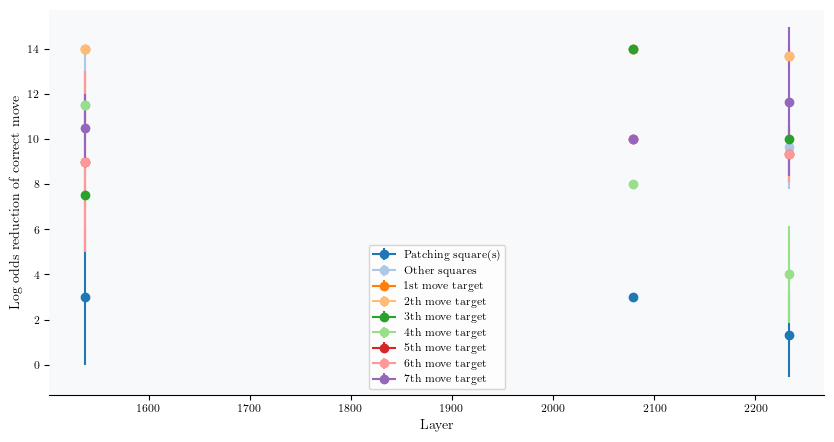

12222
Skipped 2 out of 14 puzzles (14.29%)
Intersection skips: 2 out of 14 puzzles (14.29%)
Patching: 12, Other: 12
End square:: 1st: 12, 2nd: 12, 3rd: 12, 4th: 12, 5th: 12, 6th: 0, 7th: 0, 


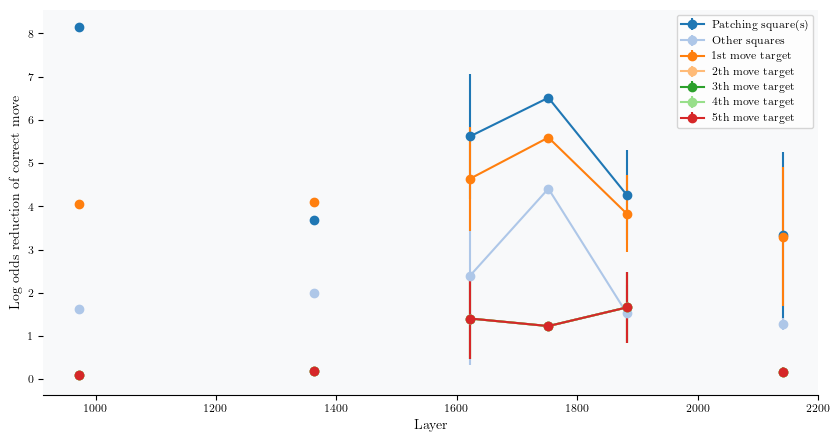

Skipped 2 out of 14 puzzles (14.29%)
Intersection skips: 2 out of 14 puzzles (14.29%)
Patching: 12, Other: 12
End square:: 1st: 12, 2nd: 12, 3rd: 12, 4th: 12, 5th: 12, 6th: 0, 7th: 0, 


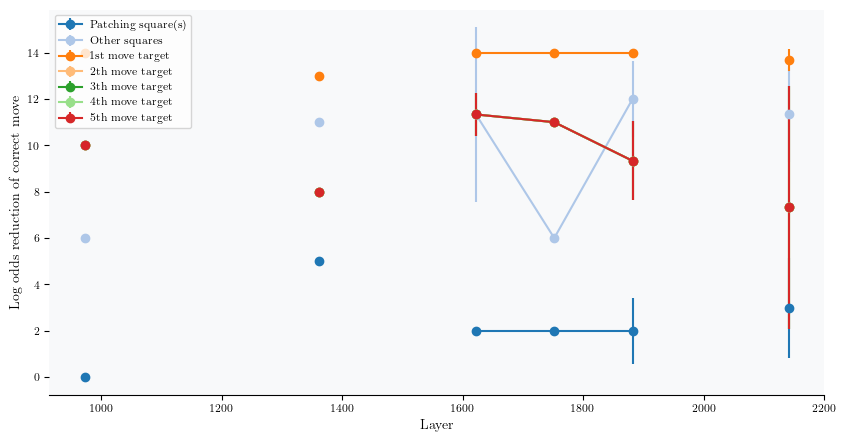

1234555
Skipped 3 out of 13 puzzles (23.08%)
Intersection skips: 3 out of 13 puzzles (23.08%)
Patching: 10, Other: 10
End square:: 1st: 10, 2nd: 10, 3rd: 10, 4th: 10, 5th: 10, 6th: 10, 7th: 10, 


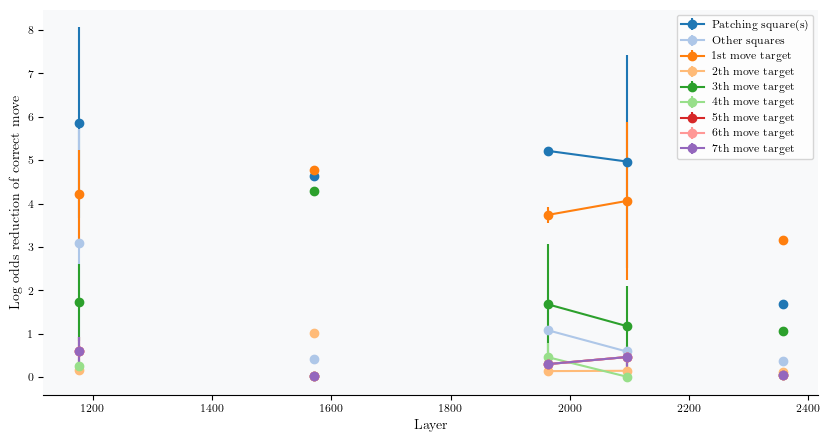

Skipped 3 out of 13 puzzles (23.08%)
Intersection skips: 3 out of 13 puzzles (23.08%)
Patching: 10, Other: 10
End square:: 1st: 10, 2nd: 10, 3rd: 10, 4th: 10, 5th: 10, 6th: 10, 7th: 10, 


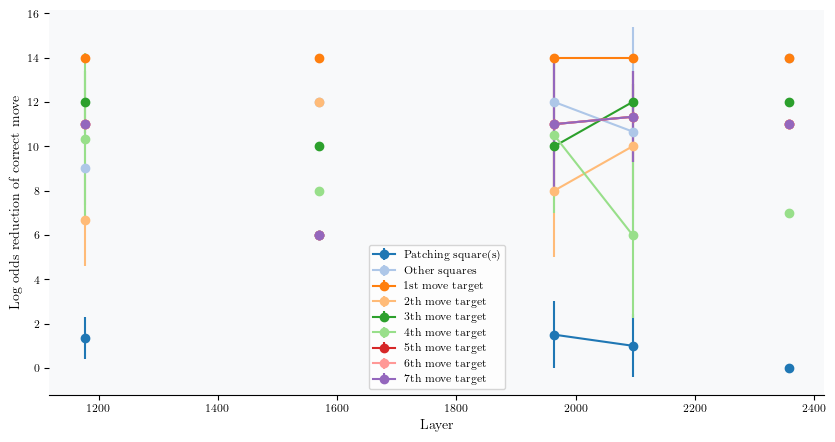

1234566
Skipped 5 out of 13 puzzles (38.46%)
Intersection skips: 5 out of 13 puzzles (38.46%)
Patching: 8, Other: 8
End square:: 1st: 8, 2nd: 8, 3rd: 8, 4th: 8, 5th: 8, 6th: 8, 7th: 8, 


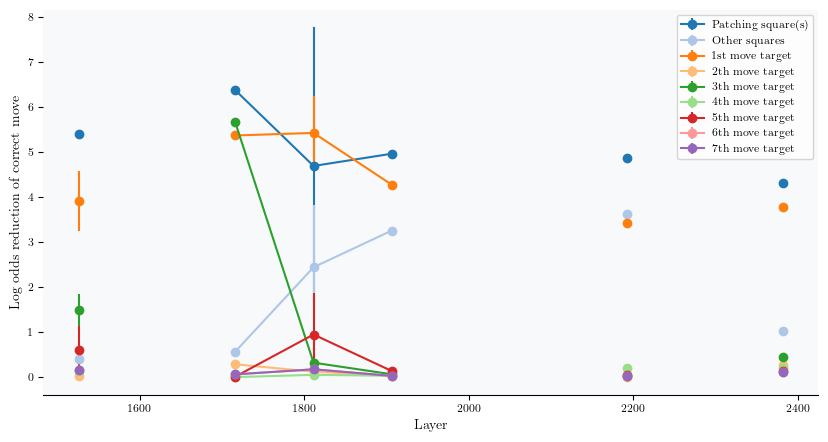

Skipped 5 out of 13 puzzles (38.46%)
Intersection skips: 5 out of 13 puzzles (38.46%)
Patching: 8, Other: 8
End square:: 1st: 8, 2nd: 8, 3rd: 8, 4th: 8, 5th: 8, 6th: 8, 7th: 8, 


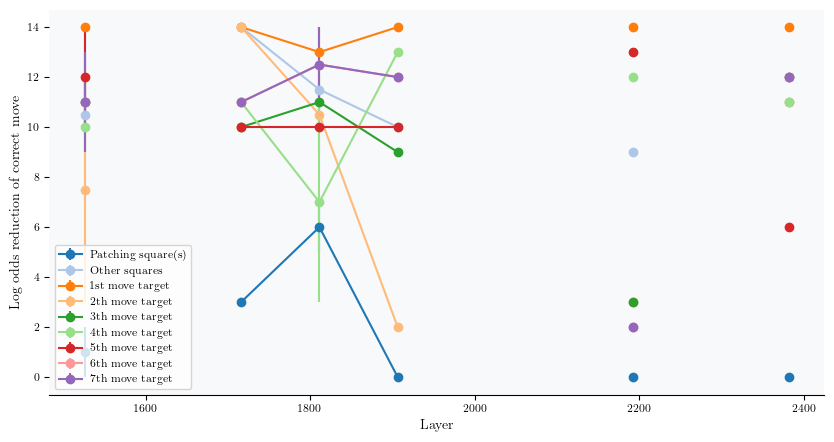

1123144
Skipped 4 out of 13 puzzles (30.77%)
Intersection skips: 4 out of 13 puzzles (30.77%)
Patching: 9, Other: 9
End square:: 1st: 9, 2nd: 9, 3rd: 9, 4th: 9, 5th: 9, 6th: 9, 7th: 9, 


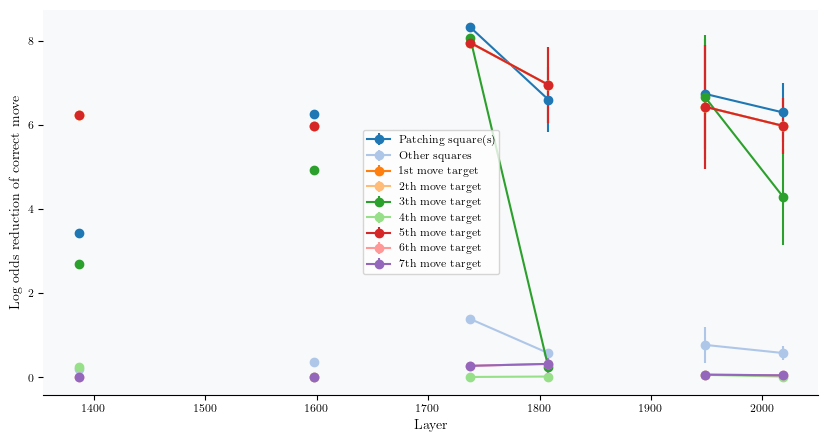

Skipped 4 out of 13 puzzles (30.77%)
Intersection skips: 4 out of 13 puzzles (30.77%)
Patching: 9, Other: 9
End square:: 1st: 9, 2nd: 9, 3rd: 9, 4th: 9, 5th: 9, 6th: 9, 7th: 9, 


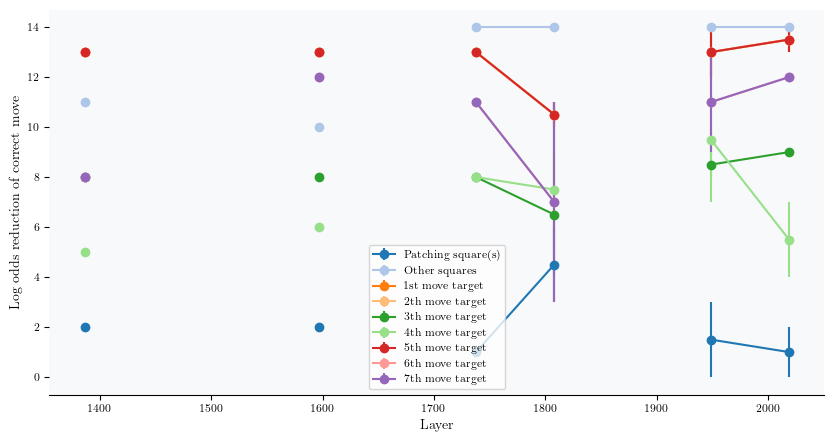

1234444
Skipped 0 out of 12 puzzles (0.00%)
Intersection skips: 0 out of 12 puzzles (0.00%)
Patching: 12, Other: 12
End square:: 1st: 12, 2nd: 12, 3rd: 12, 4th: 12, 5th: 12, 6th: 12, 7th: 12, 


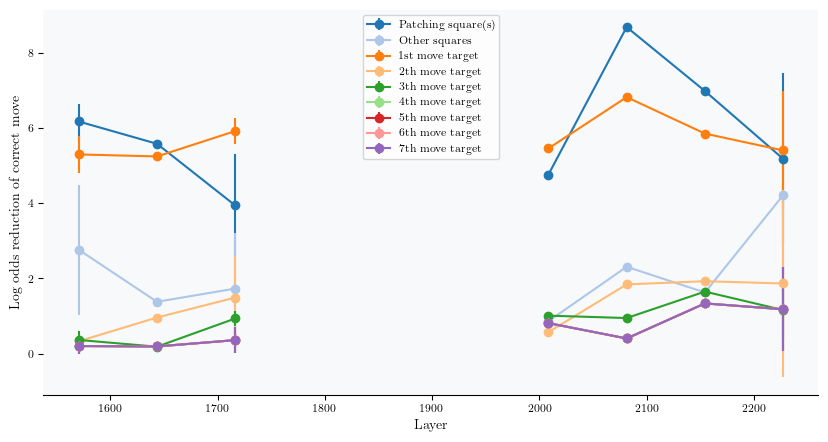

Skipped 0 out of 12 puzzles (0.00%)
Intersection skips: 0 out of 12 puzzles (0.00%)
Patching: 12, Other: 12
End square:: 1st: 12, 2nd: 12, 3rd: 12, 4th: 12, 5th: 12, 6th: 12, 7th: 12, 


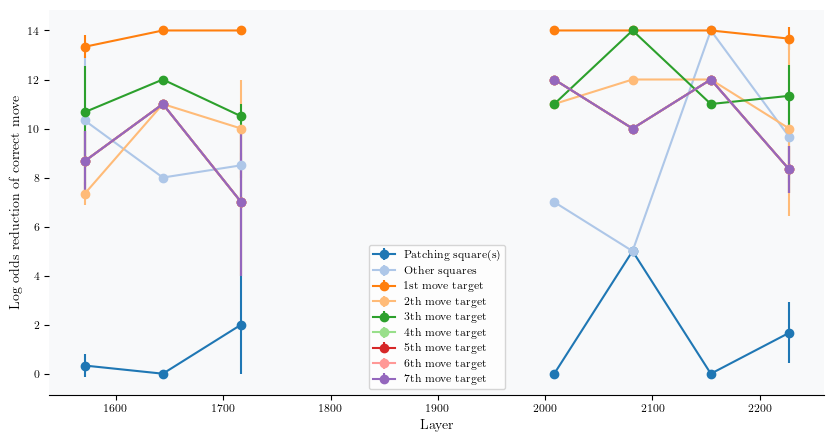

1233456
Skipped 5 out of 11 puzzles (45.45%)
Intersection skips: 5 out of 11 puzzles (45.45%)
Patching: 6, Other: 6
End square:: 1st: 6, 2nd: 6, 3rd: 6, 4th: 6, 5th: 6, 6th: 6, 7th: 6, 


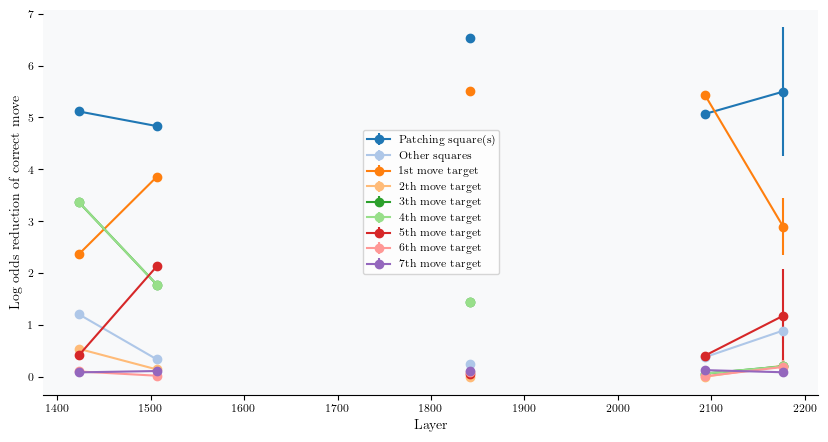

Skipped 5 out of 11 puzzles (45.45%)
Intersection skips: 5 out of 11 puzzles (45.45%)
Patching: 6, Other: 6
End square:: 1st: 6, 2nd: 6, 3rd: 6, 4th: 6, 5th: 6, 6th: 6, 7th: 6, 


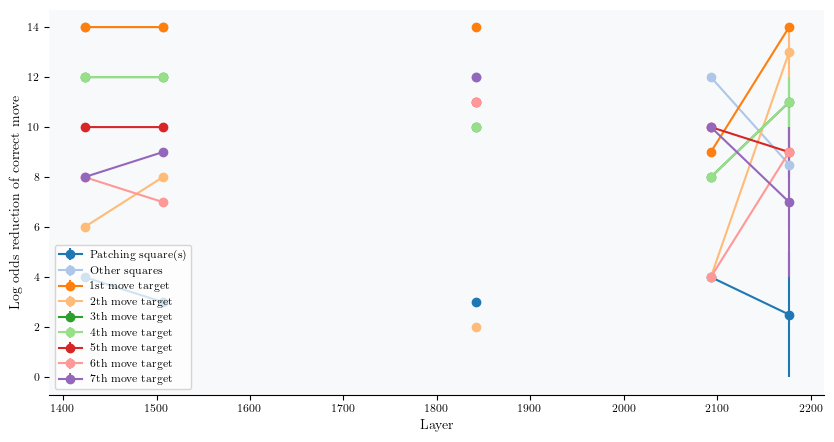

In [24]:
for possibility, mask in zip(list(good_results), good_mask):
    print(possibility)
    try:
        plot_rating(all_effects=all_effects, mask=mask, allowed_lengths=[3, 4, 5, 6, 7], include_starting=False)
        plot_rating_layer(all_effects=all_effects, mask=mask, allowed_lengths=[3, 4, 5, 6, 7], include_starting=False)
    except ValueError:
        continue

In [42]:
def plot_rating_grid(all_effects, good_results, good_mask, n_cols=4, allowed_lengths=[3, 4, 5, 6, 7]):
    n_plots = len(good_results)
    n_rows = (n_plots + n_cols - 1) // n_cols
    print(n_rows, n_cols)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 4*n_rows), squeeze=True, sharex=True, sharey=True)
    
    for idx, (possibility, mask) in enumerate(zip(list(good_results), good_mask)):
        row = idx // n_cols
        col = idx % n_cols
        ax = axes[row, col]
        
        effects_data, non_skipped = get_effects_data(all_effects, mask, allowed_lengths=allowed_lengths, include_starting=False, apply_mask=True)
        relevant_ratings = puzzles.loc[non_skipped, "Rating"]

        colors = plt.cm.tab20(np.linspace(0, 1, 20)).tolist()
        
        for i, effect_data in enumerate(effects_data):
            effects = effect_data["effects"]
            if len(effects) == 0:
                continue

            bin_means, bin_edges, _ = binned_statistic(
                relevant_ratings, np.max(effects, axis=1), statistic='mean', bins=10
            )
            bin_std, _, _ = binned_statistic(
                relevant_ratings, np.max(effects, axis=1), statistic='std', bins=10
            )
            
            bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])
            
            ax.errorbar(
                bin_centers,
                bin_means,
                yerr=bin_std,
                label=effect_data["name"],
                fmt='o-',
                color=colors[i]
            )

        ax.set_title(f"{possibility}")
        if col == 0:
            ax.set_ylabel("Log odds reduction")
        if row == n_rows - 1:
            ax.set_xlabel("Rating")
        ax.legend(fontsize='x-small')
        ax.spines[["right", "top"]].set_visible(False)

    # Remove any unused subplots
    for idx in range(len(good_results), n_rows * n_cols):
        row = idx // n_cols
        col = idx % n_cols
        fig.delaxes(axes[row, col])

    plt.tight_layout()
    return fig

def plot_rating_layer_grid(all_effects, good_results, good_mask, n_cols=4, allowed_lengths=[3, 4, 5, 6, 7]):
    n_plots = len(good_results)
    n_rows = (n_plots + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 4*n_rows), squeeze=True, sharex=True, sharey=True)
    
    for idx, (possibility, mask) in enumerate(zip(list(good_results), good_mask)):
        row = idx // n_cols
        col = idx % n_cols
        ax = axes[row, col]
        
        effects_data, non_skipped = get_effects_data(all_effects, mask, allowed_lengths=allowed_lengths, include_starting=False, apply_mask=True)
        relevant_ratings = puzzles.loc[non_skipped, "Rating"]

        colors = plt.cm.tab20(np.linspace(0, 1, 20)).tolist()
        
        for i, effect_data in enumerate(effects_data):
            effects = effect_data["effects"]
            if len(effects) == 0:
                continue

            bin_means, bin_edges, _ = binned_statistic(
                relevant_ratings, np.argmax(effects, axis=1), statistic='mean', bins=10
            )
            bin_std, _, _ = binned_statistic(
                relevant_ratings, np.argmax(effects, axis=1), statistic='std', bins=10
            )
            
            bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])
            
            ax.errorbar(
                bin_centers,
                bin_means,
                yerr=bin_std,
                label=effect_data["name"],
                fmt='o-',
                color=colors[i]
            )

        ax.set_title(f"{possibility}")
        if col == 0:
            ax.set_ylabel("Layer")
        if row == n_rows - 1:
            ax.set_xlabel("Rating")
        ax.legend(fontsize='x-small')
        ax.spines[["right", "top"]].set_visible(False)

    # Remove any unused subplots
    for idx in range(len(good_results), n_rows * n_cols):
        row = idx // n_cols
        col = idx % n_cols
        fig.delaxes(axes[row, col])

    plt.tight_layout()
    return fig

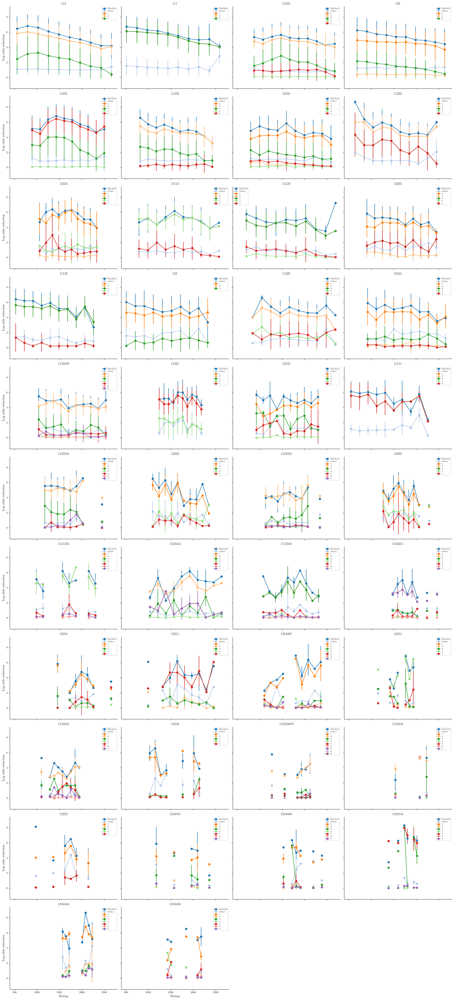

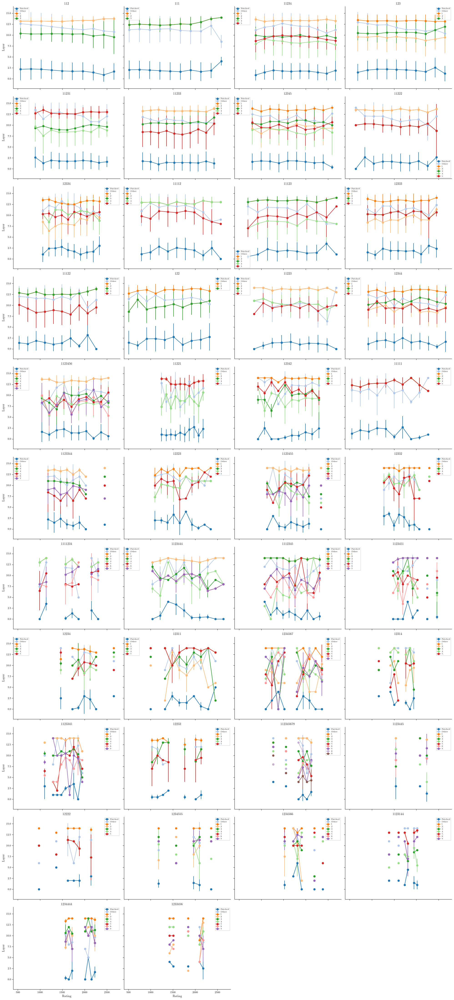

In [35]:
# Usage:
fig_rating = plot_rating_grid(all_effects, good_results, good_mask, allowed_lengths=[3, 4, 5, 6, 7, 8, 9])
plt.show()

fig_rating_layer = plot_rating_layer_grid(all_effects, good_results, good_mask, allowed_lengths=[3, 4, 5, 6, 7, 8, 9])
plt.show()

10 4


ValueError: Item wrong length 7612 instead of 22517.

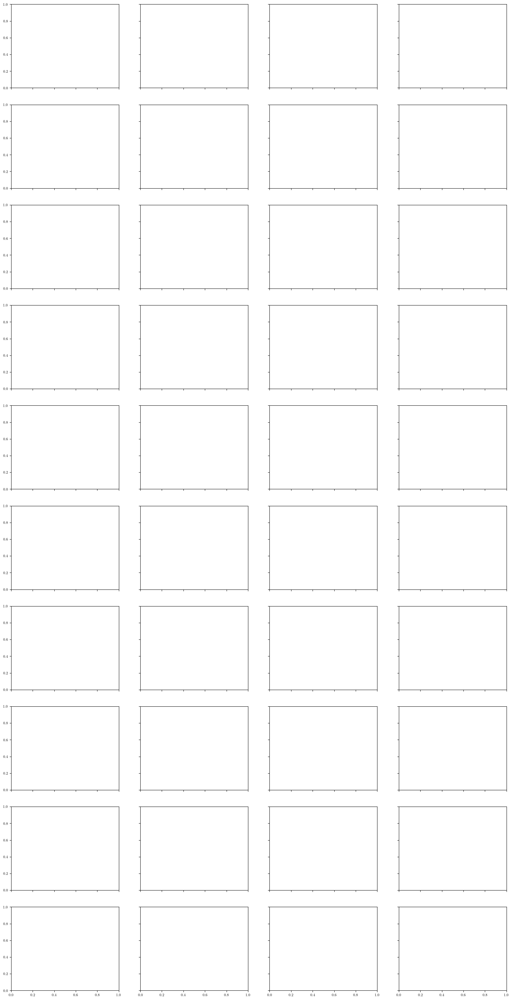

In [43]:
# Usage:
fig_rating = plot_rating_grid(all_effects_all, good_results_all, good_mask_all, allowed_lengths=[3, 4, 5, 6, 7, 8, 9])
plt.show()

fig_rating_layer = plot_rating_layer_grid(all_effects_all, good_results_all, good_mask_all, allowed_lengths=[3, 4, 5, 6, 7, 8, 9])
plt.show()

112
Easy puzzles
Skipped 7394 out of 7394 puzzles (100.00%)
Intersection skips: 0 out of 7394 puzzles (0.00%)
111
Easy puzzles
Skipped 3853 out of 3853 puzzles (100.00%)
Intersection skips: 0 out of 3853 puzzles (0.00%)
11234
Easy puzzles
Skipped 3105 out of 3126 puzzles (99.33%)
Intersection skips: 13 out of 3126 puzzles (0.42%)
Patching: 21, Other: 21
End square:: 1st: 21, 2nd: 21, 3rd: 21, 4th: 21, 5th: 21, 6th: 0, 7th: 0, 8th: 0, 9th: 0


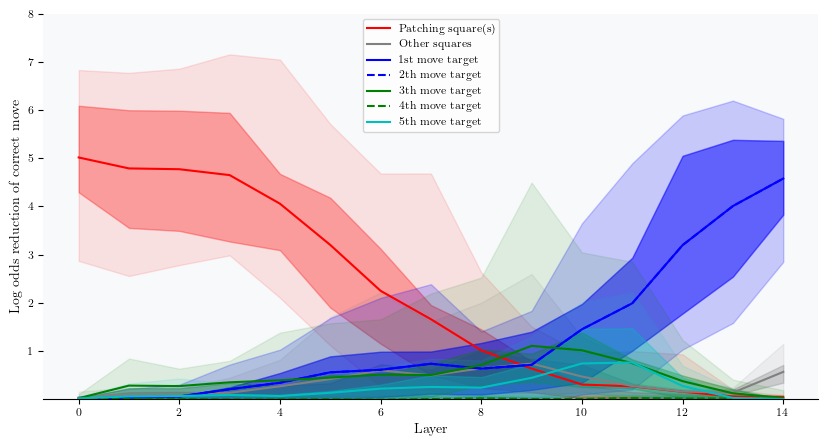

Medium puzzles
Skipped 1522 out of 3126 puzzles (48.69%)
Intersection skips: 940 out of 3126 puzzles (30.07%)
Patching: 1604, Other: 1604
End square:: 1st: 1604, 2nd: 1604, 3rd: 1604, 4th: 1604, 5th: 1604, 6th: 0, 7th: 0, 8th: 0, 9th: 0


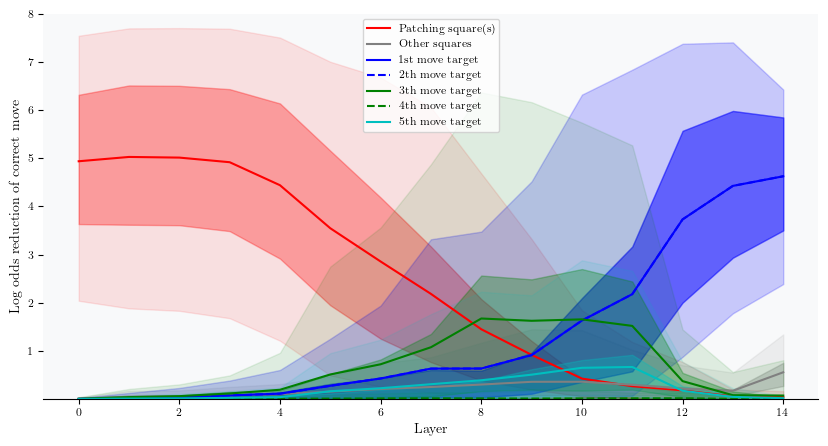

Hard puzzles
Skipped 2733 out of 3126 puzzles (87.43%)
Intersection skips: 160 out of 3126 puzzles (5.12%)
Patching: 393, Other: 393
End square:: 1st: 393, 2nd: 393, 3rd: 393, 4th: 393, 5th: 393, 6th: 0, 7th: 0, 8th: 0, 9th: 0


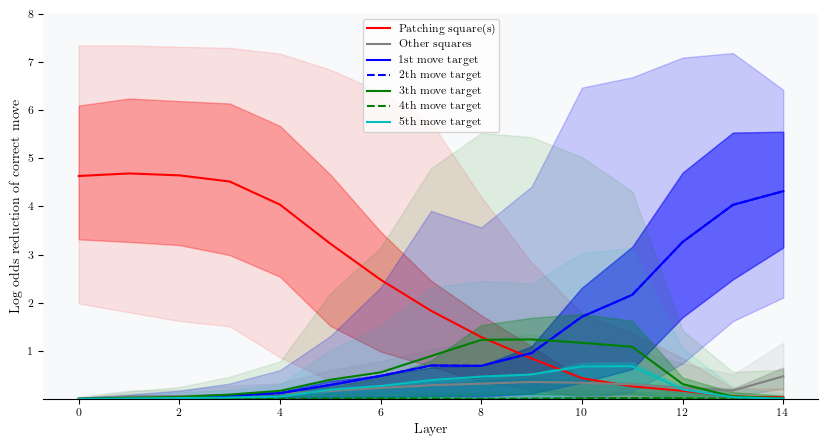

123
Easy puzzles
Skipped 2455 out of 2455 puzzles (100.00%)
Intersection skips: 0 out of 2455 puzzles (0.00%)
11231
Easy puzzles
Skipped 1350 out of 1360 puzzles (99.26%)
Intersection skips: 2 out of 1360 puzzles (0.15%)
Patching: 10, Other: 10
End square:: 1st: 10, 2nd: 10, 3rd: 10, 4th: 10, 5th: 10, 6th: 0, 7th: 0, 8th: 0, 9th: 0


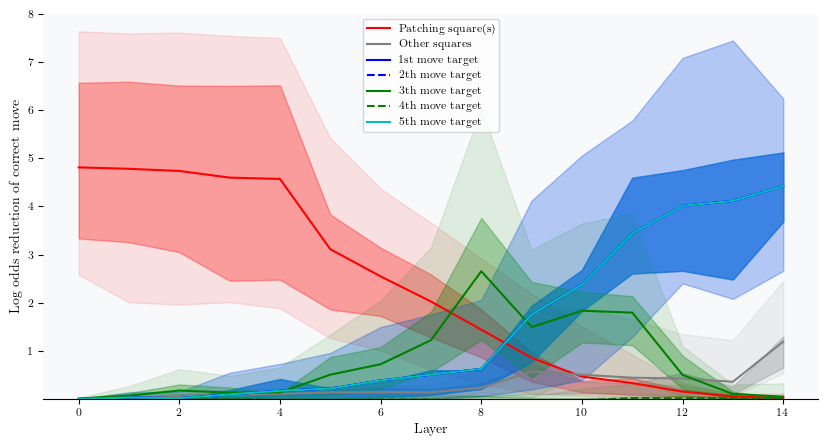

Medium puzzles
Skipped 373 out of 1360 puzzles (27.43%)
Intersection skips: 215 out of 1360 puzzles (15.81%)
Patching: 987, Other: 987
End square:: 1st: 987, 2nd: 987, 3rd: 987, 4th: 987, 5th: 987, 6th: 0, 7th: 0, 8th: 0, 9th: 0


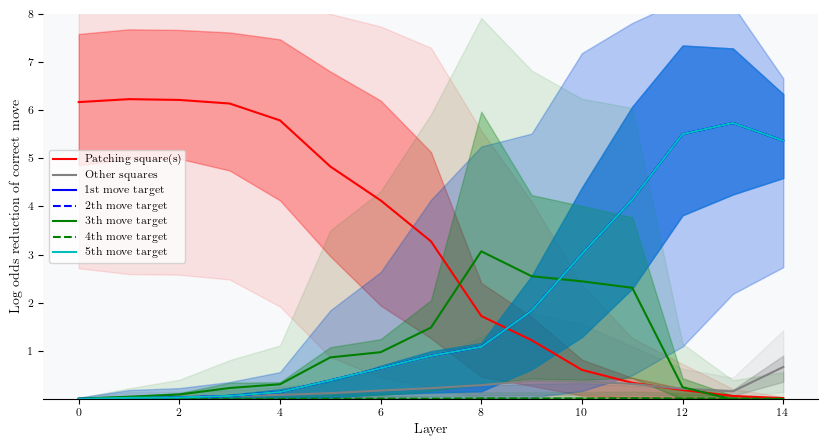

Hard puzzles
Skipped 1243 out of 1360 puzzles (91.40%)
Intersection skips: 29 out of 1360 puzzles (2.13%)
Patching: 117, Other: 117
End square:: 1st: 117, 2nd: 117, 3rd: 117, 4th: 117, 5th: 117, 6th: 0, 7th: 0, 8th: 0, 9th: 0


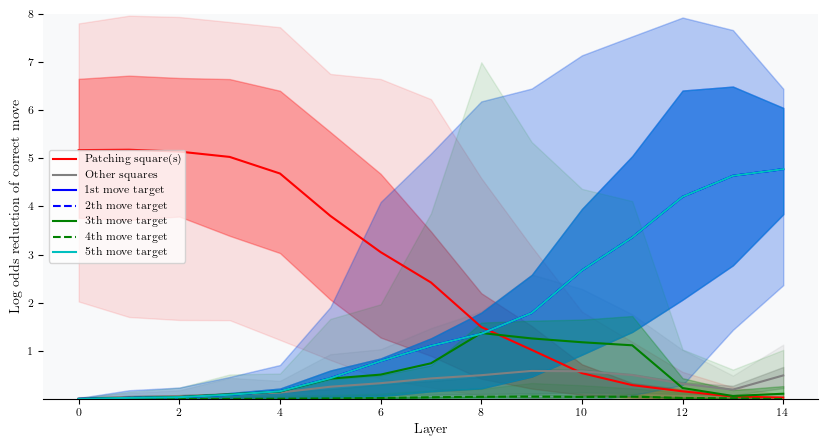

11233
Easy puzzles
Skipped 643 out of 676 puzzles (95.12%)
Intersection skips: 4 out of 676 puzzles (0.59%)
Patching: 33, Other: 33
End square:: 1st: 33, 2nd: 33, 3rd: 33, 4th: 33, 5th: 33, 6th: 0, 7th: 0, 8th: 0, 9th: 0


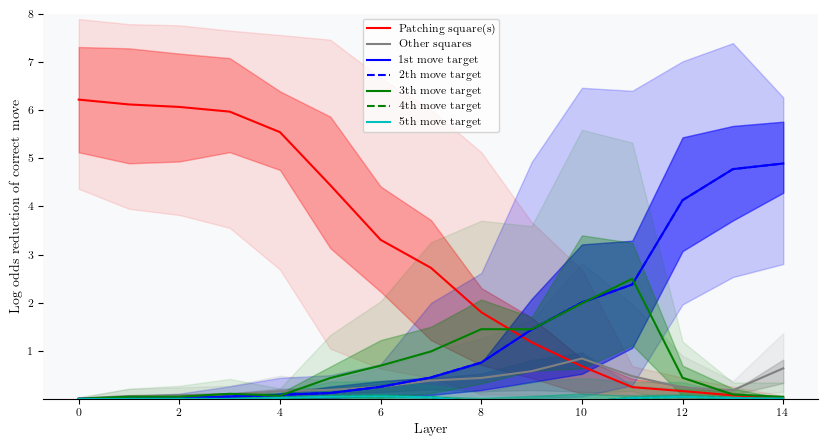

Medium puzzles
Skipped 158 out of 676 puzzles (23.37%)
Intersection skips: 54 out of 676 puzzles (7.99%)
Patching: 518, Other: 518
End square:: 1st: 518, 2nd: 518, 3rd: 518, 4th: 518, 5th: 518, 6th: 0, 7th: 0, 8th: 0, 9th: 0


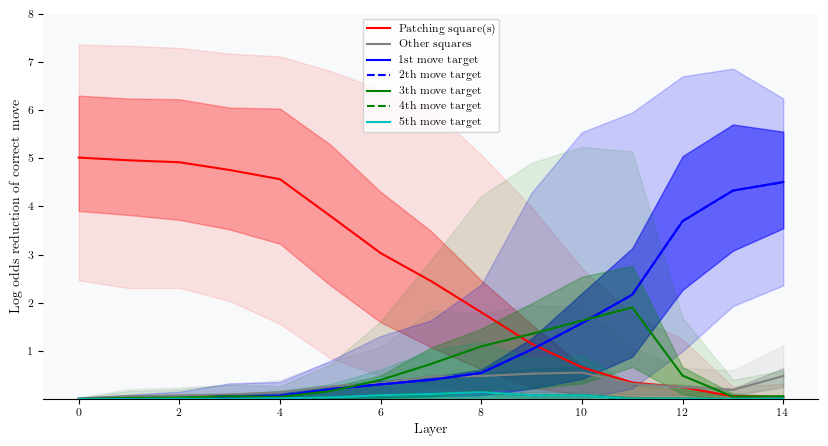

Hard puzzles
Skipped 617 out of 676 puzzles (91.27%)
Intersection skips: 8 out of 676 puzzles (1.18%)
Patching: 59, Other: 59
End square:: 1st: 59, 2nd: 59, 3rd: 59, 4th: 59, 5th: 59, 6th: 0, 7th: 0, 8th: 0, 9th: 0


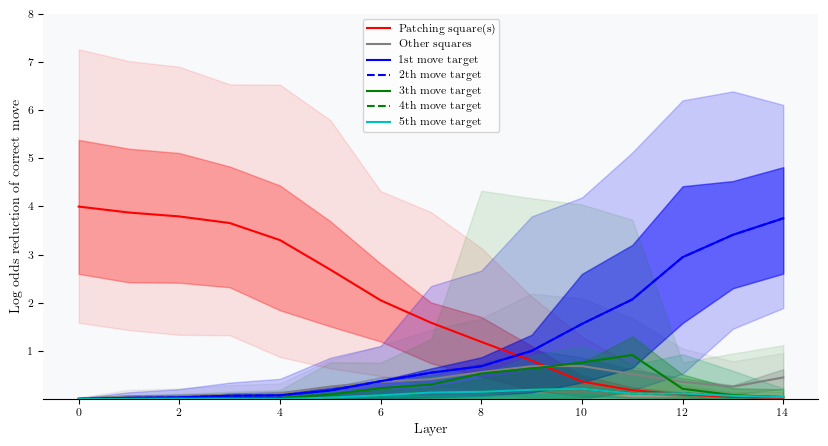

12345
Easy puzzles
Skipped 405 out of 430 puzzles (94.19%)
Intersection skips: 13 out of 430 puzzles (3.02%)
Patching: 25, Other: 25
End square:: 1st: 25, 2nd: 25, 3rd: 25, 4th: 25, 5th: 25, 6th: 0, 7th: 0, 8th: 0, 9th: 0


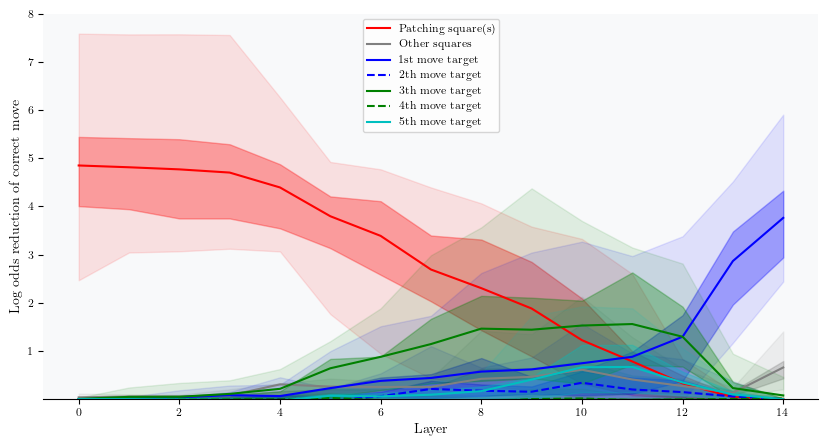

Medium puzzles
Skipped 223 out of 430 puzzles (51.86%)
Intersection skips: 92 out of 430 puzzles (21.40%)
Patching: 207, Other: 207
End square:: 1st: 207, 2nd: 207, 3rd: 207, 4th: 207, 5th: 207, 6th: 0, 7th: 0, 8th: 0, 9th: 0


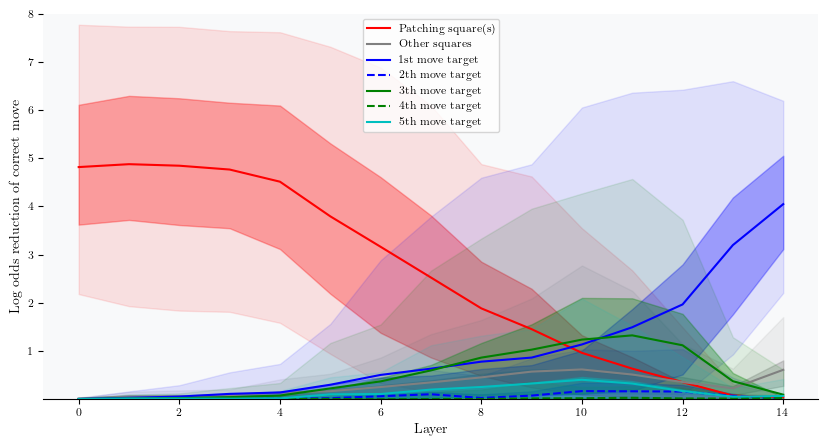

Hard puzzles
Skipped 366 out of 430 puzzles (85.12%)
Intersection skips: 29 out of 430 puzzles (6.74%)
Patching: 64, Other: 64
End square:: 1st: 64, 2nd: 64, 3rd: 64, 4th: 64, 5th: 64, 6th: 0, 7th: 0, 8th: 0, 9th: 0


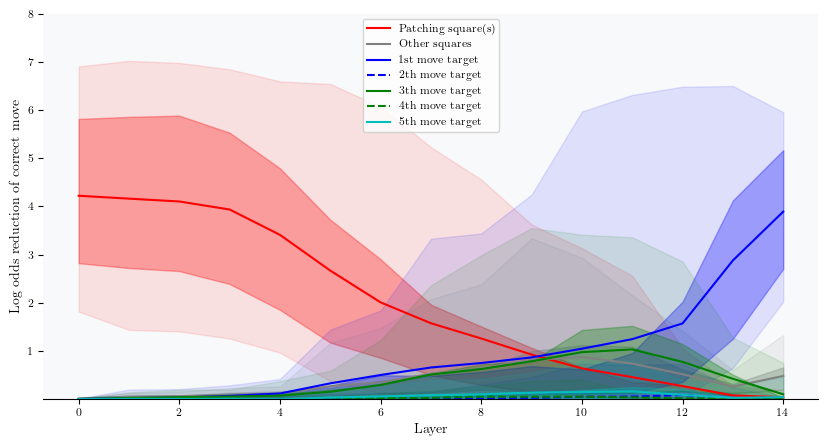

11222
Easy puzzles
Skipped 287 out of 305 puzzles (94.10%)
Intersection skips: 2 out of 305 puzzles (0.66%)
Patching: 18, Other: 18
End square:: 1st: 18, 2nd: 18, 3rd: 18, 4th: 18, 5th: 18, 6th: 0, 7th: 0, 8th: 0, 9th: 0


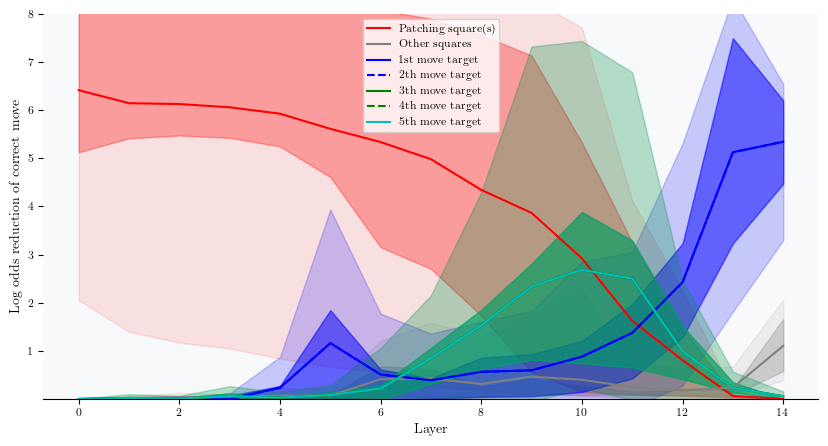

Medium puzzles
Skipped 78 out of 305 puzzles (25.57%)
Intersection skips: 26 out of 305 puzzles (8.52%)
Patching: 227, Other: 227
End square:: 1st: 227, 2nd: 227, 3rd: 227, 4th: 227, 5th: 227, 6th: 0, 7th: 0, 8th: 0, 9th: 0


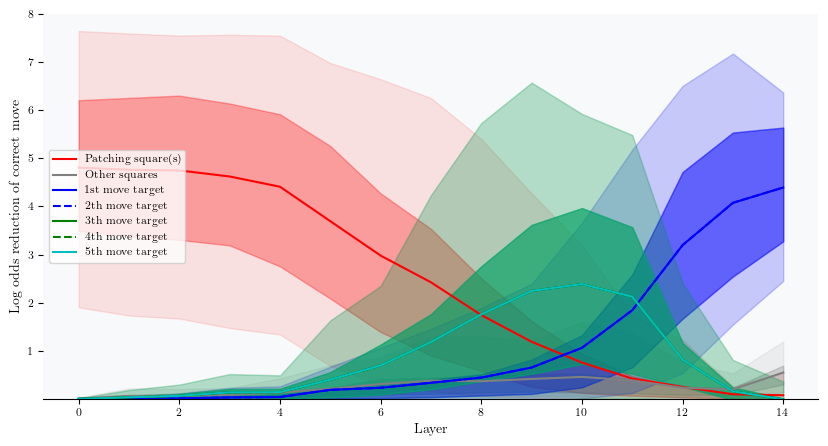

Hard puzzles
Skipped 275 out of 305 puzzles (90.16%)
Intersection skips: 2 out of 305 puzzles (0.66%)
Patching: 30, Other: 30
End square:: 1st: 30, 2nd: 30, 3rd: 30, 4th: 30, 5th: 30, 6th: 0, 7th: 0, 8th: 0, 9th: 0


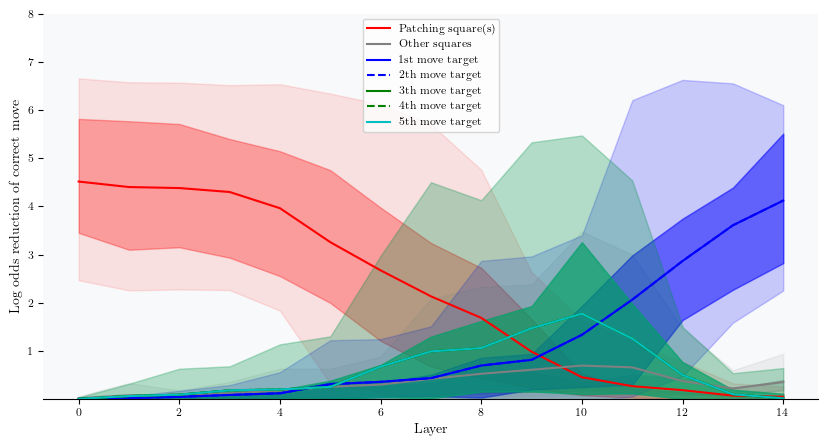

12334
Easy puzzles
Skipped 236 out of 237 puzzles (99.58%)
Intersection skips: 2 out of 237 puzzles (0.84%)
Patching: 1, Other: 1
End square:: 1st: 1, 2nd: 1, 3rd: 1, 4th: 1, 5th: 1, 6th: 0, 7th: 0, 8th: 0, 9th: 0


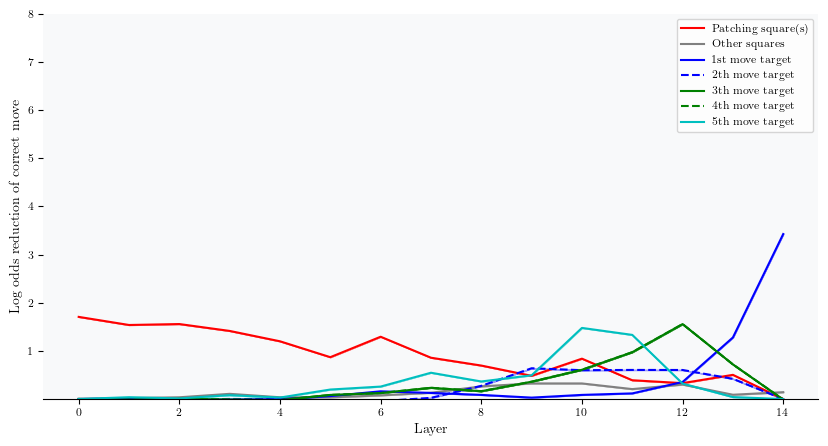

Medium puzzles
Skipped 123 out of 237 puzzles (51.90%)
Intersection skips: 72 out of 237 puzzles (30.38%)
Patching: 114, Other: 114
End square:: 1st: 114, 2nd: 114, 3rd: 114, 4th: 114, 5th: 114, 6th: 0, 7th: 0, 8th: 0, 9th: 0


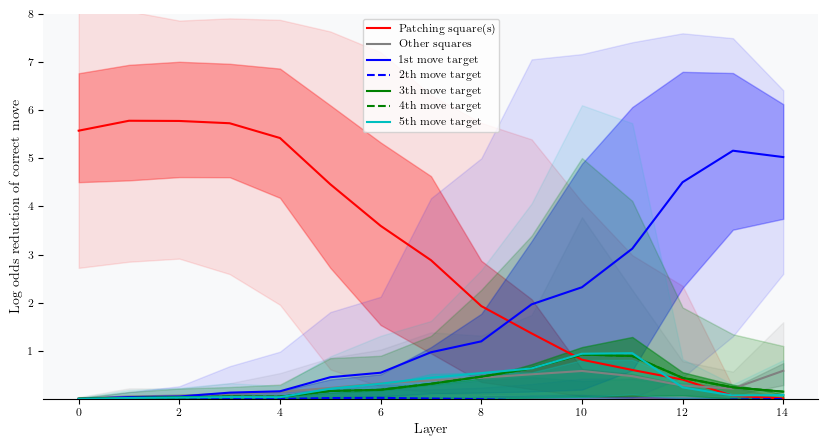

Hard puzzles
Skipped 204 out of 237 puzzles (86.08%)
Intersection skips: 15 out of 237 puzzles (6.33%)
Patching: 33, Other: 33
End square:: 1st: 33, 2nd: 33, 3rd: 33, 4th: 33, 5th: 33, 6th: 0, 7th: 0, 8th: 0, 9th: 0


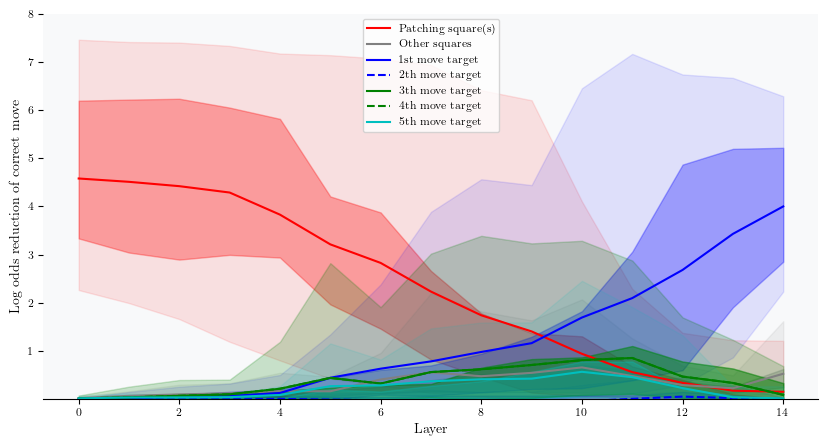

11112
Easy puzzles
Skipped 202 out of 227 puzzles (88.99%)
Intersection skips: 3 out of 227 puzzles (1.32%)
Patching: 25, Other: 25
End square:: 1st: 25, 2nd: 25, 3rd: 25, 4th: 25, 5th: 25, 6th: 0, 7th: 0, 8th: 0, 9th: 0


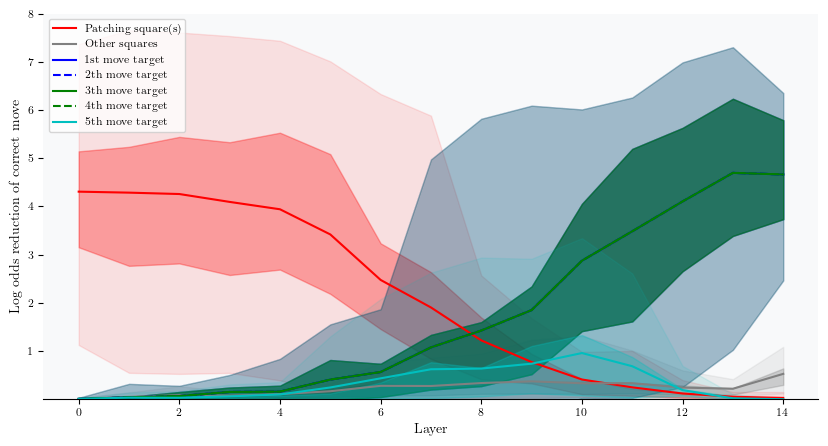

Medium puzzles
Skipped 69 out of 227 puzzles (30.40%)
Intersection skips: 18 out of 227 puzzles (7.93%)
Patching: 158, Other: 158
End square:: 1st: 158, 2nd: 158, 3rd: 158, 4th: 158, 5th: 158, 6th: 0, 7th: 0, 8th: 0, 9th: 0


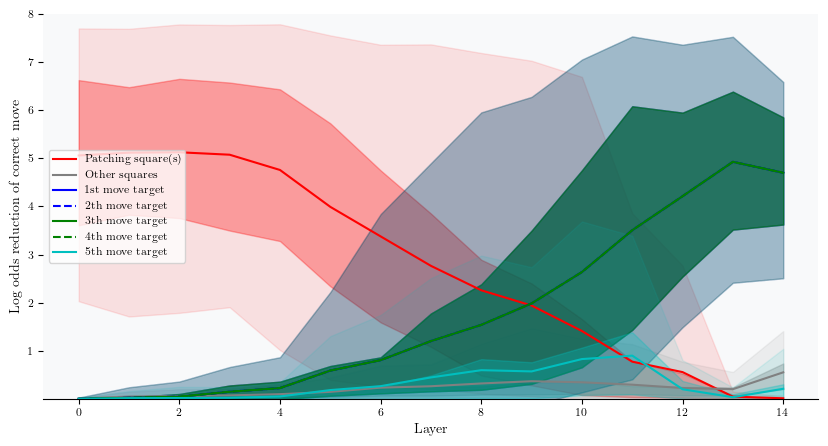

Hard puzzles
Skipped 205 out of 227 puzzles (90.31%)
Intersection skips: 1 out of 227 puzzles (0.44%)
Patching: 22, Other: 22
End square:: 1st: 22, 2nd: 22, 3rd: 22, 4th: 22, 5th: 22, 6th: 0, 7th: 0, 8th: 0, 9th: 0


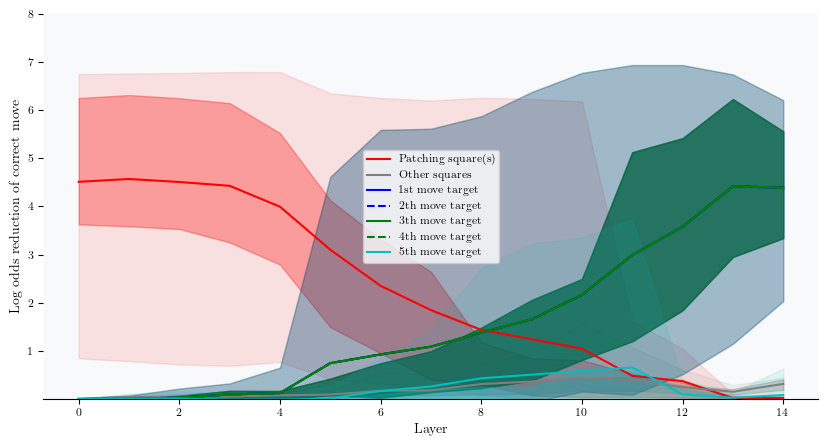

11123
Easy puzzles
Skipped 207 out of 222 puzzles (93.24%)
Intersection skips: 8 out of 222 puzzles (3.60%)
Patching: 15, Other: 15
End square:: 1st: 15, 2nd: 15, 3rd: 15, 4th: 15, 5th: 15, 6th: 0, 7th: 0, 8th: 0, 9th: 0


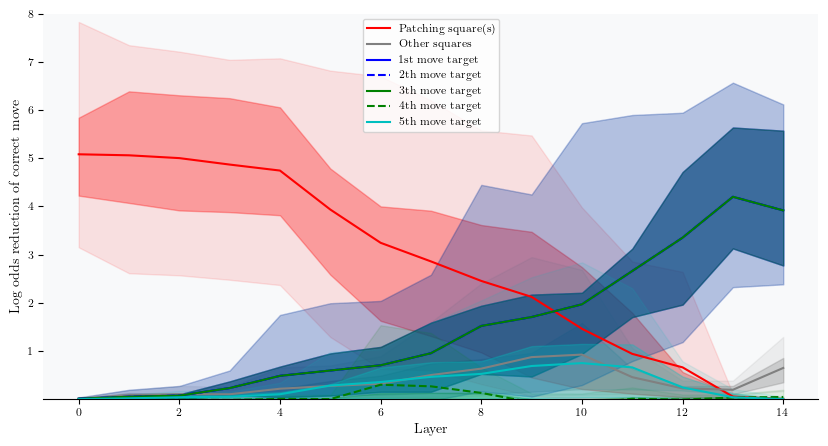

Medium puzzles
Skipped 113 out of 222 puzzles (50.90%)
Intersection skips: 52 out of 222 puzzles (23.42%)
Patching: 109, Other: 109
End square:: 1st: 109, 2nd: 109, 3rd: 109, 4th: 109, 5th: 109, 6th: 0, 7th: 0, 8th: 0, 9th: 0


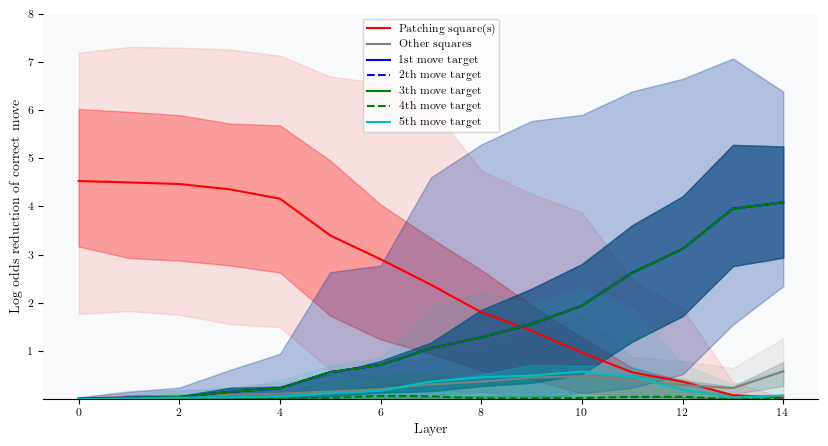

Hard puzzles
Skipped 188 out of 222 puzzles (84.68%)
Intersection skips: 4 out of 222 puzzles (1.80%)
Patching: 34, Other: 34
End square:: 1st: 34, 2nd: 34, 3rd: 34, 4th: 34, 5th: 34, 6th: 0, 7th: 0, 8th: 0, 9th: 0


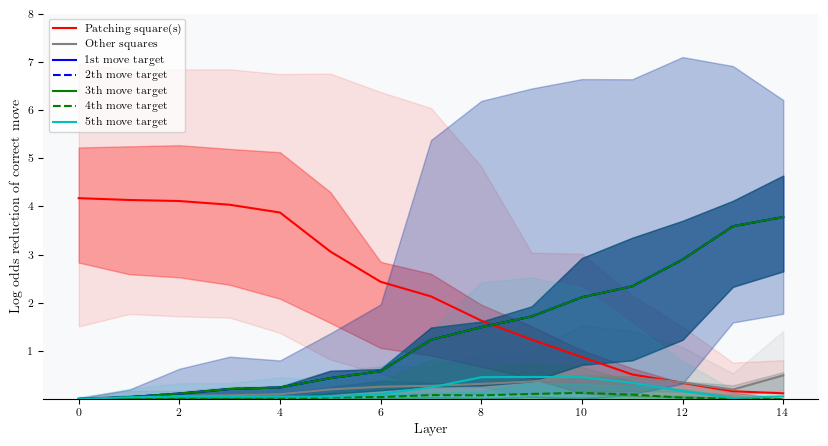

12333
Easy puzzles
Skipped 205 out of 218 puzzles (94.04%)
Intersection skips: 2 out of 218 puzzles (0.92%)
Patching: 13, Other: 13
End square:: 1st: 13, 2nd: 13, 3rd: 13, 4th: 13, 5th: 13, 6th: 0, 7th: 0, 8th: 0, 9th: 0


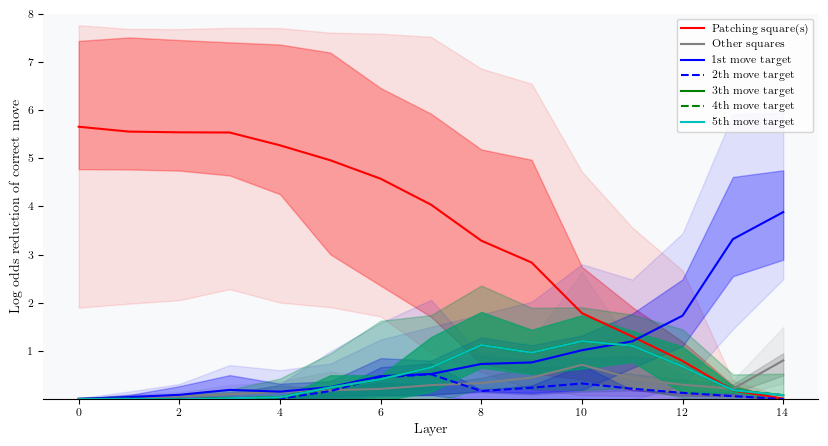

Medium puzzles
Skipped 72 out of 218 puzzles (33.03%)
Intersection skips: 20 out of 218 puzzles (9.17%)
Patching: 146, Other: 146
End square:: 1st: 146, 2nd: 146, 3rd: 146, 4th: 146, 5th: 146, 6th: 0, 7th: 0, 8th: 0, 9th: 0


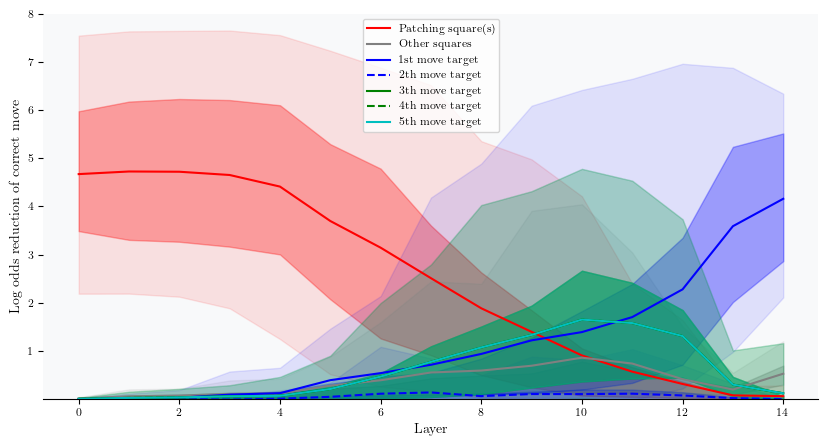

Hard puzzles
Skipped 182 out of 218 puzzles (83.49%)
Intersection skips: 1 out of 218 puzzles (0.46%)
Patching: 36, Other: 36
End square:: 1st: 36, 2nd: 36, 3rd: 36, 4th: 36, 5th: 36, 6th: 0, 7th: 0, 8th: 0, 9th: 0


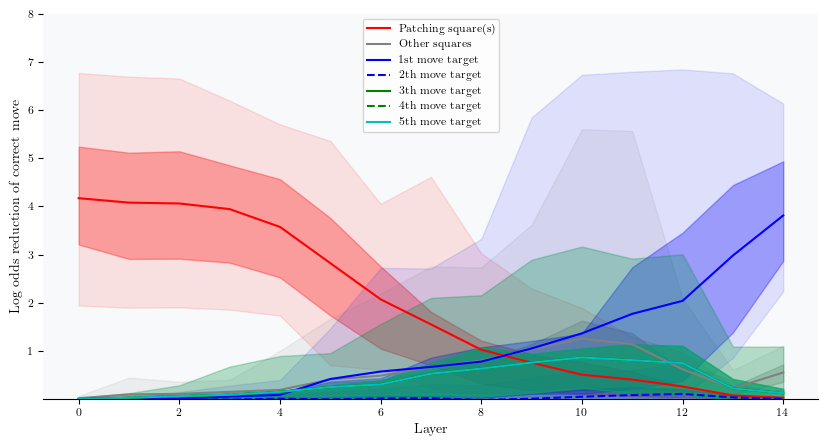

11122
Easy puzzles
Skipped 138 out of 204 puzzles (67.65%)
Intersection skips: 7 out of 204 puzzles (3.43%)
Patching: 66, Other: 66
End square:: 1st: 66, 2nd: 66, 3rd: 66, 4th: 66, 5th: 66, 6th: 0, 7th: 0, 8th: 0, 9th: 0


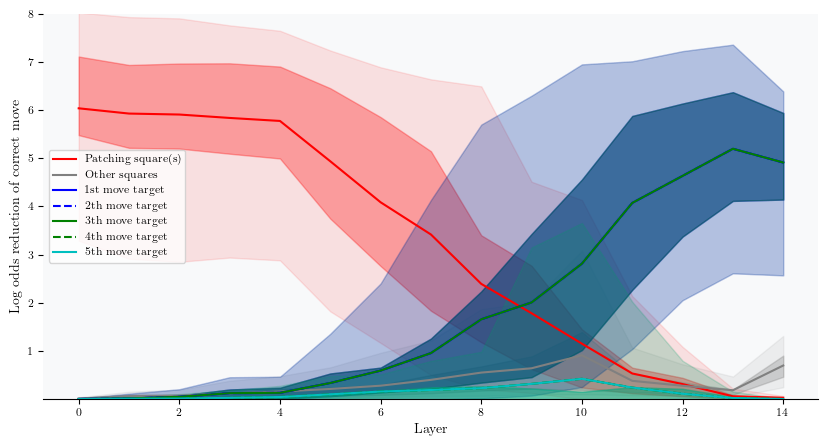

Medium puzzles
Skipped 102 out of 204 puzzles (50.00%)
Intersection skips: 21 out of 204 puzzles (10.29%)
Patching: 102, Other: 102
End square:: 1st: 102, 2nd: 102, 3rd: 102, 4th: 102, 5th: 102, 6th: 0, 7th: 0, 8th: 0, 9th: 0


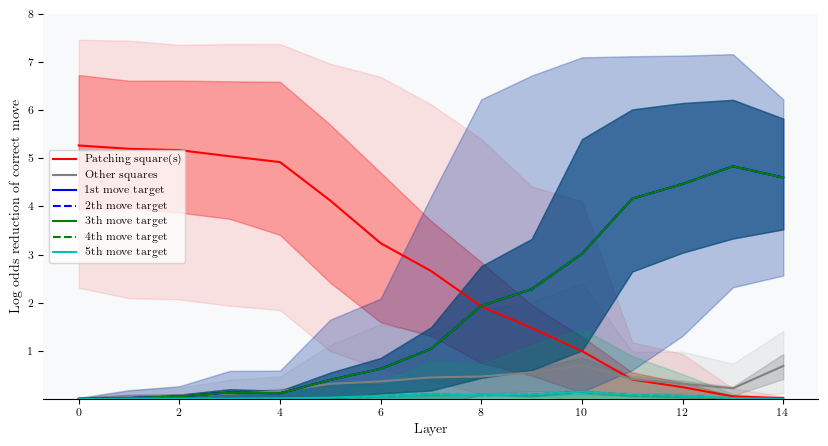

Hard puzzles
Skipped 196 out of 204 puzzles (96.08%)
Intersection skips: 0 out of 204 puzzles (0.00%)
Patching: 8, Other: 8
End square:: 1st: 8, 2nd: 8, 3rd: 8, 4th: 8, 5th: 8, 6th: 0, 7th: 0, 8th: 0, 9th: 0


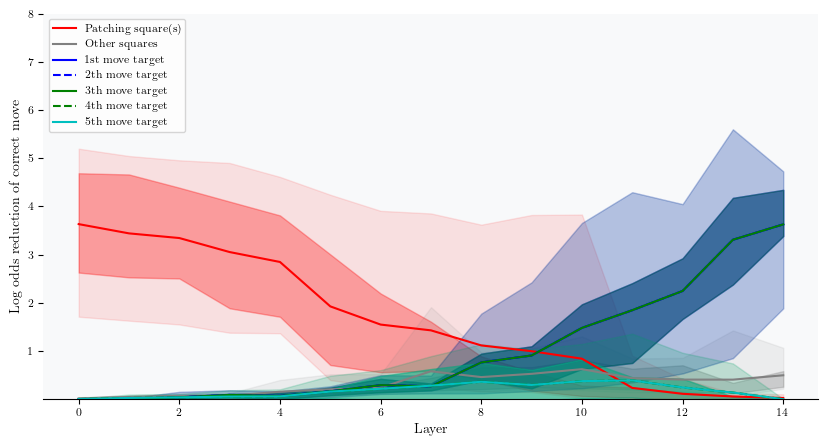

122
Easy puzzles
Skipped 202 out of 202 puzzles (100.00%)
Intersection skips: 0 out of 202 puzzles (0.00%)
11223
Easy puzzles
Skipped 183 out of 185 puzzles (98.92%)
Intersection skips: 1 out of 185 puzzles (0.54%)
Patching: 2, Other: 2
End square:: 1st: 2, 2nd: 2, 3rd: 2, 4th: 2, 5th: 2, 6th: 0, 7th: 0, 8th: 0, 9th: 0


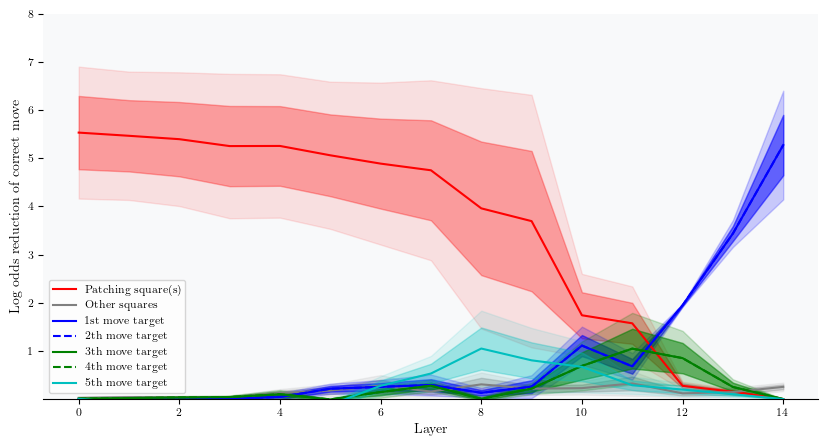

Medium puzzles
Skipped 69 out of 185 puzzles (37.30%)
Intersection skips: 24 out of 185 puzzles (12.97%)
Patching: 116, Other: 116
End square:: 1st: 116, 2nd: 116, 3rd: 116, 4th: 116, 5th: 116, 6th: 0, 7th: 0, 8th: 0, 9th: 0


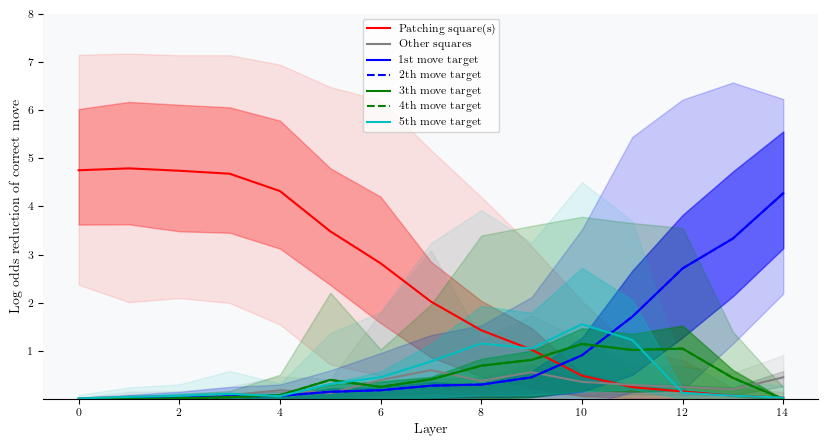

Hard puzzles
Skipped 147 out of 185 puzzles (79.46%)
Intersection skips: 6 out of 185 puzzles (3.24%)
Patching: 38, Other: 38
End square:: 1st: 38, 2nd: 38, 3rd: 38, 4th: 38, 5th: 38, 6th: 0, 7th: 0, 8th: 0, 9th: 0


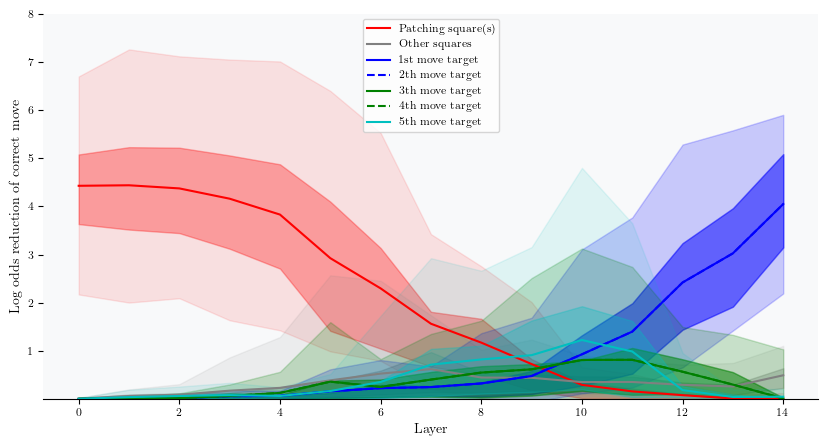

12344
Easy puzzles
Skipped 153 out of 160 puzzles (95.62%)
Intersection skips: 1 out of 160 puzzles (0.62%)
Patching: 7, Other: 7
End square:: 1st: 7, 2nd: 7, 3rd: 7, 4th: 7, 5th: 7, 6th: 0, 7th: 0, 8th: 0, 9th: 0


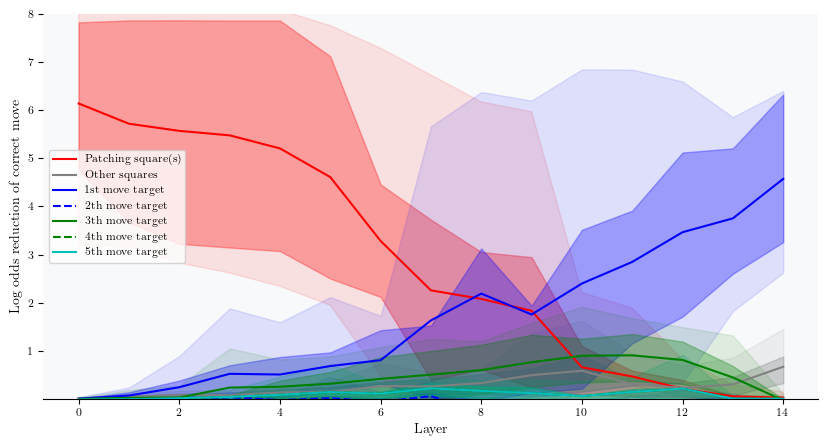

Medium puzzles
Skipped 77 out of 160 puzzles (48.12%)
Intersection skips: 30 out of 160 puzzles (18.75%)
Patching: 83, Other: 83
End square:: 1st: 83, 2nd: 83, 3rd: 83, 4th: 83, 5th: 83, 6th: 0, 7th: 0, 8th: 0, 9th: 0


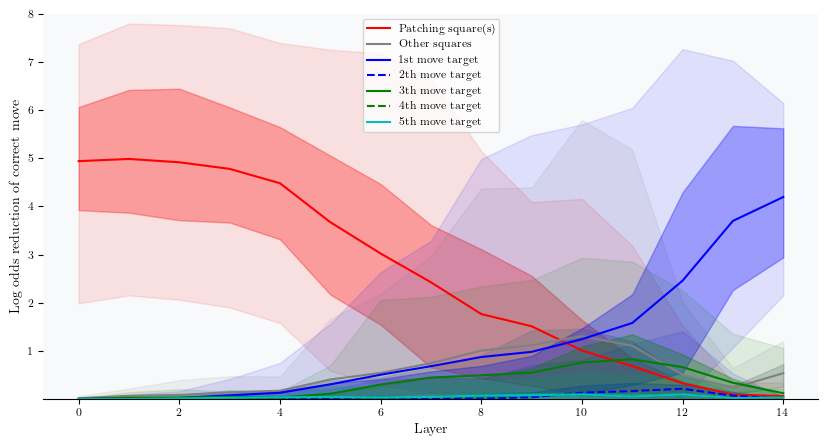

Hard puzzles
Skipped 124 out of 160 puzzles (77.50%)
Intersection skips: 4 out of 160 puzzles (2.50%)
Patching: 36, Other: 36
End square:: 1st: 36, 2nd: 36, 3rd: 36, 4th: 36, 5th: 36, 6th: 0, 7th: 0, 8th: 0, 9th: 0


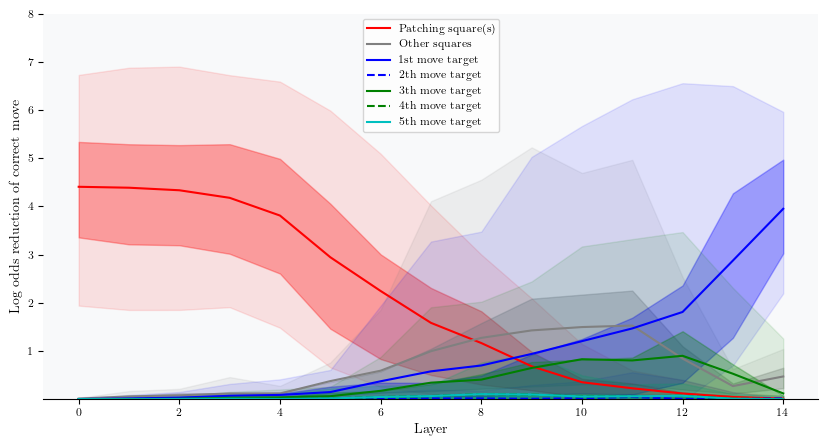

1123456
Easy puzzles
Skipped 130 out of 130 puzzles (100.00%)
Intersection skips: 0 out of 130 puzzles (0.00%)


In [59]:
for possibility, mask in zip(list(good_results), good_mask):
    print(possibility)
    try:
        print("Easy puzzles")
        plot_residual_effects(mask=mask, allowed_lengths=[5], include_starting=False, rating_range=(0, 1000))
        print("Medium puzzles")
        plot_residual_effects(mask=mask, allowed_lengths=[5], include_starting=False, rating_range=(1000, 2000))
        print("Hard puzzles")
        plot_residual_effects(mask=mask, allowed_lengths=[5], include_starting=False, rating_range=(2000, 3000))
    except ValueError:
        continue

Skipped 21046 out of 22517 puzzles (93.47%)
Intersection skips: 346 out of 22517 puzzles (1.54%)
Patching: 1471, Other: 1471
End square:: 1st: 1471, 2nd: 449, 3rd: 1438, 4th: 700, 5th: 542, 6th: 0, 7th: 0, 8th: 0, 9th: 0


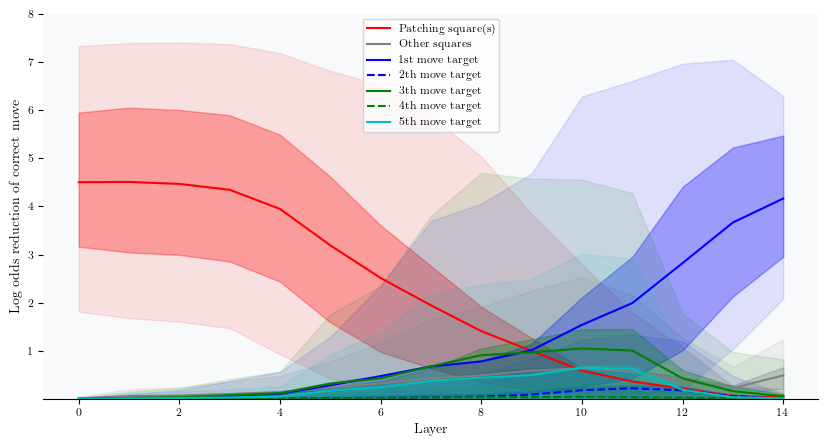

In [46]:
plot_residual_effects(allowed_lengths=[3, 4, 5], include_starting=False, apply_mask=False, rating_range=(2000, 3000))

Skipped 4051 out of 8192 puzzles (49.45%)
Intersection skips: 2326 out of 8192 puzzles (28.39%)
Patching: 4141, Other: 4141
End square:: 1st: 4141, 2nd: 955, 3rd: 4050, 4th: 1243, 5th: 836, 6th: 106, 7th: 61, 8th: 9, 9th: 10
Start square:: 1st: 3879, 2nd: 3738, 3rd: 3660, 4th: 819, 5th: 458, 6th: 68, 7th: 38, 8th: 6, 9th: 2


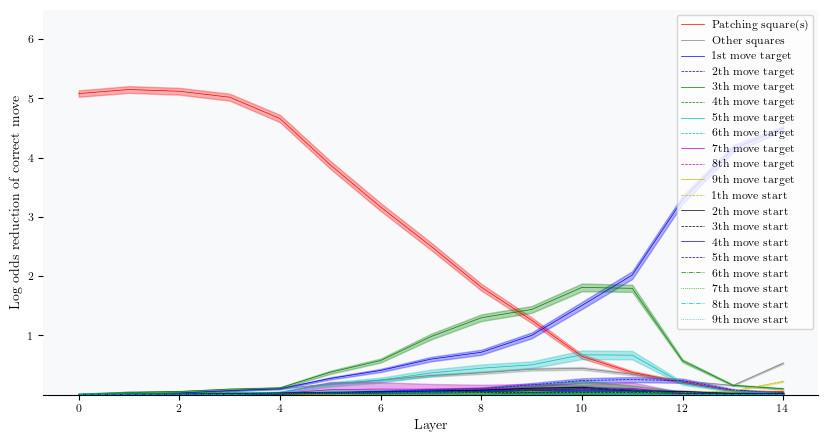

In [46]:
plot_residual_effects(allowed_lengths=[3, 4, 5, 6, 7, 8, 9], include_starting=True)

Skipped 7568 out of 8192 puzzles (92.38%)
Patching: 624, Other: 624, 1st: 624, 2nd: 204, 3rd: 614, 4th: 308, 5th: 252, 6th: 50, 7th: 39, 8th: 6, 9th: 7


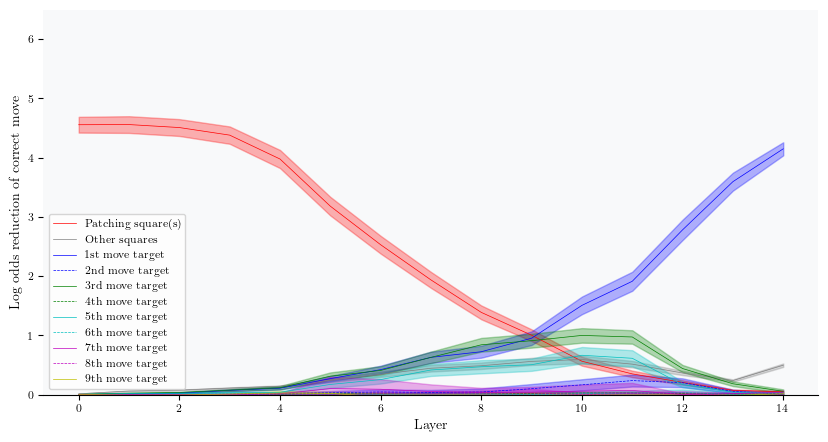

In [276]:
plot_residual_effects(allowed_lengths=[3, 4, 5, 6, 7, 8, 9])

Skipped 7709 out of 8192 puzzles (94.10%)
Patching: 483, Other: 483, 1st: 483, 2nd: 142, 3rd: 463, 4th: 34, 5th: 22, 6th: 1, 7th: 1, 8th: 0, 9th: 0


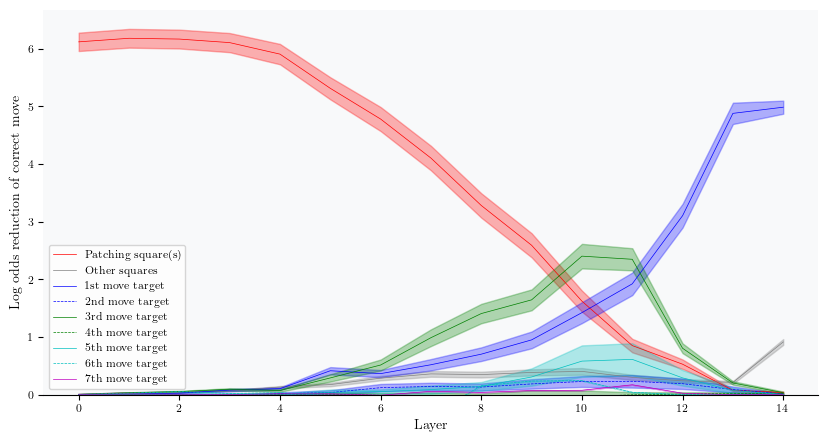

In [268]:
plot_residual_effects(allowed_lengths=[3, 4, 5, 6, 7, 8, 9])

In [39]:
for i, effect_data in enumerate(effects_data):
    effects = effect_data["effects"]
    mean_effects = np.mean(effects, axis=0)
    stderr_effects = np.std(effects, axis=0) / np.sqrt(len(effects))
    print(
        f"{effect_data['name']}: {mean_effects[10]:.2f} ± {2 * stderr_effects[10]:.2f}"
    )

1st move target: 1.53 ± 1.64
3rd move target: 1.23 ± 1.07
Patching square(s): 0.88 ± 0.99
Other squares: 0.87 ± 0.83


Skipped 0 out of 2 puzzles (0.00%)


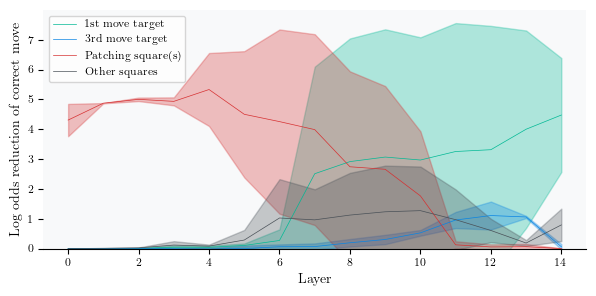

In [40]:
plot_residual_effects(
    mask=different_targets_mask,
    save_path=different_targets_dir / "residual_stream_patching.pdf",
)

Skipped 4 out of 8 puzzles (50.00%)


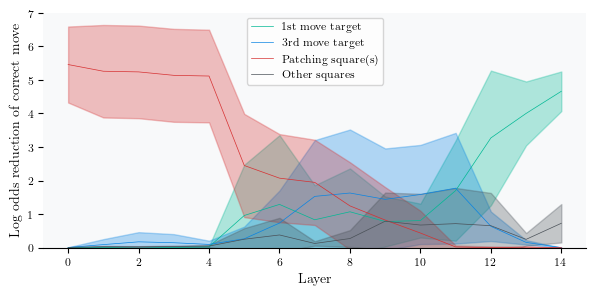

In [41]:
plot_residual_effects(
    mask=same_targets_mask, save_path=same_targets_dir / "residual_stream_patching.pdf"
)

## Attention heads

In [79]:
all_effects = torch.load(
    "results/global_patching/attention_head_results.pt", map_location=device
)
all_effects.shape

/tmp/ipykernel_2770328/1097879826.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  all_effects = torch.load(


torch.Size([22517, 15, 24])

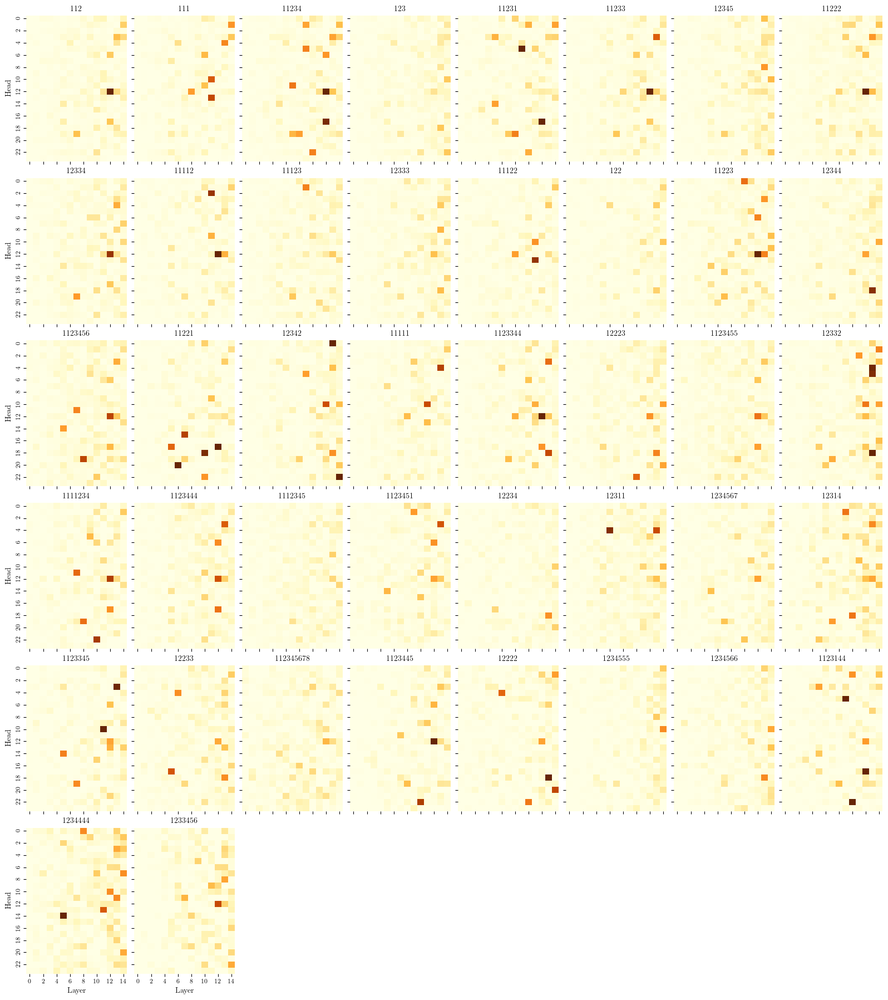

In [93]:
def plot_attention_grid():
    # Calculate the number of rows and columns for the grid
    n_plots = len(good_results)
    n_cols = 8  # You can adjust this
    n_rows = (n_plots + n_cols - 1) // n_cols

    # Create a grid of subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(2*n_cols, 3*n_rows), sharex=True, sharey=True)

    best_heads = {}
    for idx, (possibility, mask) in enumerate(zip(list(good_results), good_mask)):
        row = idx // n_cols
        col = idx % n_cols
        ax = axes[row, col] if n_rows > 1 else axes[col]

        if mask is None:
            mask = np.ones(len(all_effects), dtype=bool)
        effects = all_effects[mask]

        mean_effects = -effects.mean(dim=0).cpu().numpy()
        
        # Find the 5 most important heads
        flat_indices = np.argsort(mean_effects.flatten())[-5:][::-1]
        top_5_heads = [((idx // mean_effects.shape[1], idx % mean_effects.shape[1]), mean_effects.flatten()[idx]) for idx in flat_indices]
        best_heads[possibility] = top_5_heads

        try:
            sns.heatmap(mean_effects.T, cmap=fh.EFFECTS_CMAP_2, ax=ax, cbar=False, vmin=0, vmax=0.5)
            ax.set_title(f"{possibility}")
            if col == 0:
                ax.set_ylabel("Head")
            if row == n_rows - 1:
                ax.set_xlabel("Layer")
        except ValueError:
            ax.axis('off')

    # Remove any unused subplots
    for idx in range(len(good_results), n_rows * n_cols):
        row = idx // n_cols
        col = idx % n_cols
        axes[row, col].axis('off') if n_rows > 1 else axes[col].axis('off')

    plt.tight_layout()
    plt.show()
    return best_heads

best_heads = plot_attention_grid()

In [94]:
best_heads

{'112': [((12, 12), 0.73187083),
  ((13, 3), 0.19392104),
  ((7, 19), 0.18962872),
  ((12, 17), 0.18340151),
  ((12, 6), 0.17263435)],
 '111': [((11, 13), 0.38640407),
  ((11, 10), 0.35104173),
  ((13, 4), 0.2779335),
  ((14, 1), 0.2561662),
  ((8, 12), 0.24425742)],
 '11234': [((12, 12), 0.54823184),
  ((12, 17), 0.47619388),
  ((7, 11), 0.30388424),
  ((10, 22), 0.28601015),
  ((9, 5), 0.28558373)],
 '123': [((13, 18), 0.18147124),
  ((14, 22), 0.17618088),
  ((14, 10), 0.17460145),
  ((12, 12), 0.124087594),
  ((10, 22), 0.114423305)],
 '11231': [((12, 17), 1.7485684),
  ((9, 5), 0.67339236),
  ((8, 19), 0.29055065),
  ((5, 14), 0.23878504),
  ((14, 1), 0.23679231)],
 '11233': [((12, 12), 0.9957917),
  ((13, 3), 0.34254655),
  ((7, 19), 0.181205),
  ((12, 17), 0.17164707),
  ((10, 6), 0.17093304)],
 '12345': [((13, 8), 0.25143093),
  ((14, 10), 0.20081934),
  ((13, 0), 0.18894611),
  ((14, 22), 0.1702574),
  ((7, 19), 0.1613613)],
 '11222': [((12, 12), 0.8148855),
  ((13, 3), 0.2554

In [96]:
head_to_possibilities

{(12, 12): ['1123344',
  '11233',
  '11222',
  '11223',
  '112',
  '1123445',
  '11112',
  '11234',
  '12334',
  '1111234',
  '1123456',
  '1233456',
  '1123444',
  '1123455',
  '12223',
  '1123144',
  '1123451',
  '1234567',
  '1123345',
  '12344',
  '12233',
  '112345678',
  '12333',
  '123'],
 (13, 3): ['1123345',
  '1123451',
  '1123444',
  '11233',
  '1123344',
  '12314',
  '11222',
  '11223',
  '1123456',
  '112',
  '1123445',
  '1123455'],
 (13, 18): ['12332',
  '12222',
  '12344',
  '1123344',
  '12223',
  '1234566',
  '12233',
  '12342',
  '12234',
  '12333',
  '123',
  '122'],
 (7, 19): ['1123345',
  '12334',
  '12314',
  '112',
  '1234567',
  '11233',
  '11123',
  '12345',
  '12344',
  '1112345',
  '1234555'],
 (12, 17): ['1123144',
  '11231',
  '11221',
  '11234',
  '1123444',
  '1111234',
  '1123344',
  '1123455',
  '112',
  '12334',
  '11233'],
 (13, 12): ['11223',
  '12314',
  '11112',
  '11222',
  '12311',
  '1123455',
  '11123',
  '1123444',
  '1112345',
  '112345678']

In [95]:
def create_head_to_possibilities_dict(best_heads):
    head_to_possibilities = {}
    for possibility, heads in best_heads.items():
        for head, effect in heads:
            if head not in head_to_possibilities:
                head_to_possibilities[head] = []
            head_to_possibilities[head].append((possibility, effect))
    
    # Sort each list by effect (descending) and keep only the possibilities
    for head in head_to_possibilities:
        head_to_possibilities[head].sort(key=lambda x: x[1], reverse=True)
        head_to_possibilities[head] = [p for p, _ in head_to_possibilities[head]]
    
    # Sort the dictionary by the number of possibilities for each head
    sorted_dict = dict(sorted(head_to_possibilities.items(), key=lambda item: len(item[1]), reverse=True))
    
    return sorted_dict

# Create the dictionary
head_to_possibilities = create_head_to_possibilities_dict(best_heads)

# Print the results
for head, possibilities in head_to_possibilities.items():
    print(f"Head {head}: {len(possibilities)} possibilities")
    print(f"  {', '.join(possibilities)}")
    print()

Head (12, 12): 24 possibilities
  1123344, 11233, 11222, 11223, 112, 1123445, 11112, 11234, 12334, 1111234, 1123456, 1233456, 1123444, 1123455, 12223, 1123144, 1123451, 1234567, 1123345, 12344, 12233, 112345678, 12333, 123

Head (13, 3): 12 possibilities
  1123345, 1123451, 1123444, 11233, 1123344, 12314, 11222, 11223, 1123456, 112, 1123445, 1123455

Head (13, 18): 12 possibilities
  12332, 12222, 12344, 1123344, 12223, 1234566, 12233, 12342, 12234, 12333, 123, 122

Head (7, 19): 11 possibilities
  1123345, 12334, 12314, 112, 1234567, 11233, 11123, 12345, 12344, 1112345, 1234555

Head (12, 17): 11 possibilities
  1123144, 11231, 11221, 11234, 1123444, 1111234, 1123344, 1123455, 112, 12334, 11233

Head (13, 12): 10 possibilities
  11223, 12314, 11112, 11222, 12311, 1123455, 11123, 1123444, 1112345, 112345678

Head (14, 1): 9 possibilities
  12332, 111, 12222, 11231, 11222, 11122, 11112, 122, 1112345

Head (14, 10): 9 possibilities
  1234555, 12223, 1234566, 12344, 12311, 12345, 122, 123

In [97]:
def create_head_to_possibilities_dict_with_effects(best_heads):
    head_to_possibilities = {}
    for possibility, heads in best_heads.items():
        for head, effect in heads:
            if head not in head_to_possibilities:
                head_to_possibilities[head] = []
            head_to_possibilities[head].append((possibility, effect))
    
    # Sort each list by effect (descending)
    for head in head_to_possibilities:
        head_to_possibilities[head].sort(key=lambda x: x[1], reverse=True)
    
    # Sort the dictionary by the number of possibilities for each head
    sorted_dict = dict(sorted(head_to_possibilities.items(), key=lambda item: len(item[1]), reverse=True))
    
    return sorted_dict

# Create the dictionary
head_to_possibilities_with_effects = create_head_to_possibilities_dict_with_effects(best_heads)

# Print the results
for head, possibilities in head_to_possibilities_with_effects.items():
    print(f"Head {head}: {len(possibilities)} possibilities")
    for possibility, effect in possibilities:
        print(f"  {possibility}: {effect:.4f}")
    print()

Head (12, 12): 24 possibilities
  1123344: 1.3209
  11233: 0.9958
  11222: 0.8149
  11223: 0.7480
  112: 0.7319
  1123445: 0.6105
  11112: 0.5838
  11234: 0.5482
  12334: 0.4376
  1111234: 0.4085
  1123456: 0.3956
  1233456: 0.3813
  1123444: 0.3668
  1123455: 0.3080
  12223: 0.2595
  1123144: 0.2465
  1123451: 0.2380
  1234567: 0.2370
  1123345: 0.2327
  12344: 0.2325
  12233: 0.2272
  112345678: 0.2057
  12333: 0.1914
  123: 0.1241

Head (13, 3): 12 possibilities
  1123345: 0.4883
  1123451: 0.3608
  1123444: 0.3462
  11233: 0.3425
  1123344: 0.3200
  12314: 0.2722
  11222: 0.2555
  11223: 0.2542
  1123456: 0.2213
  112: 0.1939
  1123445: 0.1775
  1123455: 0.1723

Head (13, 18): 12 possibilities
  12332: 0.5511
  12222: 0.4998
  12344: 0.4583
  1123344: 0.3824
  12223: 0.2825
  1234566: 0.2721
  12233: 0.2676
  12342: 0.2627
  12234: 0.2626
  12333: 0.1957
  123: 0.1815
  122: 0.1607

Head (7, 19): 11 possibilities
  1123345: 0.2719
  12334: 0.2486
  12314: 0.2456
  112: 0.1896
  123

In [ ]:
# (13, 3): Applies to 112 setups
# (13, 18): Applies to 123, 122 setups
# (12, 17): Applies to 11231 setups

In [54]:
def plot_attention_effects(mask=None):
    if mask is None:
        mask = np.ones(len(all_effects), dtype=bool)
    effects = all_effects[mask]

    mean_effects = -effects.mean(dim=0)
    fh.set()
    plt.figure(figsize=(fh.get_width(0.3), 2))
    plt.imshow(mean_effects.cpu().numpy().T, cmap=fh.EFFECTS_CMAP_2)
    plt.title("Mean patching effects")
    plt.ylabel("Head")
    plt.xlabel("Layer")
    plt.colorbar(fraction=0.10)
    plt.show()

112


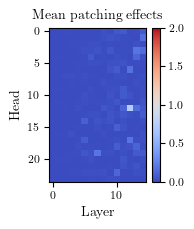

111


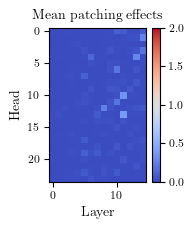

11234


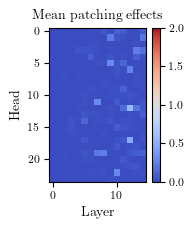

123


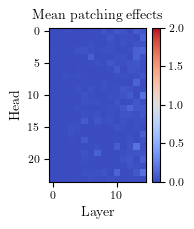

11231


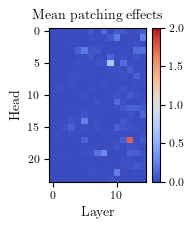

11233


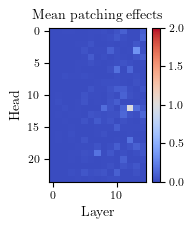

12345


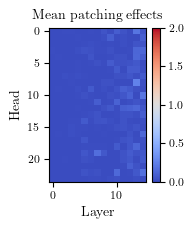

11222


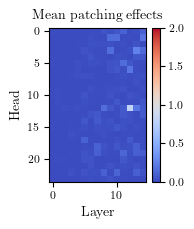

12334


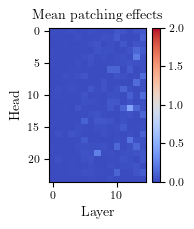

11112


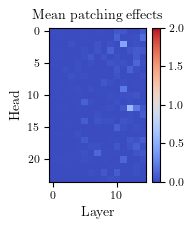

11123


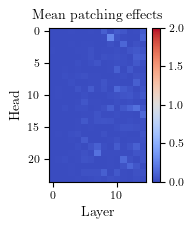

12333


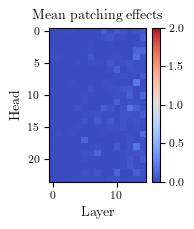

11122


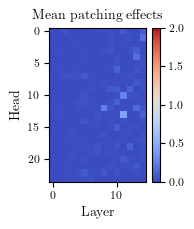

122


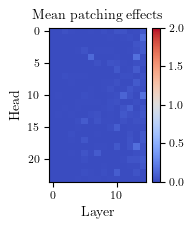

11223


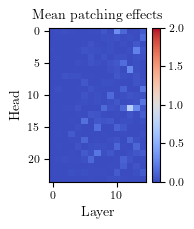

12344


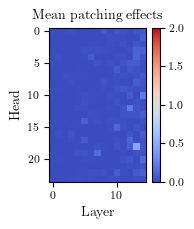

1123456


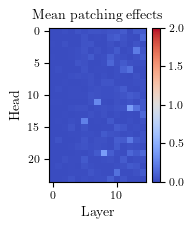

In [52]:
for possibility, mask in zip(list(good_results), good_mask):
    print(possibility)
    try:
        plot_attention_effects(mask=mask)
    except ValueError:
        continue

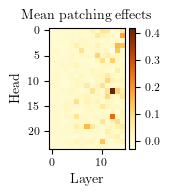

In [43]:
plot_attention_effects()
fh.save("figures/attention_head_patching.pdf")

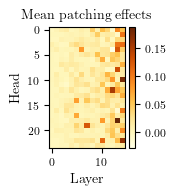

In [44]:
plot_attention_effects(mask=different_targets_mask)
fh.save(different_targets_dir / "attention_head_patching.pdf")

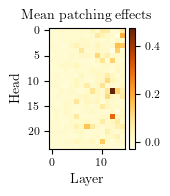

In [45]:
plot_attention_effects(mask=same_targets_mask)
fh.save(same_targets_dir / "attention_head_patching.pdf")

# L12H17

In [103]:
third_to_first_effects = torch.load(
    "results/L12H17/third_to_first_ablation.pt", map_location=device
)
other_effects = torch.load("results/L12H17/other_ablation.pt", map_location=device)
print(third_to_first_effects.shape, other_effects.shape)

torch.Size([1360]) torch.Size([1360])


/tmp/ipykernel_2770328/3144759985.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  third_to_first_effects = torch.load(
/tmp/ipykernel_2770328/3144759985.py:4: FutureWarn

In [104]:
def plot_ablation_effects(mask=None):
    if mask is None:
        mask = slice(None)

    data = {}
    _third_to_first_effects = third_to_first_effects[mask]
    _other_effects = other_effects[mask]

    data[r"3rd$\to$1st target"] = _third_to_first_effects.cpu().numpy()

    data["Other"] = _other_effects.cpu().numpy()

    colors = {
        r"3rd$\to$1st target": fh.COLORS[0],
        "Other": fh.COLORS[-1],
    }

    fh.set()
    return fh.plot_percentiles(
        data,
        zoom_start=94,
        zoom_width_ratio=0.7,
        colors=colors,
        title="Attention ablation effects",
        figsize=(fh.get_width(0.66), 2),
        tick_frequency=25,
        zoom_tick_frequency=2,
        y_lower=-1,
    )

0th percentile (3rd$\to$1st target): -0.35 +- 0.00
10th percentile (3rd$\to$1st target): 0.00 +- 0.00
20th percentile (3rd$\to$1st target): 0.05 +- 0.04
30th percentile (3rd$\to$1st target): 0.63 +- 0.20
40th percentile (3rd$\to$1st target): 1.53 +- 0.17
50th percentile (3rd$\to$1st target): 2.17 +- 0.16
60th percentile (3rd$\to$1st target): 2.81 +- 0.18
70th percentile (3rd$\to$1st target): 3.39 +- 0.17
80th percentile (3rd$\to$1st target): 4.15 +- 0.17
85th percentile (3rd$\to$1st target): 4.62 +- 0.20
90th percentile (3rd$\to$1st target): 5.12 +- 0.14
95th percentile (3rd$\to$1st target): 5.76 +- 0.21
98th percentile (3rd$\to$1st target): 6.66 +- 0.24
99th percentile (3rd$\to$1st target): 7.01 +- 0.27
100th percentile (3rd$\to$1st target): 7.76 +- 0.00
0th percentile (Other): -1.21 +- 0.00
10th percentile (Other): -0.15 +- 0.03
20th percentile (Other): -0.06 +- 0.01
30th percentile (Other): -0.03 +- 0.00
40th percentile (Other): -0.02 +- 0.00
50th percentile (Other): -0.01 +- 0.00
6

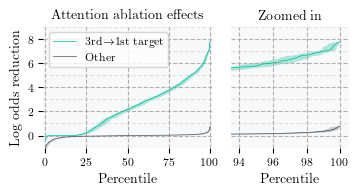

In [105]:
fig = plot_ablation_effects()
fh.save("figures/L12H17_ablation.pdf", fig=fig)

In [106]:
fig = plot_ablation_effects(mask=different_targets_mask)
fh.save(different_targets_dir / "L12H17_ablation.pdf", fig=fig)
fig = plot_ablation_effects(mask=same_targets_mask)
fh.save(same_targets_dir / "L12H17_ablation.pdf", fig=fig)

IndexError: The shape of the mask [22517] at index 0 does not match the shape of the indexed tensor [1360] at index 0

# L12H17 11234

In [120]:
third_to_first_effects = torch.load(
    "results/L12H17_11234/third_to_first_ablation.pt", map_location=device
)
fifth_to_first_effects = torch.load(
    "results/L12H17_11234/fifth_to_first_ablation.pt", map_location=device
)
fifth_to_third_effects = torch.load(
    "results/L12H17_11234/fifth_to_third_ablation.pt", map_location=device
)
other_effects = torch.load("results/L12H17_11234/other_ablation.pt", map_location=device)
print(third_to_first_effects.shape, other_effects.shape)

torch.Size([3126]) torch.Size([3126])


/tmp/ipykernel_2770328/2910372956.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  third_to_first_effects = torch.load(
/tmp/ipykernel_2770328/2910372956.py:4: FutureWarn

In [125]:
def plot_ablation_effects(mask=None):
    if mask is None:
        mask = slice(None)

    data = {}
    _third_to_first_effects = third_to_first_effects[mask]
    _fifth_to_first_effects = fifth_to_first_effects[mask]
    _fifth_to_third_effects = fifth_to_third_effects[mask]
    _other_effects = other_effects[mask]

    data[r"3rd$\to$1st target"] = _third_to_first_effects.cpu().numpy()
    data[r"5th$\to$1st target"] = _fifth_to_first_effects.cpu().numpy()
    data[r"5th$\to$3rd target"] = _fifth_to_third_effects.cpu().numpy()
    data["Other"] = _other_effects.cpu().numpy()

    colors = {
        r"3rd$\to$1st target": fh.COLORS[0],
        r"5th$\to$1st target": fh.COLORS[1],
        r"5th$\to$3rd target": fh.COLORS[2],
        "Other": fh.COLORS[-1],
    }

    fh.set()
    return fh.plot_percentiles(
        data,
        zoom_start=94,
        zoom_width_ratio=0.7,
        colors=colors,
        title="Attention ablation effects",
        figsize=(fh.get_width(0.66), 2),
        tick_frequency=25,
        zoom_tick_frequency=2,
        y_lower=-1,
    )

0th percentile (3rd$\to$1st target): -0.42 +- 0.00
10th percentile (3rd$\to$1st target): -0.00 +- 0.00
20th percentile (3rd$\to$1st target): 0.00 +- 0.00
30th percentile (3rd$\to$1st target): 0.00 +- 0.00
40th percentile (3rd$\to$1st target): 0.01 +- 0.00
50th percentile (3rd$\to$1st target): 0.07 +- 0.02
60th percentile (3rd$\to$1st target): 0.28 +- 0.06
70th percentile (3rd$\to$1st target): 0.69 +- 0.07
80th percentile (3rd$\to$1st target): 1.25 +- 0.10
85th percentile (3rd$\to$1st target): 1.68 +- 0.13
90th percentile (3rd$\to$1st target): 2.39 +- 0.17
95th percentile (3rd$\to$1st target): 3.59 +- 0.24
98th percentile (3rd$\to$1st target): 5.00 +- 0.29
99th percentile (3rd$\to$1st target): 5.66 +- 0.34
100th percentile (3rd$\to$1st target): 7.10 +- 0.00
0th percentile (5th$\to$1st target): -0.06 +- 0.00
10th percentile (5th$\to$1st target): 0.00 +- 0.00
20th percentile (5th$\to$1st target): 0.00 +- 0.00
30th percentile (5th$\to$1st target): 0.00 +- 0.00
40th percentile (5th$\to$1st 

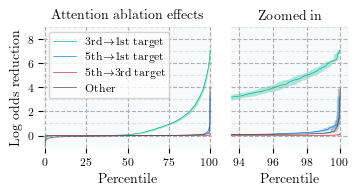

In [126]:
fig = plot_ablation_effects()
fh.save("figures/L12H17_11234_ablation.pdf", fig=fig)

# Probing

In [ ]:
SETTING_TO_PRETTY_NAME = {
    "main": "Probe on trained model",
    "random_model": "Probe on random model",
}


def plot_probe_results(split="all"):
    fh.set(fast=False)
    plt.figure(figsize=(fh.HALF_WIDTH, 2))

    for i, setting in enumerate(["main", "random_model"]):
        results = np.zeros((15, 5))
        for seed in range(5):
            with open(f"results/probing/{split}/{seed}/{setting}.pkl", "rb") as f:
                new_results = pickle.load(f)
                results[:, seed] = new_results["accuracies"]

        means = results.mean(1)
        squared_seed_errors = results.var(1) / results.shape[1]
        # Size of the eval dataset is 30% of all puzzles
        squared_acc_errors = means * (1 - means) / (0.3 * len(puzzles))
        # 2 sigma errors
        errors = 2 * np.sqrt(squared_seed_errors + squared_acc_errors)

        max_layer = means.argmax()

        print(
            f"Max accuracy ({setting}, L{max_layer}): {means[max_layer]:.2f} +- {errors[max_layer]:.2f}"
        )
        plt.plot(
            means,
            label=SETTING_TO_PRETTY_NAME[setting],
            color=fh.COLORS[i],
            linewidth=fh.LINE_WIDTH,
        )
        plt.fill_between(
            range(15),
            means - errors,
            means + errors,
            color=fh.COLORS[i],
            alpha=fh.ERROR_ALPHA,
            linewidth=0,
        )

    plt.title("Third move prediction")
    plt.xlabel("Layer")
    plt.ylabel("Accuracy")
    plt.legend()

    plt.ylim(0, 1.0)
    plt.xlim(0, 14)
    plt.gca().spines[:].set_visible(False)
    plt.gca().set_facecolor(fh.PLOT_FACE_COLOR)
    plt.grid(linestyle="--")
    plt.grid(which="minor", alpha=0.3, linestyle="--")

In [ ]:
plot_probe_results()
fh.save("figures/probing.pdf")

In [ ]:
plot_probe_results(split="different_targets")
fh.save(different_targets_dir / "probing.pdf")
plot_probe_results(split="same_targets")
fh.save(same_targets_dir / "probing.pdf")

# Piece movement heads

In [107]:
with open("interesting_puzzles.pkl", "rb") as f:
    puzzles = pickle.load(f)
len(puzzles)

22517

In [109]:
knight_heads

[(0, 17),
 (1, 19),
 (3, 14),
 (3, 15),
 (4, 3),
 (5, 3),
 (5, 13),
 (8, 5),
 (9, 5),
 (14, 22),
 (2, 15),
 (6, 0),
 (6, 10),
 (7, 11),
 (8, 19),
 (9, 4),
 (10, 12),
 (10, 22),
 (11, 17),
 (12, 19),
 (12, 22),
 (13, 0)]

In [108]:
len(knight_heads), len(bishop_heads), len(rook_heads)

(22, 27, 29)

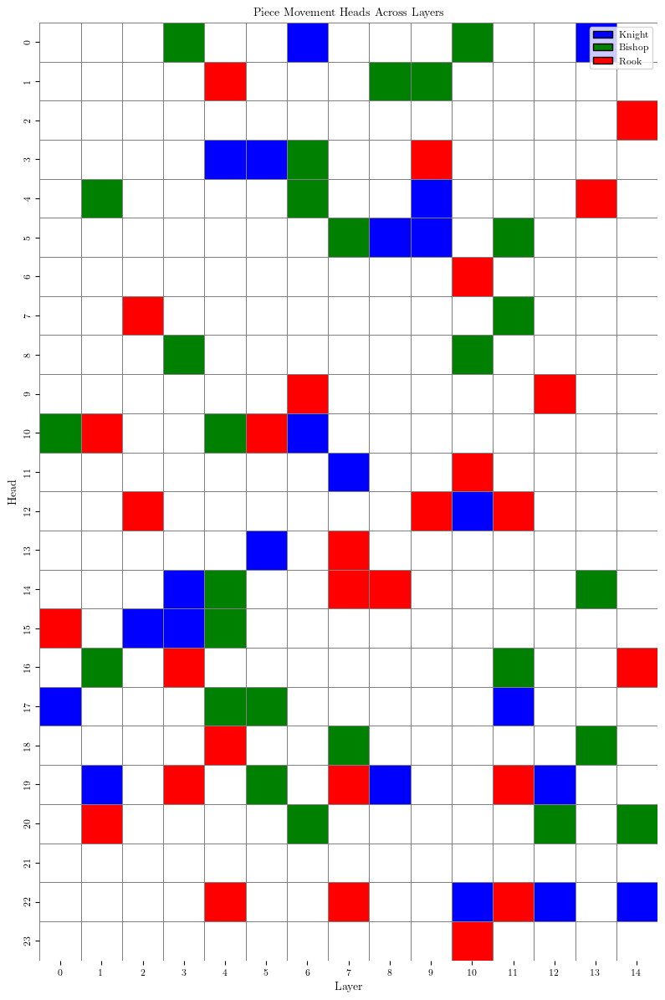

In [116]:
# Create a matrix to hold the data
n_layers = 15
n_heads = 24
data = np.zeros((n_heads, n_layers))

# Fill the matrix with values for each piece type
for layer, head in knight_heads:
    data[head, layer] = 1
for layer, head in bishop_heads:
    data[head, layer] = 2
for layer, head in rook_heads:
    data[head, layer] = 3

# Set up the plot
plt.figure(figsize=(8, 12))

# Create the heatmap
sns.heatmap(data, cmap=['white', 'blue', 'green', 'red'], 
            cbar=False, linewidths=0.5, linecolor='gray')

# Customize the plot
plt.title('Piece Movement Heads Across Layers')
plt.xlabel('Layer')
plt.ylabel('Head')

# Create a custom legend
legend_elements = [Patch(facecolor='blue', edgecolor='black', label='Knight'),
                   Patch(facecolor='green', edgecolor='black', label='Bishop'),
                   Patch(facecolor='red', edgecolor='black', label='Rook')]
plt.legend(handles=legend_elements, loc='upper right')

# Show the plot
plt.tight_layout()
plt.show()

In [110]:
N = 4
patterns = torch.zeros(N, 15, 24, 64, 64, device=device)

boards = [LeelaBoard.from_puzzle(p) for _, p in puzzles.sample(N).iterrows()]

with model.trace(boards):
    for layer in range(15):
        patterns[:, layer] = model.attention_scores(layer).output.save()

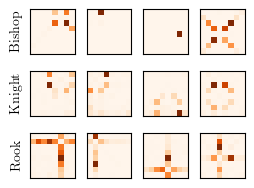

In [111]:
query_indices = random.sample(range(64), N)
plt.figure(figsize=(fh.HALF_WIDTH, 2))
layer = 5

layer_bishop_heads = [head for _layer, head in bishop_heads if _layer == layer]
layer_knight_heads = [head for _layer, head in knight_heads if _layer == layer]
layer_rook_heads = [head for _layer, head in rook_heads if _layer == layer]

if not (layer_bishop_heads and layer_knight_heads and layer_rook_heads):
    raise ValueError("No good heads in this layer, pick a different one")

bishop_head = random.choice(layer_bishop_heads)
knight_head = random.choice(layer_knight_heads)
rook_head = random.choice(layer_rook_heads)

fh.set()

for row, (name, head) in enumerate(
    zip(["Bishop", "Knight", "Rook"], [bishop_head, knight_head, rook_head])
):
    for i in range(N):
        plt.subplot(3, N, row * N + i + 1)
        if i == 0:
            plt.ylabel(
                name,
                rotation=90,
                labelpad=10,
                verticalalignment="center",
            )
        plt.imshow(
            patterns[i, layer, head, query_indices[i], :].cpu().numpy().reshape(8, 8),
            cmap="Oranges",
        )
        plt.xticks([])
        plt.yticks([])
fh.save("figures/piece_movement_patterns.pdf")

In [113]:
save_dir = Path("results/piece_movement_heads")
data = torch.load(save_dir / "effects.pt", map_location=device)
effects = data["effects"]
piece_movement_mask = data["mask"]

/tmp/ipykernel_2770328/120337627.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  data = torch.load(save_dir / "effects.pt", map_location=device)


FileNotFoundError: [Errno 2] No such file or directory: 'results/piece_movement_heads/effects.pt'

In [ ]:
def plot_piece_movement_ablation(mask=None):
    if mask is None:
        mask = slice(None)
    else:
        mask = mask[piece_movement_mask]
    data = {}
    colors = {}
    for i, name in enumerate(["Main ablation", "Other piece types", "Random square"]):
        data[name] = effects[("key", name)].squeeze().cpu().numpy()[mask]
        colors[name] = fh.COLORS[i]
    fh.set()
    fh.plot_percentiles(
        data,
        title="Piece movement head ablation",
        colors=colors,
        figsize=(fh.HALF_WIDTH, 2),
        y_lower=-1,
        tick_frequency=25,
        y_ticks=[0, 2, 4, 6, 8],
    )

In [ ]:
plot_piece_movement_ablation()
fh.save("figures/piece_movement_ablation.pdf")

In [ ]:
plot_piece_movement_ablation(mask=different_targets_mask)
fh.save(different_targets_dir / "piece_movement_ablation.pdf")
plot_piece_movement_ablation(mask=same_targets_mask)
fh.save(same_targets_dir / "piece_movement_ablation.pdf")

# Positional encodings
These are the domain-specific positional encodings used by Leela.

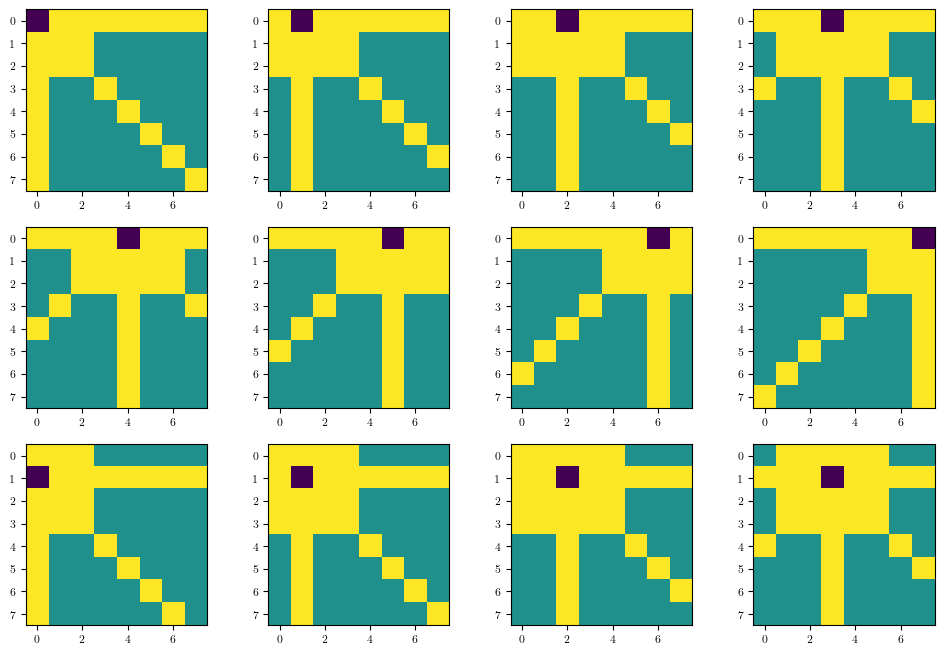

In [47]:
plt.figure(figsize=(12, 8))
for i in range(12):
    plt.subplot(3, 4, i + 1)
    plt.imshow(
        model._lc0_model.initializers.onnx_initializer_4.cpu()
        .numpy()[0, i]
        .reshape(8, 8)
    )

plt.show()